In [1]:
import quandl
dict_stock = {'Apple Inc.': 'AAPL',}
        # 'Microsoft Corporation': 'MSFT',
        # 'Alphabet Inc.': 'GOOGL',
        # 'Amazon.com Inc.': 'AMZN',
        # 'Intel Corporation': 'INTC',
        # 'Cisco Systems, Inc.': 'CSCO',
        # 'NVIDIA Corporation': 'NVDA',
        # 'Adobe Inc.': 'ADBE',
        # 'IBM': 'IBM',
        # 'Oracle Corporation': 'ORCL',
        # 'Salesforce.com Inc.': 'CRM',
        # 'Texas Instruments Incorporated': 'TXN',
        # 'Advanced Micro Devices, Inc.': 'AMD',
        # 'Applied Materials, Inc.': 'AMAT',
        # 'Qualcomm Incorporated': 'QCOM',
        # 'Johnson & Johnson': 'JNJ',
        # 'Pfizer Inc.': 'PFE',
        # 'Merck & Co., Inc.': 'MRK',
        # 'Roche Holding AG': 'ROG',
        # 'Abbott Laboratories': 'ABT',
        # 'Johnson & Johnson': 'JNJ',
        # 'Pfizer Inc.': 'PFE',
        # 'Merck & Co., Inc.': 'MRK',
        # 'Roche Holding AG': 'ROG',
        # 'Abbott Laboratories': 'ABT',
        # 'Bristol Myers Squibb Company': 'BMY',
        # 'Gilead Sciences, Inc.': 'GILD',
        # 'Eli Lilly and Company': 'LLY',
        # 'Amgen Inc.': 'AMGN',
        # 'Biogen Inc.': 'BIIB',
        # 'Thermo Fisher Scientific Inc.': 'TMO',
        # 'Regeneron Pharmaceuticals, Inc.': 'REGN',
        # 'Vertex Pharmaceuticals Incorporated': 'VRTX',
        # 'Exxon Mobil Corporation': 'XOM',
        # 'Chevron Corporation': 'CVX',
        # 'BP plc': 'BP',
        # 'ConocoPhillips': 'COP',
        # 'Schlumberger Limited': 'SLB',
        # 'Kinder Morgan, Inc.': 'KMI',
        # 'EOG Resources, Inc.': 'EOG',
        # 'Valero Energy Corporation': 'VLO',
        # 'Phillips 66': 'PSX',
        # 'Occidental Petroleum Corporation': 'OXY',
        # 'EOG Resources, Inc.': 'EOG',
        # 'Procter & Gamble Company': 'PG',
        # 'The Coca-Cola Company': 'KO',
        # 'PepsiCo, Inc.': 'PEP',
        # 'Colgate-Palmolive Company': 'CL',
        # 'The Hershey Company': 'HSY',
        # 'The Estée Lauder Companies Inc.': 'EL',
        # 'Mondelez International, Inc.': 'MDLZ',
        # 'Clorox Company': 'CLX',
        # 'Kimberly-Clark Corporation': 'KMB',
        # 'General Mills, Inc.': 'GIS',
        # 'The Kraft Heinz Company': 'KHC',
        # 'Molson Coors Beverage Company': 'TAP',
        # 'Constellation Brands, Inc.': 'STZ',
        # 'Church & Dwight Co., Inc.': 'CHD',}
quandl.ApiConfig.api_key = 'zs3oRyjDLfSoEpPRFxKJ'
data_dfs = {}
for name in dict_stock.keys():
    data_dfs[name] = quandl.get('WIKI/'+dict_stock[name])
data_dfs = {key:value.iloc[:,7:] for key, value in data_dfs.items()}

In [84]:
data_dfs['Apple Inc.']

,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume,Close Price Change Rate
Date,,,,,,
1980-12-12,0.422706,0.424470,0.422706,0.422706,117258400.0,NaN
1980-12-15,0.402563,0.402563,0.400652,0.400652,43971200.0,-0.052174
1980-12-16,0.373010,0.373010,0.371246,0.371246,26432000.0,-0.073394
1980-12-17,0.380362,0.382273,0.380362,0.380362,21610400.0,0.024554
1980-12-18,0.391536,0.393300,0.391536,0.391536,18362400.0,0.029378
...,...,...,...,...,...,...
2018-03-21,175.040000,175.090000,171.260000,171.270000,35247358.0,-0.022655
2018-03-22,170.000000,172.680000,168.600000,168.845000,41051076.0,-0.014159
2018-03-23,168.390000,169.920000,164.940000,164.940000,40248954.0,-0.023128


## First Task: Predict Stock Price itself using CNN

In [2]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,1]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    scaler = MinMaxScaler()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, 400, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

train_data_X shape:  (8100, 400, 5) 
 train_data_y shape:  (8100, 1)


In [4]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(32, (8, 2), input_shape=(400, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 393, 4, 32)        544       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 196, 2, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 191, 1, 64)        24640     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 95, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 92, 1, 16)         4112      
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 1, 8)         

In [5]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])


Epoch 1/35

201/203 [============================>.] - ETA: 0s - loss: 5.0778e-05
Epoch 1: val_loss improved from inf to 0.00937, saving model to best_model.h5


c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


203/203 [==============================] - 9s 33ms/step - loss: 5.0506e-05 - val_loss: 0.0094
Epoch 2/35
201/203 [============================>.] - ETA: 0s - loss: 2.3830e-05
Epoch 2: val_loss did not improve from 0.00937
203/203 [==============================] - 5s 27ms/step - loss: 2.3745e-05 - val_loss: 0.0132
Epoch 3/35
203/203 [==============================] - ETA: 0s - loss: 8.6683e-06
Epoch 3: val_loss did not improve from 0.00937
203/203 [==============================] - 5s 26ms/step - loss: 8.6683e-06 - val_loss: 0.0126
Epoch 4/35
202/203 [============================>.] - ETA: 0s - loss: 1.0262e-05
Epoch 4: val_loss did not improve from 0.00937
203/203 [==============================] - 5s 26ms/step - loss: 1.0308e-05 - val_loss: 0.0126
Epoch 5/35
201/203 [============================>.] - ETA: 0s - loss: 8.9272e-06
Epoch 5: val_loss improved from 0.00937 to 0.00703, saving model to best_model.h5
203/203 [==============================] - 5s 27ms/step - loss: 8.8928e-06 - 

KeyboardInterrupt: 

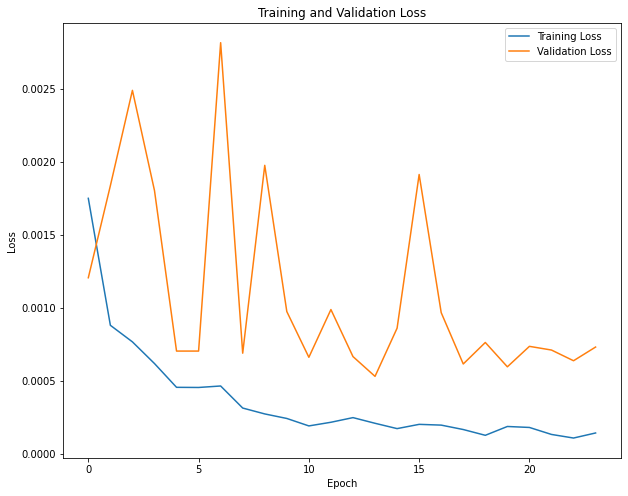

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

254/254 [==============================] - 3s 12ms/step


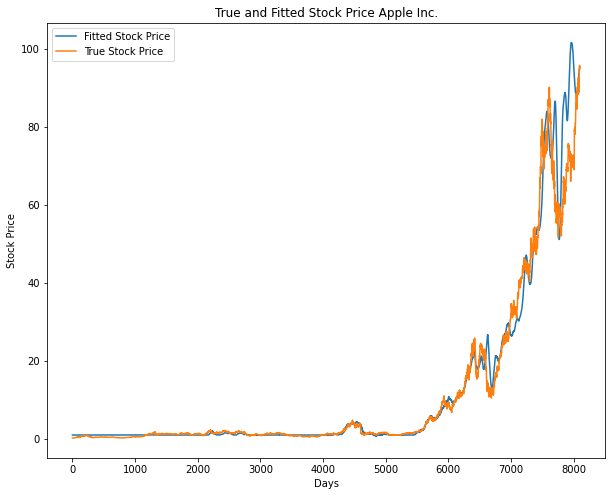

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_fit(best_model, name, 1)

29/29 [==============================] - 0s 10ms/step


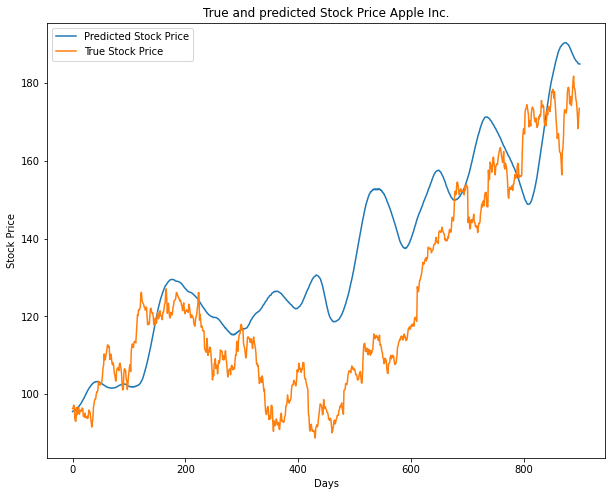

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_predict(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.title('True and predicted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_predict(best_model, name, 1)

24/24 [==============================] - 0s 10ms/step


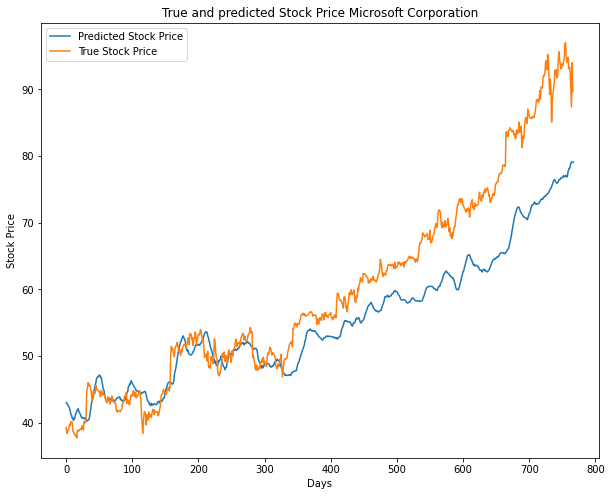

29/29 [==============================] - 0s 9ms/step


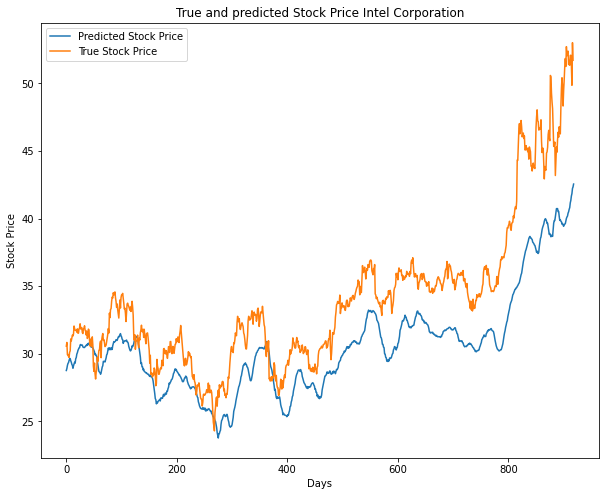

24/24 [==============================] - 0s 8ms/step


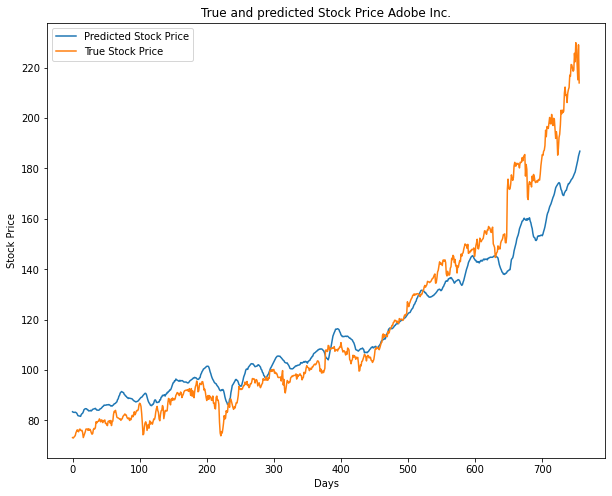

10/10 [==============================] - 0s 11ms/step


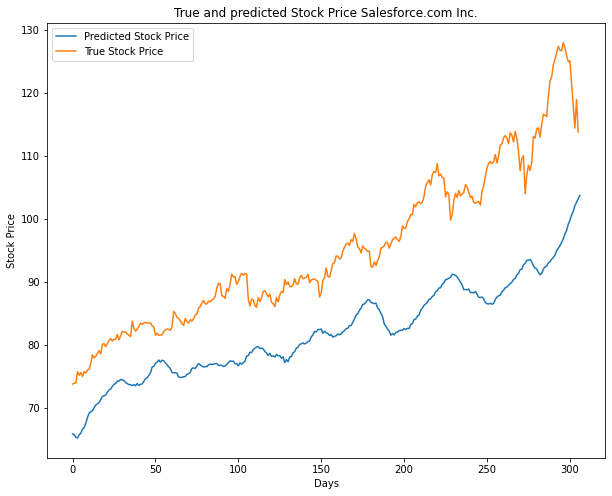

26/26 [==============================] - 0s 9ms/step


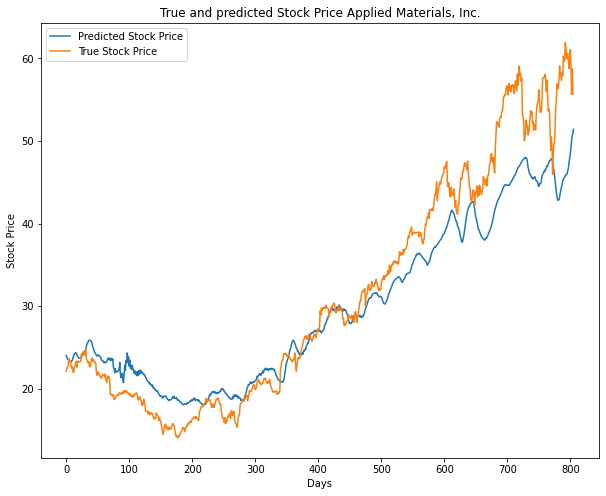

35/35 [==============================] - 0s 8ms/step


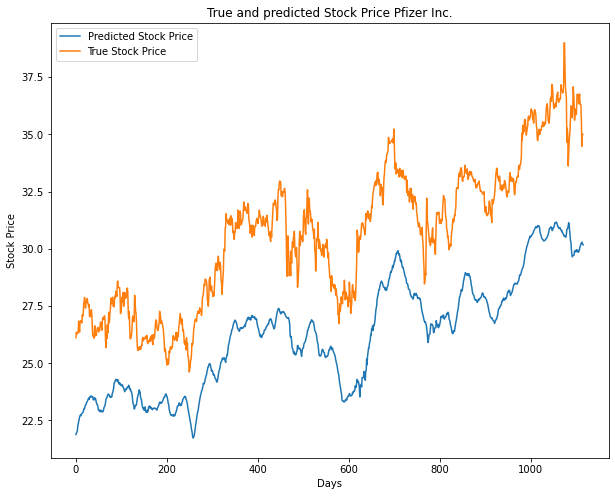

27/27 [==============================] - 0s 7ms/step


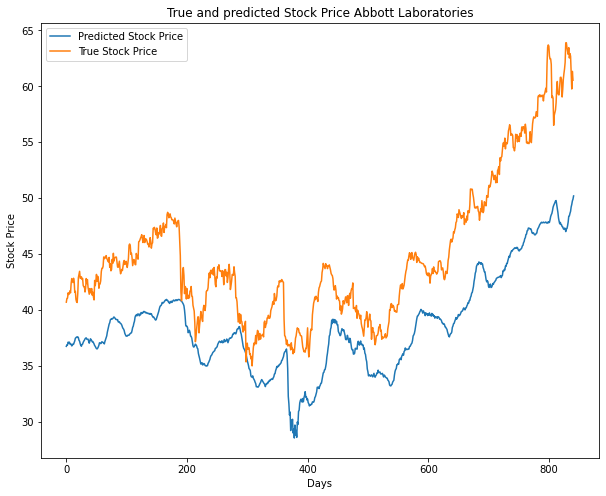

35/35 [==============================] - 0s 10ms/step


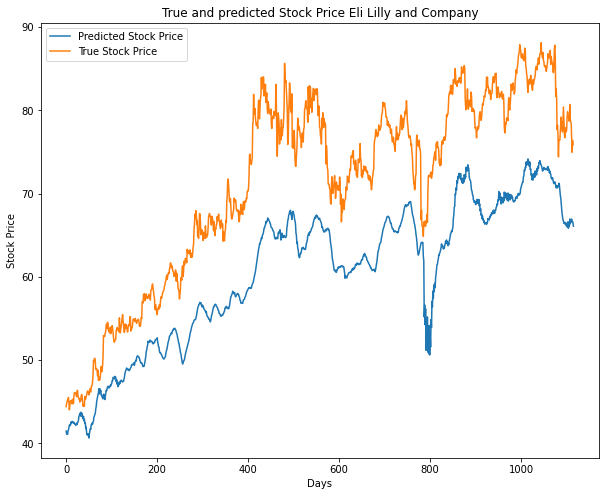

In [8]:
for name in list(dict_stock.keys())[1::3]:
    plot_stock_predict(best_model, name, 1)

10/10 [==============================] - 0s 10ms/step


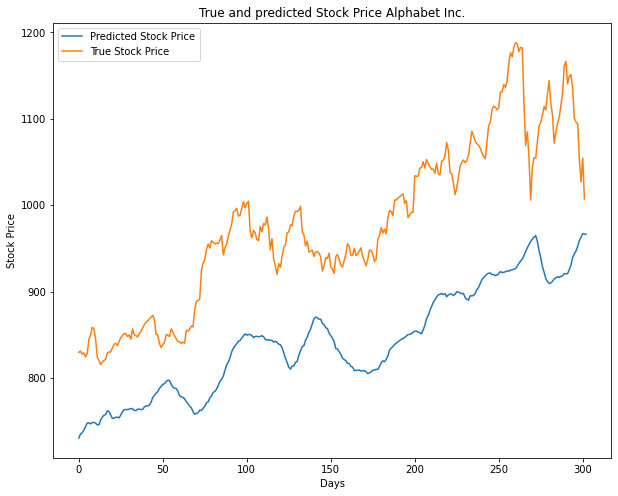

21/21 [==============================] - 0s 8ms/step


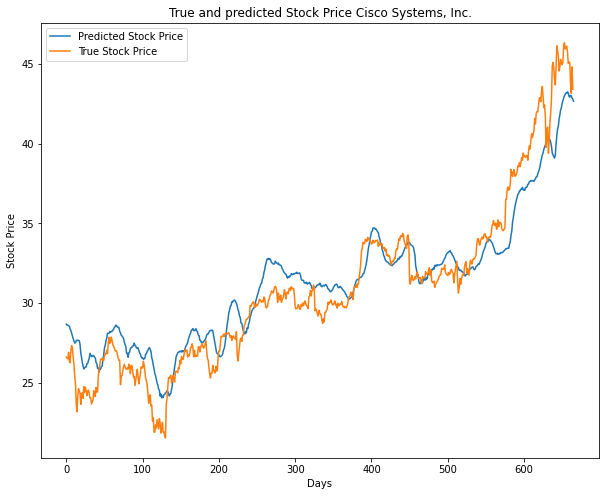

43/43 [==============================] - 1s 11ms/step


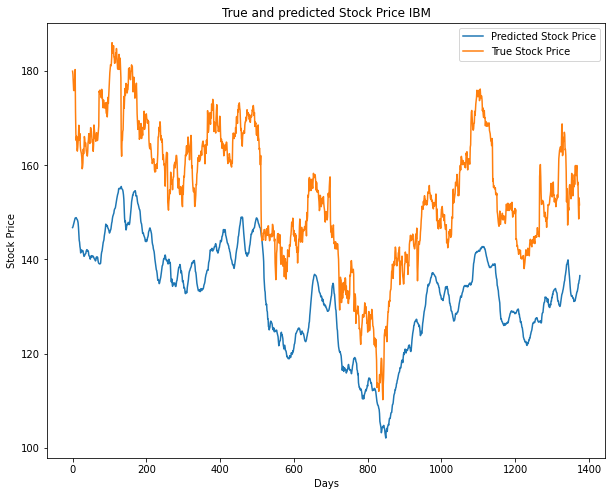

35/35 [==============================] - 0s 10ms/step


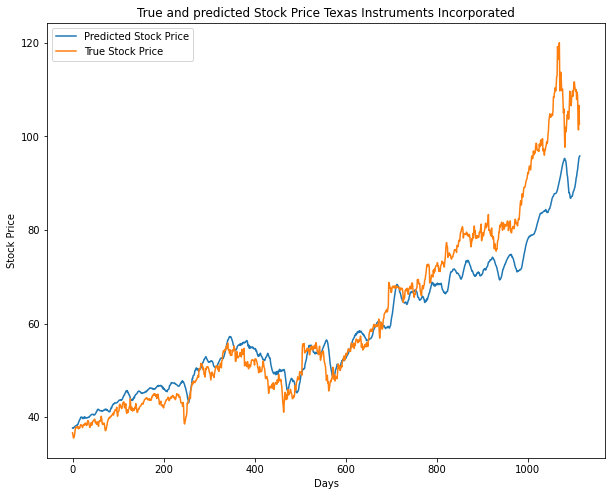

20/20 [==============================] - 0s 10ms/step


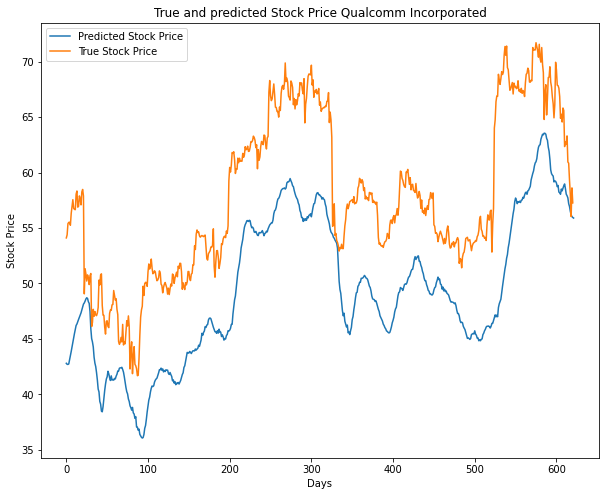

37/37 [==============================] - 0s 8ms/step


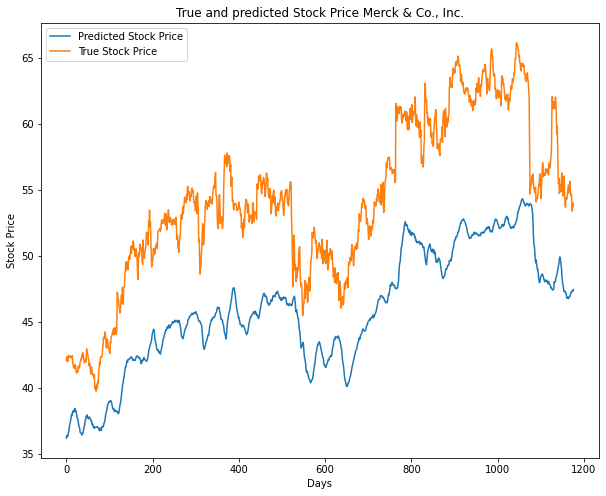

35/35 [==============================] - 0s 10ms/step


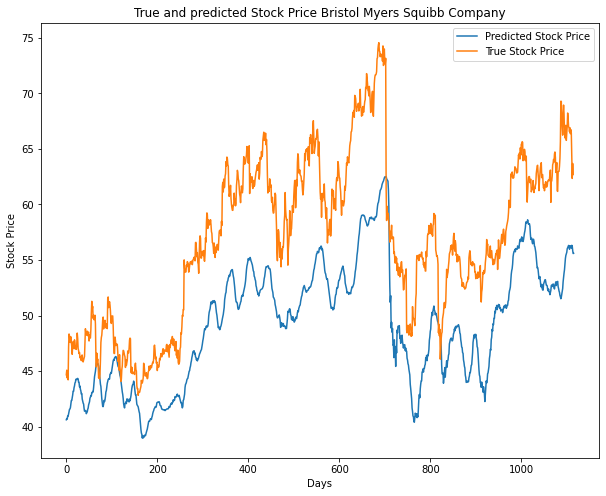

In [9]:
for name in list(dict_stock.keys())[2::3]:
    plot_stock_predict(best_model, name, 1)

#### Using the previous day's closing price as today's closing price is a simple method to get the prediction of today's closing value. We will use this as baseline for comparison.

In [17]:
from sklearn.metrics import mean_squared_error

best_model = load_model('best_model.h5')

def cacl_pred_mse(model, name):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    return mean_squared_error(test_y, pred_y)

def get_pred_mse():
    mse_dict = {}
    for name in dict_stock.keys():
        mse_dict[name] = cacl_pred_mse(best_model, name)
    return mse_dict

def cacl_baseline_mse(name):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = test_y[1:]
    test_y = test_y[:-1]
    return mean_squared_error(test_y, pred_y)

def get_baseline_mse():
    mse_dict = {}
    for name in dict_stock.keys():
        mse_dict[name] = cacl_baseline_mse(name)
    return mse_dict

pred_mse_dict = get_pred_mse()
baseline_mse_dict = get_baseline_mse()
mse_df = pd.DataFrame([pred_mse_dict, baseline_mse_dict]).T

35/35 [==============================] - 0s 10ms/step


In [22]:
mse_df.columns = ["MinMaxScaler Prediction (400 previous days)", "Baseline (Use Last Day)"]
mse_df

,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day)
Apple Inc.,270.109784,3.120314
Microsoft Corporation,54.455868,0.738092
Alphabet Inc.,19924.141530,156.821904
Amazon.com Inc.,13391.496637,222.393537
Intel Corporation,16.855977,0.275912
"Cisco Systems, Inc.",2.933339,0.163733
NVIDIA Corporation,715.541567,15.329314
Adobe Inc.,169.026435,4.022611
IBM,505.118767,3.288771
Oracle Corporation,36.149624,0.318036


In [59]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# This is a function that can be used to do all follwoing processes, note that if our input days number is too small, we may
# need to delete some deeper layes in the CNN such as maxpooling, because we will every very few data here.

# Scaler == "MinMax" or "Standard"

def TimeSeriesCNN_stock_price(input_day_num, Scaler):
    def create_data(data, input_days, output_days):
        sequences = []
        targets = []
        for i in range(len(data) - input_days - output_days + 1):
            seq = data[i:i+input_days,:]
            target = data[i+input_days:i+input_days+output_days,3]
            sequences.append(seq)
            targets.append(target)

        return np.stack(sequences), np.stack(targets)

    train_X_all = np.array([])
    train_y_all = np.array([])
    train_X_dict = {}
    train_y_dict = {}
    test_X_dict = {}
    test_y_dict = {}
    scaler_dict = {}

    for key,val in data_dfs.items():
        if Scaler == "MinMax":
            scaler = MinMaxScaler()
        if Scaler == "Standard":
            scaler = StandardScaler()
        df_standardized_array = scaler.fit_transform(val)
        scaler_dict[key] = scaler
        X, y = create_data(df_standardized_array, input_day_num, 1)
        train_size = int(0.9 * X.shape[0])
        train_X, test_X = X[:train_size,:], X[train_size:,:]
        train_y, test_y = y[:train_size,:], y[train_size:,:]
        train_X_dict[key] = train_X
        train_y_dict[key] = train_y
        test_X_dict[key] = test_X
        test_y_dict[key] = test_y
        if train_X_all.shape == (0,):
            train_X_all = train_X
        else:
            train_X_all = np.vstack((train_X_all, train_X))
        if train_y_all.shape == (0,):
            train_y_all = train_y
        else:
            train_y_all = np.vstack((train_y_all, train_y))

    print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

    from keras.models import Sequential,load_model
    from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
    from keras.layers import Dropout
    from keras.regularizers import l2
    from keras.callbacks import EarlyStopping, ModelCheckpoint
    
    if input_day_num < 11:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        # model.add(Conv2D(64, (6, 2), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 21:
        model = Sequential()
        model.add(Conv2D(32, (8, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 41:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 50:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(16, (4, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
    history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 8))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss' + f" (previous {input_day_num} days, {Scaler}Scaler)")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    # plt.ylim([0,1])
    plt.legend()
    plt.show()

    import pandas as pd
    import matplotlib.pyplot as plt

    def plot_stock_fit(model, name, window_size):
        train_X = train_X_dict[name]
        train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
        fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
        plt.figure(figsize=(10, 8))
        plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
        plt.plot(train_y[window_size:], label='True Stock Price')
        plt.title('True and Fitted Stock Price'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
        plt.xlabel('Days')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    best_model = load_model('best_model.h5')

    for name in list(dict_stock.keys())[0::3]:
        plot_stock_fit(best_model, name, 1)

    def plot_stock_predict(model, name, window_size):
        test_X = test_X_dict[name]
        test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
        pred_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
        plt.figure(figsize=(10, 8))
        plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
        plt.plot(test_y[window_size:], label='True Stock Price')
        plt.title('True and predicted Stock Price'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
        plt.xlabel('Days')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    best_model = load_model('best_model.h5')

    for name in list(dict_stock.keys())[0::3]:
        plot_stock_predict(best_model, name, 1)

    pred_mse_list = get_pred_mse()
    mse_df[f"{Scaler}Scaler Prediction ({str(input_day_num)} previous days)"] = pred_mse_list
    return mse_df

In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# This is a function that can be used to do all follwoing processes, note that if our input days number is too small, we may
# need to delete some deeper layes in the CNN such as maxpooling, because we will every very few data here.

# Scaler == "MinMax" or "Standard"

def TimeSeriesCNN_stock_price(input_day_num, Scaler):
    def create_data(data, input_days, output_days):
        sequences = []
        targets = []
        for i in range(len(data) - input_days - output_days + 1):
            seq = data[i:i+input_days,:]
            target = data[i+input_days:i+input_days+output_days,3]
            sequences.append(seq)
            targets.append(target)

        return np.stack(sequences), np.stack(targets)

    train_X_all = np.array([])
    train_y_all = np.array([])
    train_X_dict = {}
    train_y_dict = {}
    test_X_dict = {}
    test_y_dict = {}
    scaler_dict = {}

    for key,val in data_dfs.items():
        if Scaler == "MinMax":
            scaler = MinMaxScaler()
        if Scaler == "Standard":
            scaler = StandardScaler()
        df_standardized_array = scaler.fit_transform(val)
        scaler_dict[key] = scaler
        X, y = create_data(df_standardized_array, input_day_num, 5)
        train_size = int(0.9 * X.shape[0])
        train_X, test_X = X[:train_size,:], X[train_size:,:]
        train_y, test_y = y[:train_size,:], y[train_size:,:]
        train_X_dict[key] = train_X
        train_y_dict[key] = train_y
        test_X_dict[key] = test_X
        test_y_dict[key] = test_y
        if train_X_all.shape == (0,):
            train_X_all = train_X
        else:
            train_X_all = np.vstack((train_X_all, train_X))
        if train_y_all.shape == (0,):
            train_y_all = train_y
        else:
            train_y_all = np.vstack((train_y_all, train_y))

    print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

    from keras.models import Sequential,load_model
    from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
    from keras.layers import Dropout
    from keras.regularizers import l2
    from keras.callbacks import EarlyStopping, ModelCheckpoint
    
    if input_day_num < 11:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        # model.add(Conv2D(64, (6, 2), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(5, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 21:
        model = Sequential()
        model.add(Conv2D(32, (8, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 41:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(16, (4, 1), activation='relu'))
        # model.add(MaxPooling2D(pool_size=(2, 1)))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        # model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    elif input_day_num < 50:
        model = Sequential()
        model.add(Conv2D(32, (3, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(64, (6, 2), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(16, (4, 1), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 1)))
        model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Conv2D(8, (3, 1), activation='relu'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.summary()

    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
    history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 8))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss' + f" (previous {input_day_num} days, {Scaler}Scaler)")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    # plt.ylim([0,1])
    plt.legend()
    plt.show()

    import pandas as pd
    import matplotlib.pyplot as plt

    def plot_stock_fit(model, name, window_size):
        train_X = train_X_dict[name]
        train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
        fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
        plt.figure(figsize=(10, 8))
        plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
        plt.plot(train_y[window_size:], label='True Stock Price')
        plt.title('True and Fitted Stock Price'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
        plt.xlabel('Days')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    best_model = load_model('best_model.h5')

    for name in list(dict_stock.keys())[0::3]:
        plot_stock_fit(best_model, name, 1)

    def plot_stock_predict(model, name, window_size):
        test_X = test_X_dict[name]
        test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
        pred_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 3), model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 1)), axis=1))[:,3]
        plt.figure(figsize=(10, 8))
        plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
        plt.plot(test_y[window_size:], label='True Stock Price')
        plt.title('True and predicted Stock Price'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
        plt.xlabel('Days')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    best_model = load_model('best_model.h5')

    for name in list(dict_stock.keys())[0::3]:
        plot_stock_predict(best_model, name, 1)

    pred_mse_list = get_pred_mse()
    mse_df[f"{Scaler}Scaler Prediction ({str(input_day_num)} previous days)"] = pred_mse_list
    return mse_df

#### Try previous 200 days (MinMaxScaler)

In [23]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,3]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    scaler = MinMaxScaler()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, 200, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

train_data_X shape:  (176526, 200, 5) 
 train_data_y shape:  (176526, 1)


In [26]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(32, (8, 2), input_shape=(200, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 193, 4, 32)        544       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 96, 2, 32)         0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 91, 1, 64)         24640     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 45, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 42, 1, 16)         4112      
                                                                 
 conv2d_11 (Conv2D)          (None, 40, 1, 8)         

In [27]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

Epoch 1/35
253/256 [============================>.] - ETA: 0s - loss: 0.0015
Epoch 1: val_loss improved from inf to 0.00056, saving model to best_model.h5


c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


256/256 [==============================] - 7s 18ms/step - loss: 0.0015 - val_loss: 5.5589e-04
Epoch 2/35
255/256 [============================>.] - ETA: 0s - loss: 5.6418e-04
Epoch 2: val_loss did not improve from 0.00056
256/256 [==============================] - 4s 14ms/step - loss: 5.6406e-04 - val_loss: 6.2857e-04
Epoch 3/35
255/256 [============================>.] - ETA: 0s - loss: 4.6754e-04
Epoch 3: val_loss did not improve from 0.00056
256/256 [==============================] - 4s 15ms/step - loss: 4.6804e-04 - val_loss: 7.4874e-04
Epoch 4/35
252/256 [============================>.] - ETA: 0s - loss: 4.3732e-04
Epoch 4: val_loss improved from 0.00056 to 0.00043, saving model to best_model.h5
256/256 [==============================] - 4s 15ms/step - loss: 4.3477e-04 - val_loss: 4.3195e-04
Epoch 5/35
256/256 [==============================] - ETA: 0s - loss: 3.6970e-04
Epoch 5: val_loss did not improve from 0.00043
256/256 [==============================] - 4s 15ms/step - loss: 3

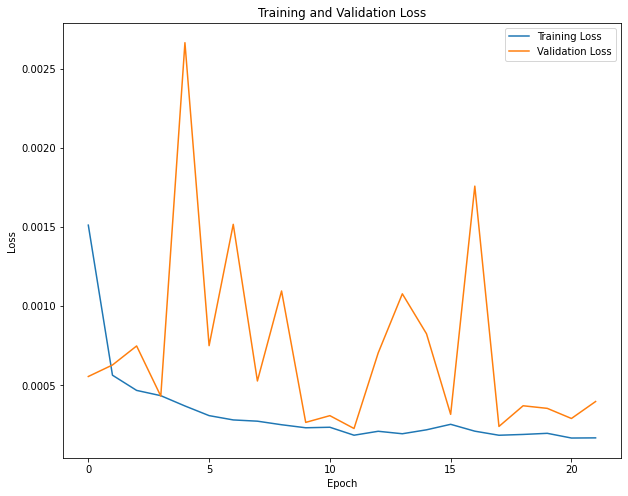

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

259/259 [==============================] - 2s 6ms/step


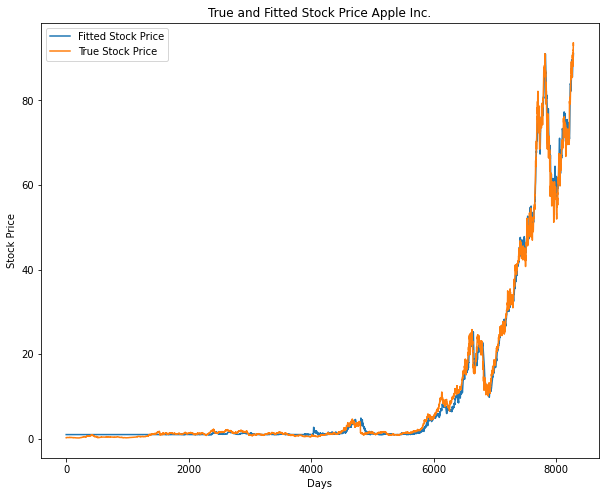

142/142 [==============================] - 1s 5ms/step


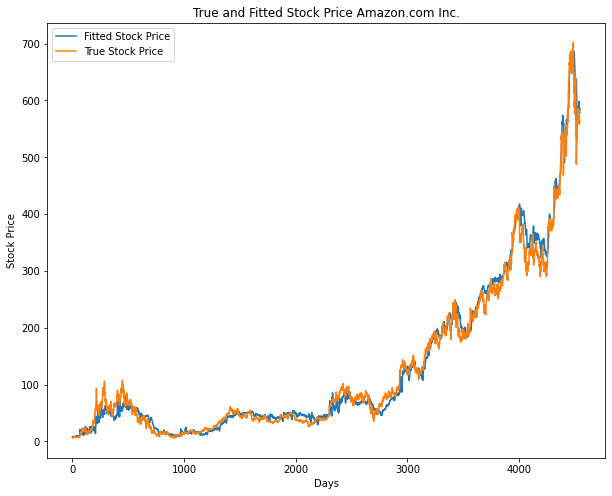

131/131 [==============================] - 1s 5ms/step


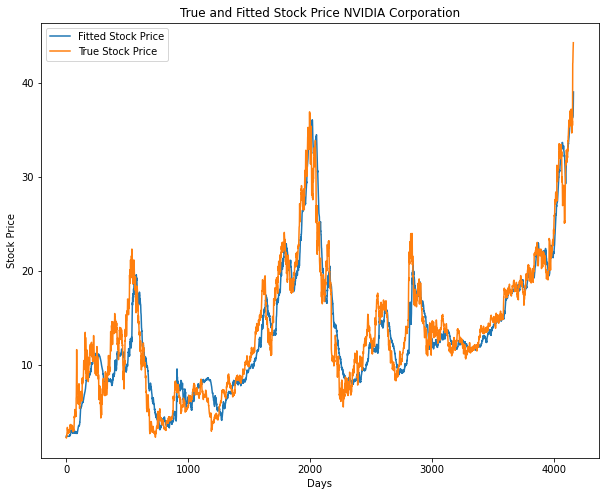

222/222 [==============================] - 1s 5ms/step


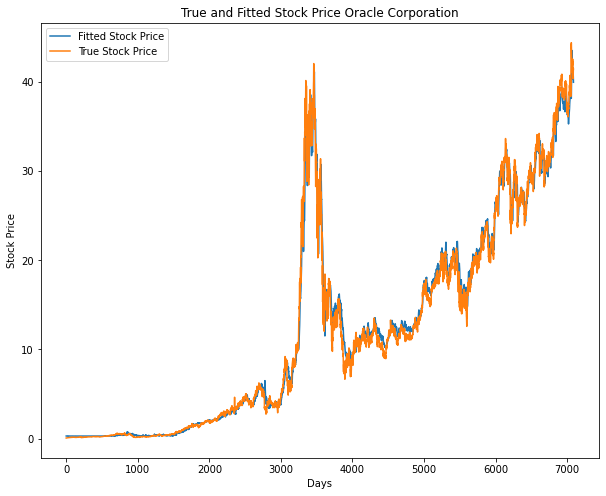

243/243 [==============================] - 1s 5ms/step


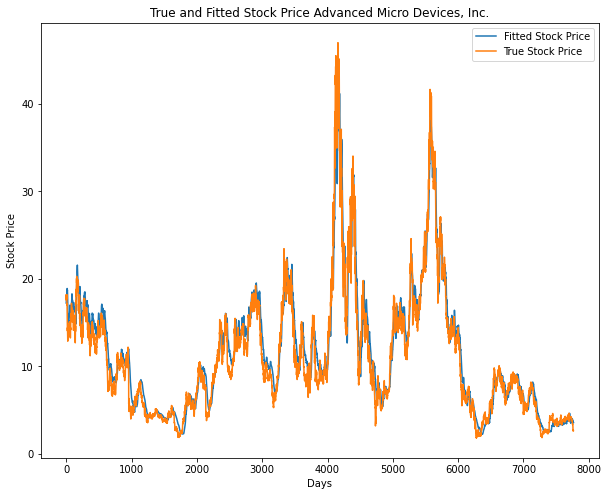

337/337 [==============================] - 2s 5ms/step


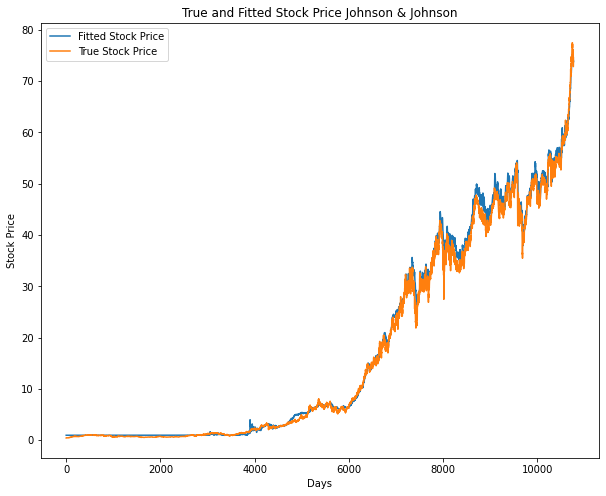

265/265 [==============================] - 1s 6ms/step


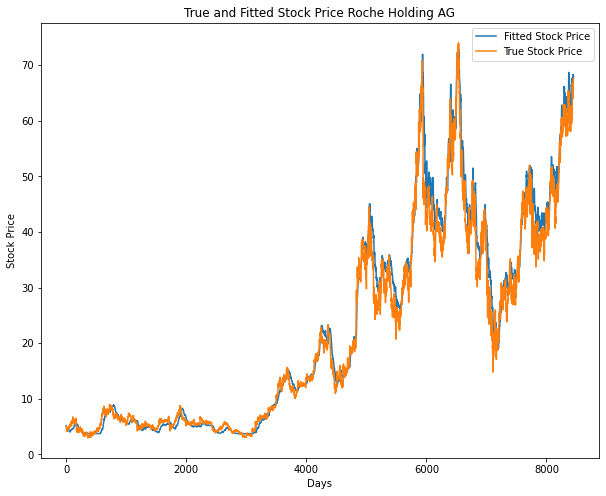

180/180 [==============================] - 1s 6ms/step


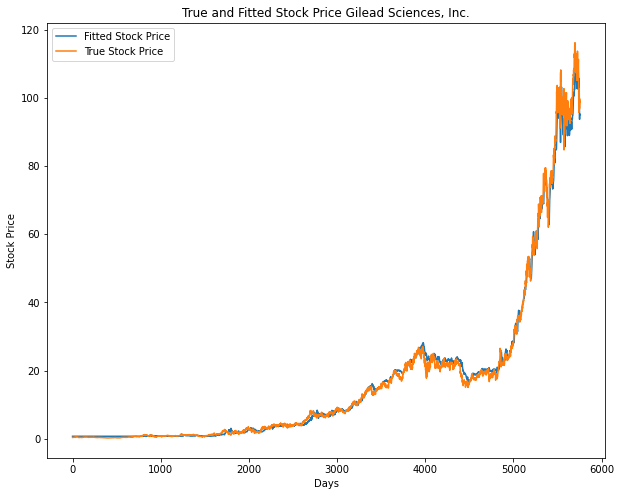

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_fit(best_model, name, 1)

29/29 [==============================] - 0s 7ms/step


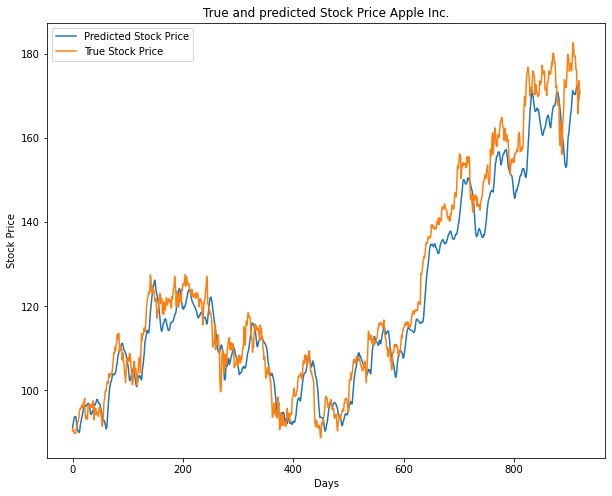

16/16 [==============================] - 0s 7ms/step


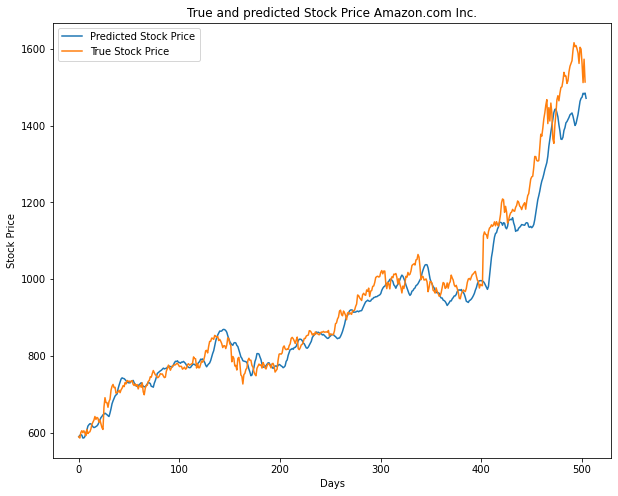

15/15 [==============================] - 0s 9ms/step


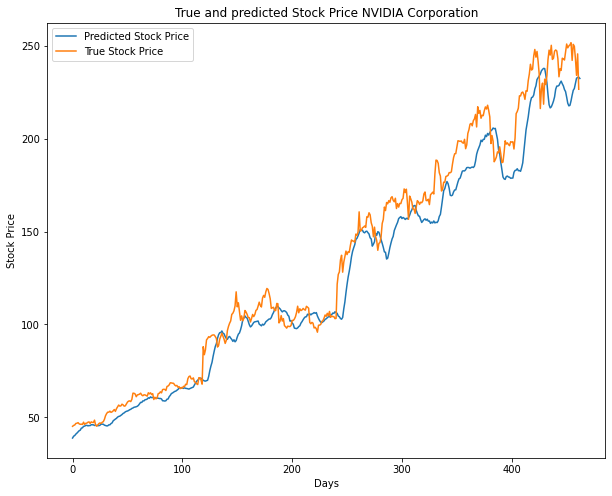

25/25 [==============================] - 0s 7ms/step


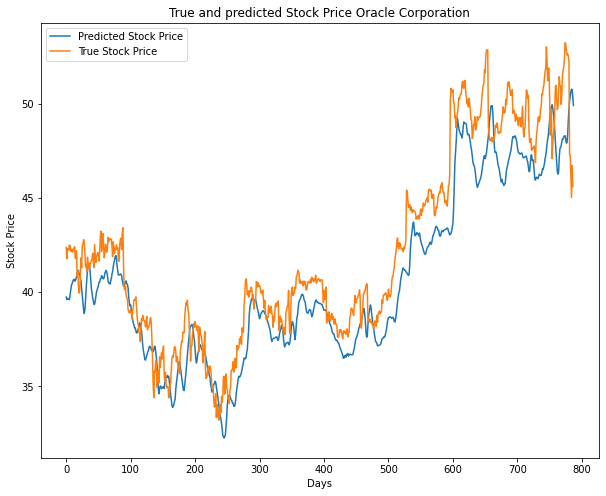

27/27 [==============================] - 0s 6ms/step


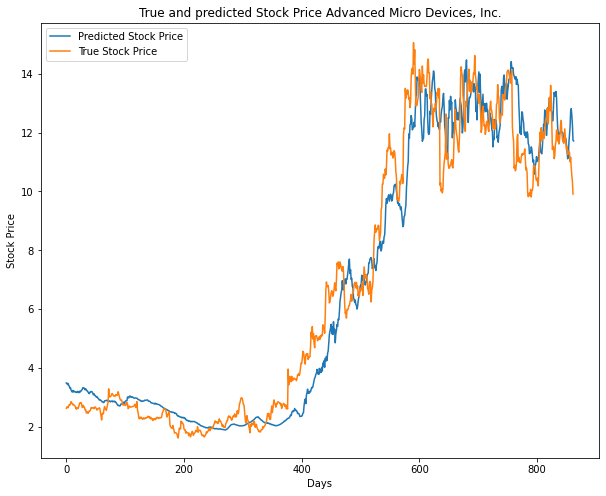

38/38 [==============================] - 0s 5ms/step


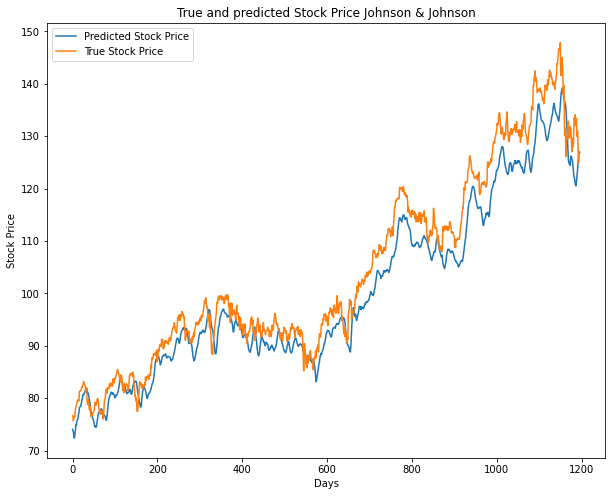

30/30 [==============================] - 0s 6ms/step


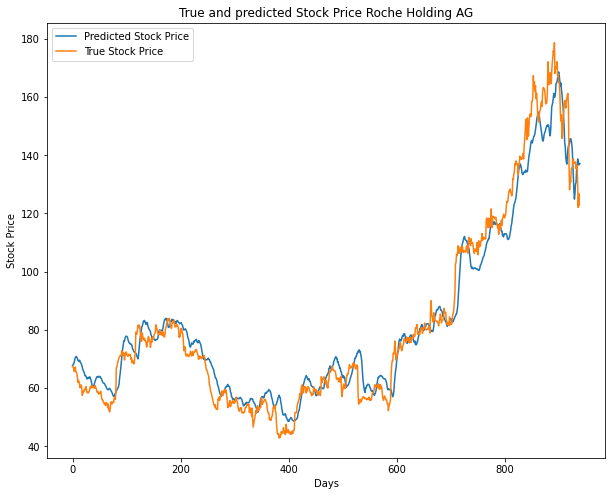

20/20 [==============================] - 0s 6ms/step


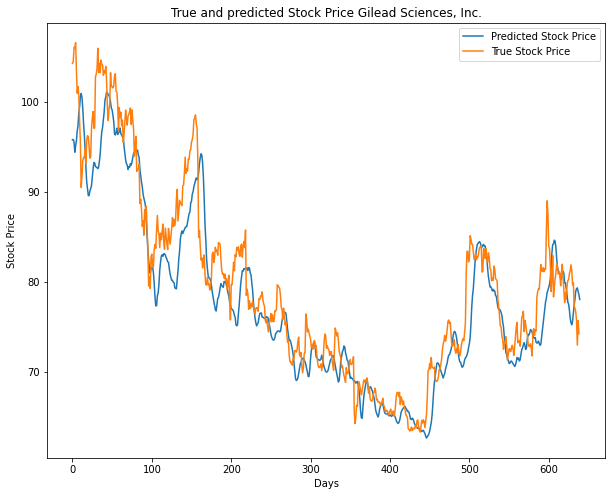

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_predict(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.title('True and predicted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_predict(best_model, name, 1)

In [32]:
from sklearn.metrics import mean_squared_error

best_model = load_model('best_model.h5')

def cacl_pred_mse(model, name):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    return mean_squared_error(test_y, pred_y)

def get_pred_mse():
    mse_list = []
    for name in dict_stock.keys():
        mse_list.append(cacl_pred_mse(best_model, name))
    return mse_list

In [33]:
pred_mse_list = get_pred_mse()
mse_df["MinMaxScaler Prediction (200 previous days)"] = pred_mse_list
mse_df

36/36 [==============================] - 0s 5ms/step


,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day),MinMaxScaler Prediction (200 previous days)
Apple Inc.,270.109784,3.120314,35.515093
Microsoft Corporation,54.455868,0.738092,7.651248
Alphabet Inc.,19924.141530,156.821904,2536.948921
Amazon.com Inc.,13391.496637,222.393537,2553.502891
Intel Corporation,16.855977,0.275912,3.049557
"Cisco Systems, Inc.",2.933339,0.163733,1.368182
NVIDIA Corporation,715.541567,15.329314,159.636914
Adobe Inc.,169.026435,4.022611,39.795231
IBM,505.118767,3.288771,69.711409
Oracle Corporation,36.149624,0.318036,4.291844


#### Try previous 100 days

In [34]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,3]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    scaler = MinMaxScaler()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, 100, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

train_data_X shape:  (178596, 100, 5) 
 train_data_y shape:  (178596, 1)


In [37]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(32, (8, 2), input_shape=(100, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 93, 4, 32)         544       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 46, 2, 32)         0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 41, 1, 64)         24640     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 20, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 17, 1, 16)         4112      
                                                                 
 conv2d_19 (Conv2D)          (None, 15, 1, 8)         

In [38]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

Epoch 1/35
256/258 [============================>.] - ETA: 0s - loss: 0.0023
Epoch 1: val_loss improved from inf to 0.00069, saving model to best_model.h5
258/258 [==============================] - 4s 10ms/step - loss: 0.0023 - val_loss: 6.9225e-04
Epoch 2/35
  1/258 [..............................] - ETA: 2s - loss: 6.6793e-04

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


253/258 [============================>.] - ETA: 0s - loss: 6.2515e-04
Epoch 2: val_loss improved from 0.00069 to 0.00054, saving model to best_model.h5
258/258 [==============================] - 3s 12ms/step - loss: 6.2692e-04 - val_loss: 5.4495e-04
Epoch 3/35
256/258 [============================>.] - ETA: 0s - loss: 4.6759e-04
Epoch 3: val_loss improved from 0.00054 to 0.00052, saving model to best_model.h5
258/258 [==============================] - 3s 10ms/step - loss: 4.6734e-04 - val_loss: 5.1979e-04
Epoch 4/35
258/258 [==============================] - ETA: 0s - loss: 4.0215e-04
Epoch 4: val_loss did not improve from 0.00052
258/258 [==============================] - 2s 10ms/step - loss: 4.0215e-04 - val_loss: 5.9455e-04
Epoch 5/35
252/258 [============================>.] - ETA: 0s - loss: 3.7956e-04
Epoch 5: val_loss did not improve from 0.00052
258/258 [==============================] - 2s 9ms/step - loss: 3.7729e-04 - val_loss: 9.7353e-04
Epoch 6/35
252/258 [==================

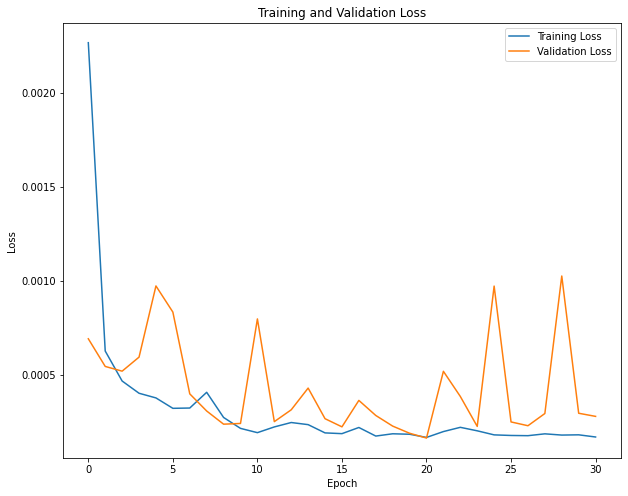

In [39]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

262/262 [==============================] - 1s 4ms/step


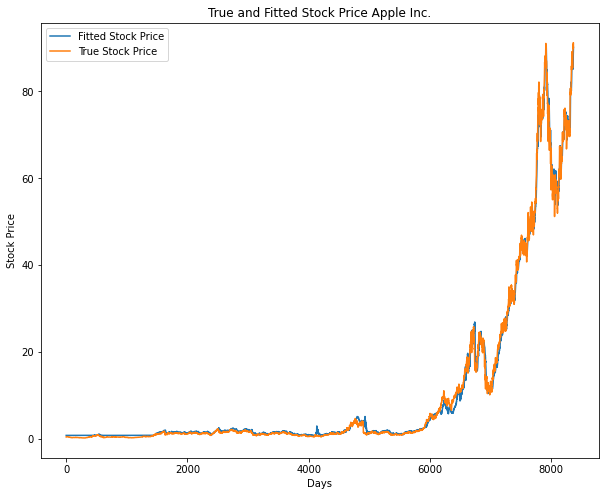

145/145 [==============================] - 1s 4ms/step


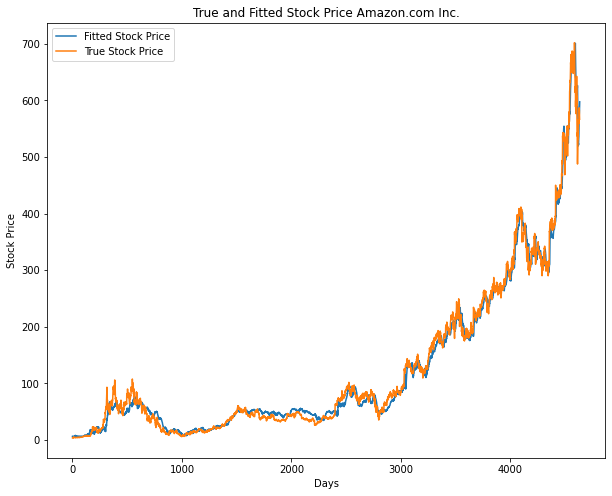

133/133 [==============================] - 1s 4ms/step


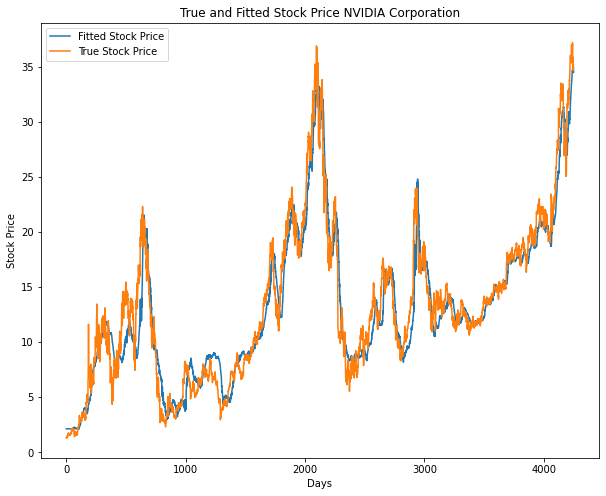

225/225 [==============================] - 1s 4ms/step


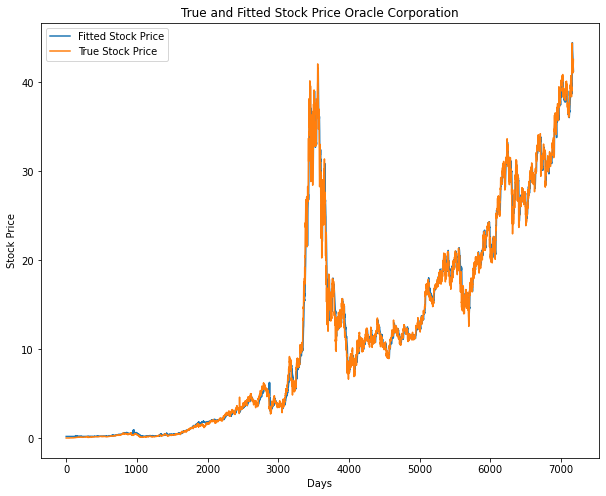

246/246 [==============================] - 1s 4ms/step


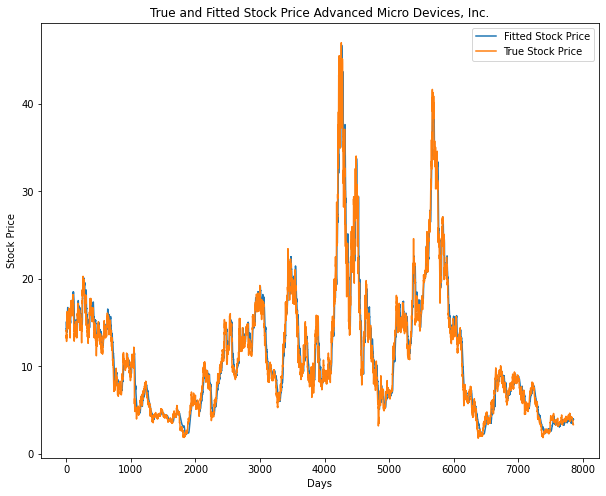

340/340 [==============================] - 1s 4ms/step


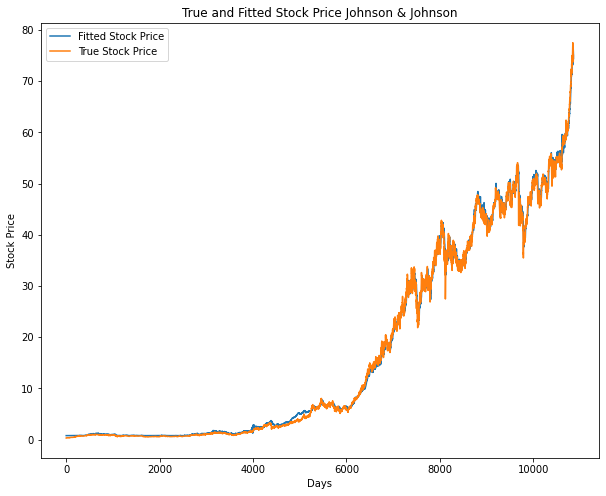

267/267 [==============================] - 1s 4ms/step


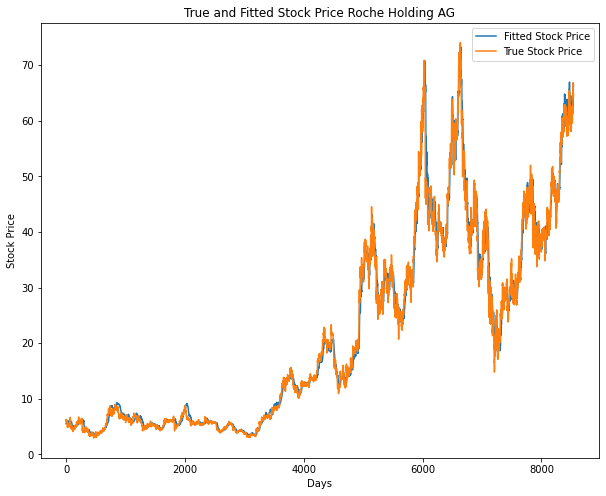

183/183 [==============================] - 1s 4ms/step


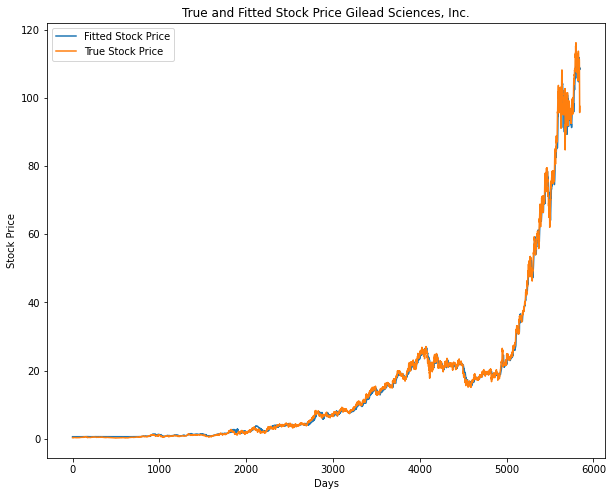

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_fit(best_model, name, 1)

30/30 [==============================] - 0s 6ms/step


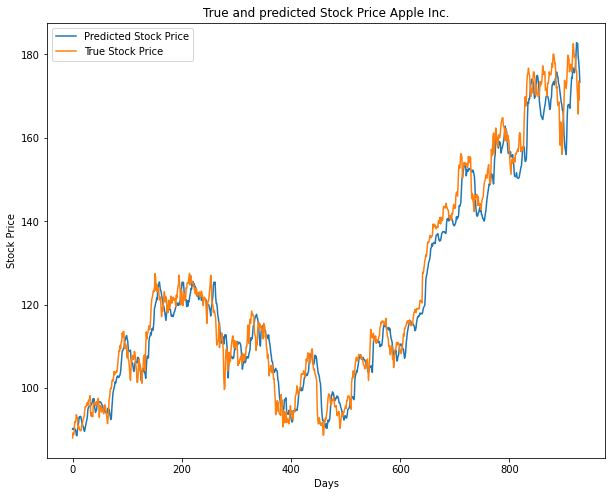

17/17 [==============================] - 0s 6ms/step


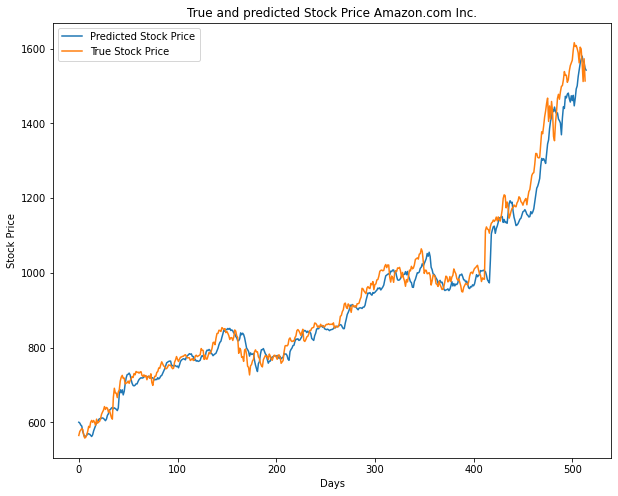

15/15 [==============================] - 0s 5ms/step


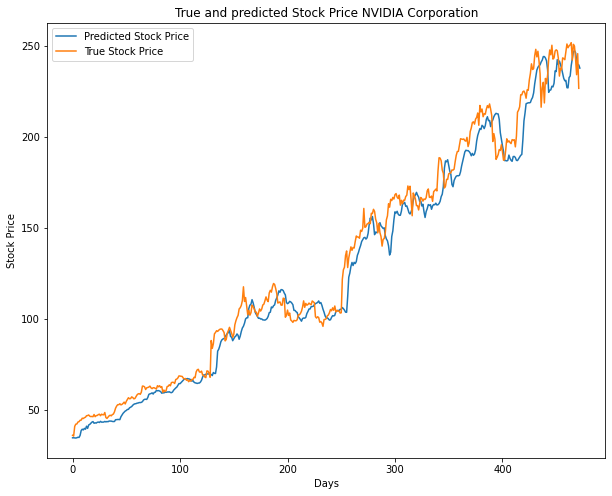

25/25 [==============================] - 0s 5ms/step


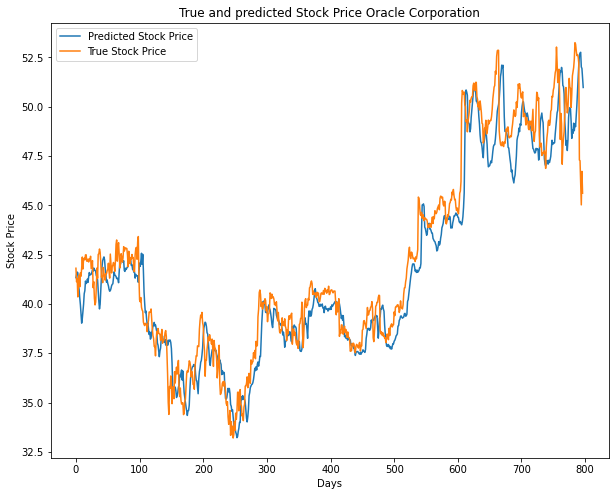

28/28 [==============================] - 0s 4ms/step


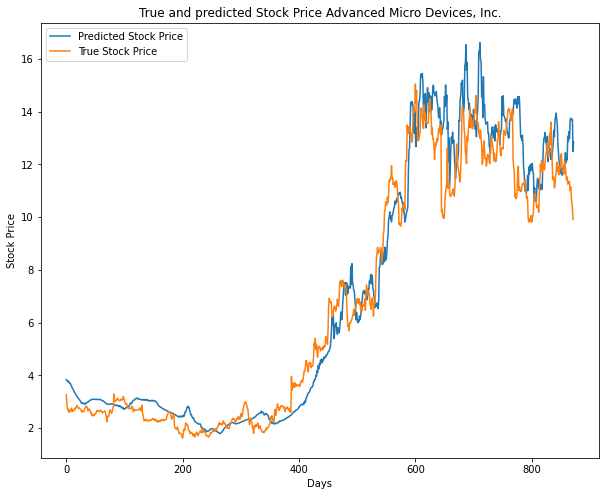

38/38 [==============================] - 0s 4ms/step


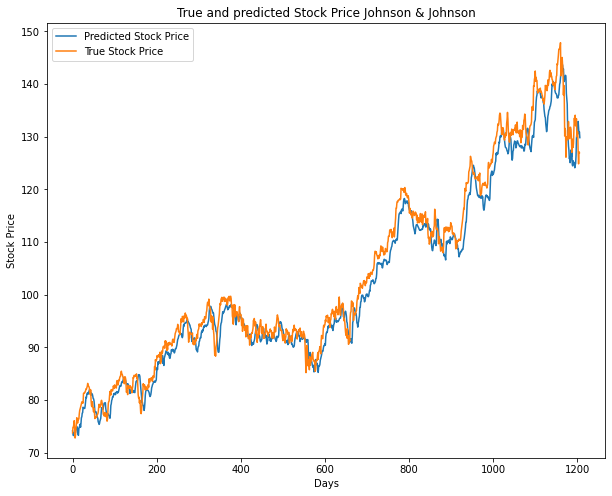

30/30 [==============================] - 0s 5ms/step


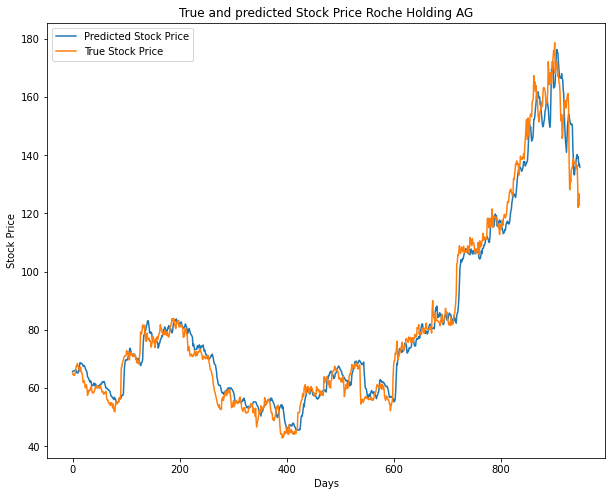

21/21 [==============================] - 0s 5ms/step


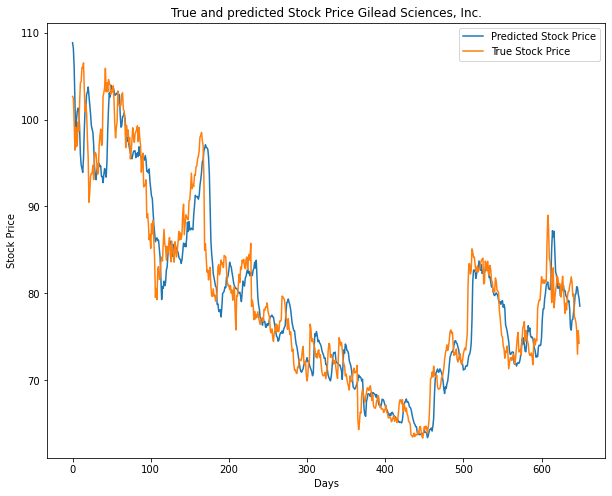

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_predict(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.title('True and predicted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_predict(best_model, name, 1)

In [42]:
from sklearn.metrics import mean_squared_error

best_model = load_model('best_model.h5')

def cacl_pred_mse(model, name):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    return mean_squared_error(test_y, pred_y)

def get_pred_mse():
    mse_list = []
    for name in dict_stock.keys():
        mse_list.append(cacl_pred_mse(best_model, name))
    return mse_list

pred_mse_list = get_pred_mse()
mse_df["MinMaxScaler Prediction (100 previous days)"] = pred_mse_list
mse_df

36/36 [==============================] - 0s 6ms/step


,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day),MinMaxScaler Prediction (200 previous days),MinMaxScaler Prediction (100 previous days)
Apple Inc.,270.109784,3.120314,35.515093,18.426735
Microsoft Corporation,54.455868,0.738092,7.651248,4.052051
Alphabet Inc.,19924.141530,156.821904,2536.948921,1310.657837
Amazon.com Inc.,13391.496637,222.393537,2553.502891,1342.470078
Intel Corporation,16.855977,0.275912,3.049557,1.691925
"Cisco Systems, Inc.",2.933339,0.163733,1.368182,0.971677
NVIDIA Corporation,715.541567,15.329314,159.636914,85.804693
Adobe Inc.,169.026435,4.022611,39.795231,18.968773
IBM,505.118767,3.288771,69.711409,25.970425
Oracle Corporation,36.149624,0.318036,4.291844,2.156697


#### Trye previous 50 days

train_data_X shape:  (179631, 50, 5) 
 train_data_y shape:  (179631, 1)
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 43, 4, 32)         544       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 21, 2, 32)         0         
 ng2D)                                                           
                                                                 
 conv2d_32 (Conv2D)          (None, 16, 1, 64)         24640     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 8, 1, 64)          0         
 ng2D)                                                           
                                                                 
 conv2d_33 (Conv2D)          (None, 5, 1, 16)          4112      
                                                

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


255/259 [============================>.] - ETA: 0s - loss: 4.6903e-04
Epoch 2: val_loss did not improve from 0.00048
259/259 [==============================] - 2s 8ms/step - loss: 4.6376e-04 - val_loss: 5.7932e-04
Epoch 3/35
252/259 [============================>.] - ETA: 0s - loss: 3.9574e-04
Epoch 3: val_loss improved from 0.00048 to 0.00034, saving model to best_model.h5
259/259 [==============================] - 2s 7ms/step - loss: 3.9869e-04 - val_loss: 3.3830e-04
Epoch 4/35
255/259 [============================>.] - ETA: 0s - loss: 3.5449e-04
Epoch 4: val_loss did not improve from 0.00034
259/259 [==============================] - 2s 8ms/step - loss: 3.5170e-04 - val_loss: 5.0644e-04
Epoch 5/35
251/259 [============================>.] - ETA: 0s - loss: 2.7665e-04
Epoch 5: val_loss did not improve from 0.00034
259/259 [==============================] - 2s 6ms/step - loss: 2.8139e-04 - val_loss: 7.1422e-04
Epoch 6/35
256/259 [============================>.] - ETA: 0s - loss: 2.6902

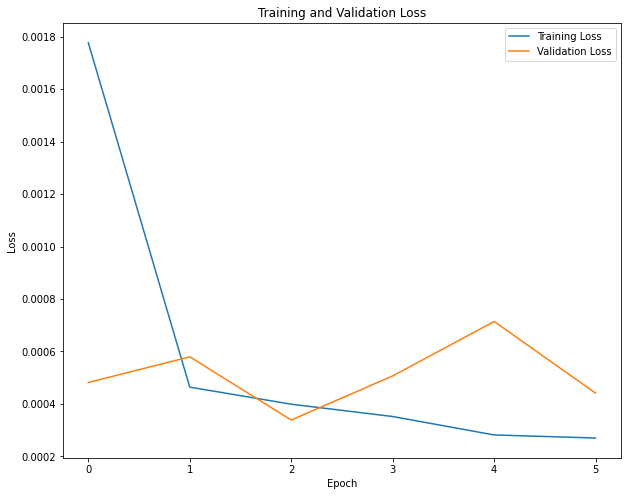

In [49]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,3]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    scaler = MinMaxScaler()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, 50, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(32, (8, 2), input_shape=(50, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

263/263 [==============================] - 1s 3ms/step


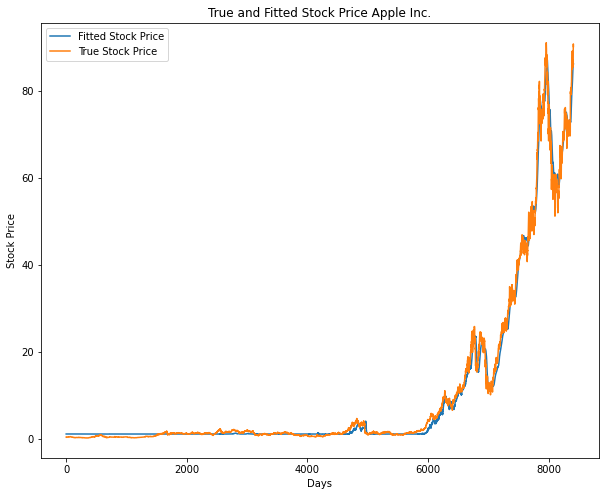

147/147 [==============================] - 1s 3ms/step


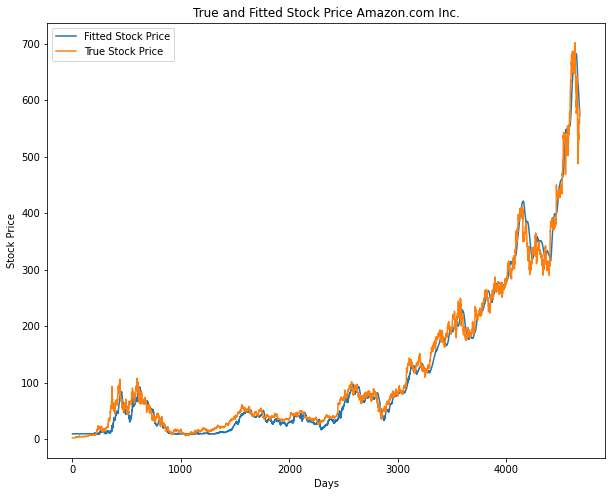

135/135 [==============================] - 0s 3ms/step


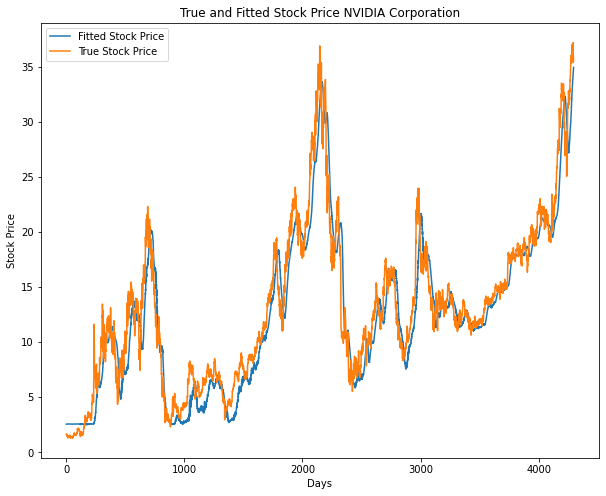

226/226 [==============================] - 1s 3ms/step


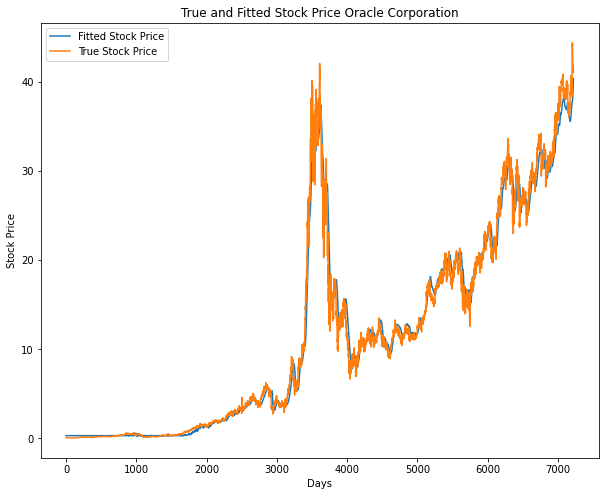

247/247 [==============================] - 1s 3ms/step


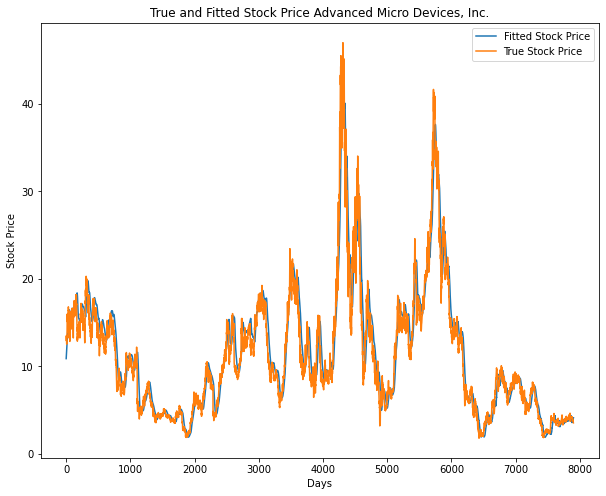

341/341 [==============================] - 1s 3ms/step


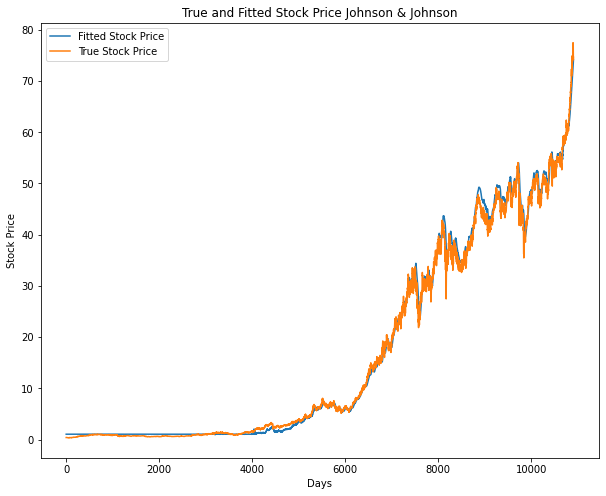

269/269 [==============================] - 1s 3ms/step


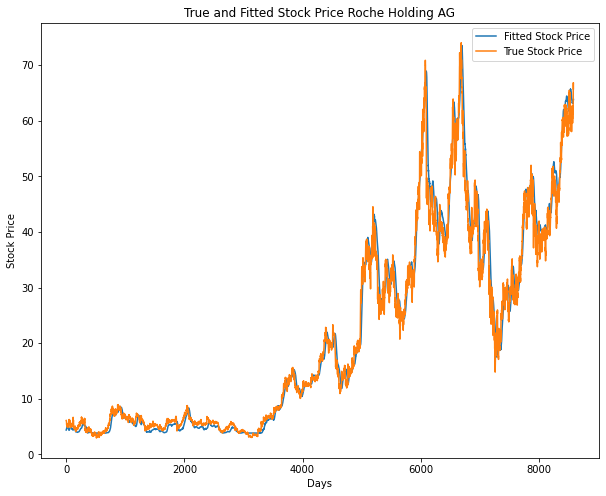

185/185 [==============================] - 1s 3ms/step


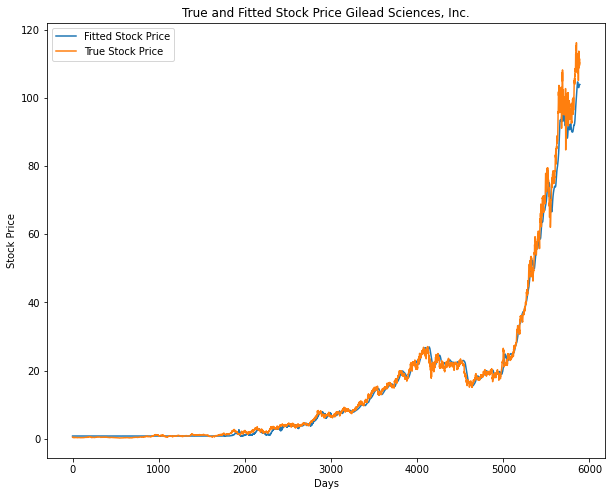

30/30 [==============================] - 0s 3ms/step


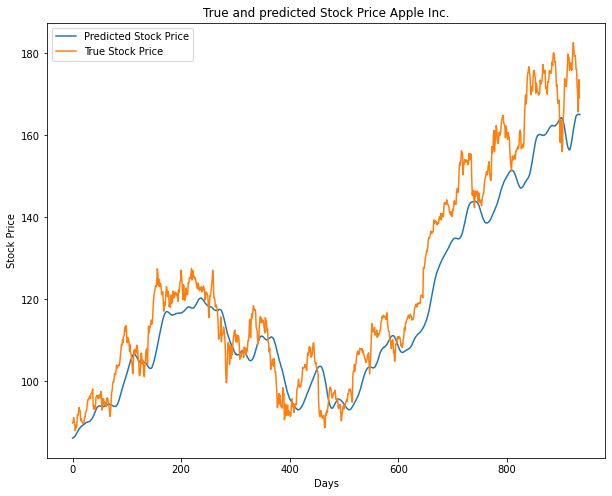

17/17 [==============================] - 0s 4ms/step


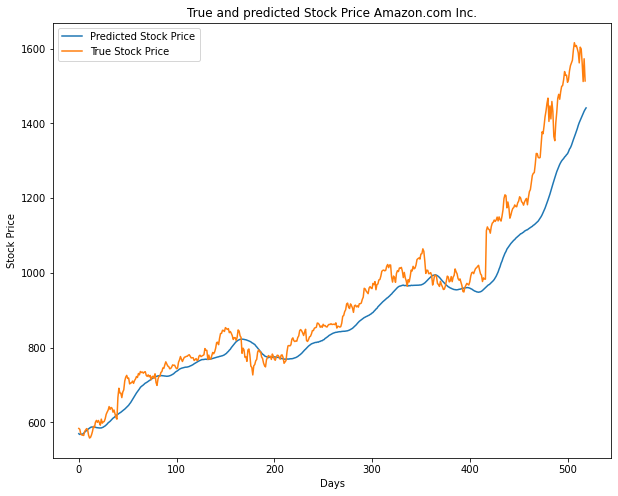

15/15 [==============================] - 0s 4ms/step


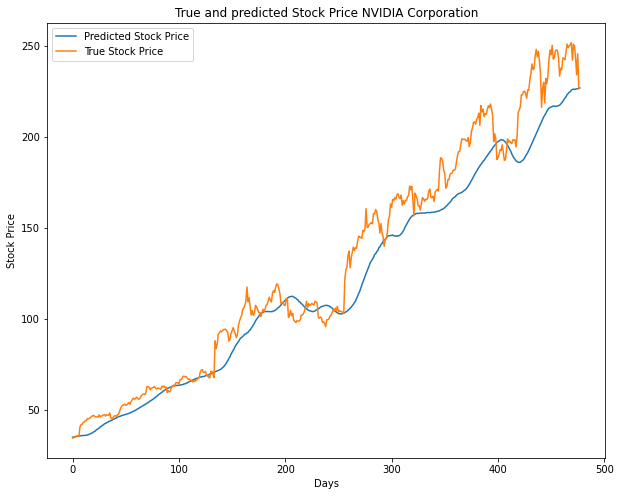

26/26 [==============================] - 0s 3ms/step


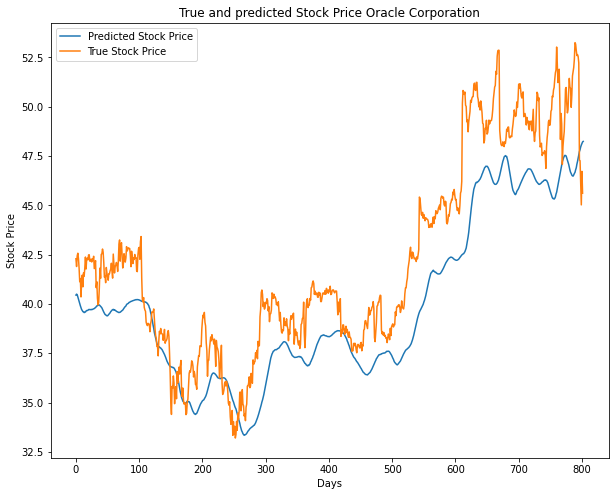

28/28 [==============================] - 0s 3ms/step


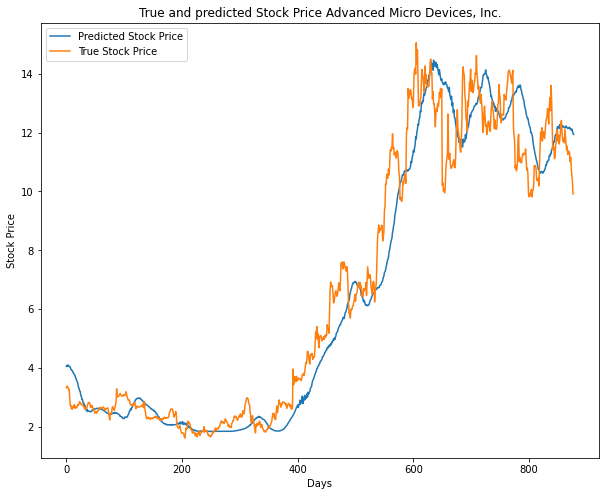

38/38 [==============================] - 0s 3ms/step


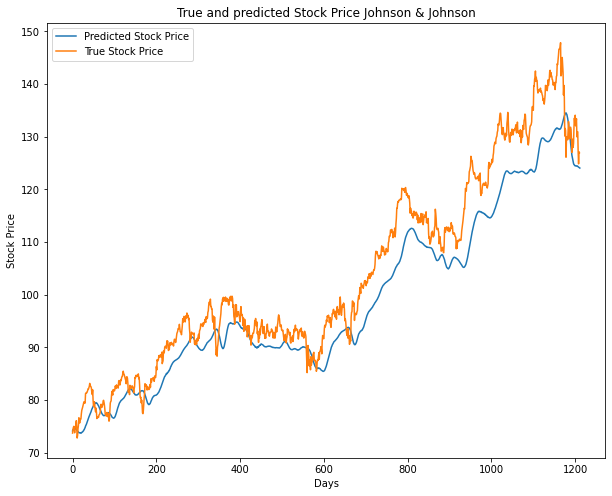

30/30 [==============================] - 0s 3ms/step


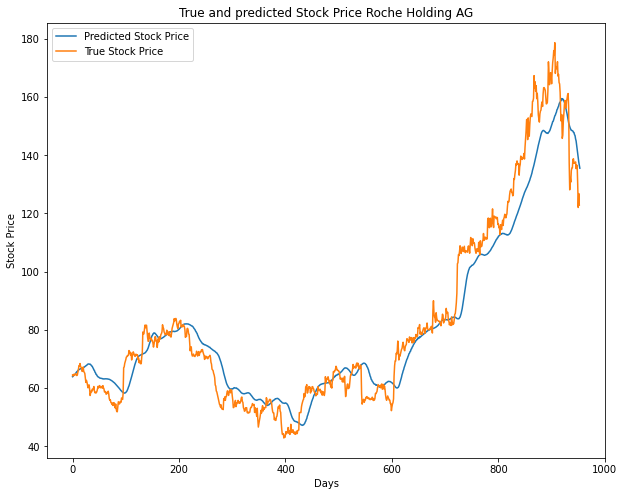

21/21 [==============================] - 0s 3ms/step


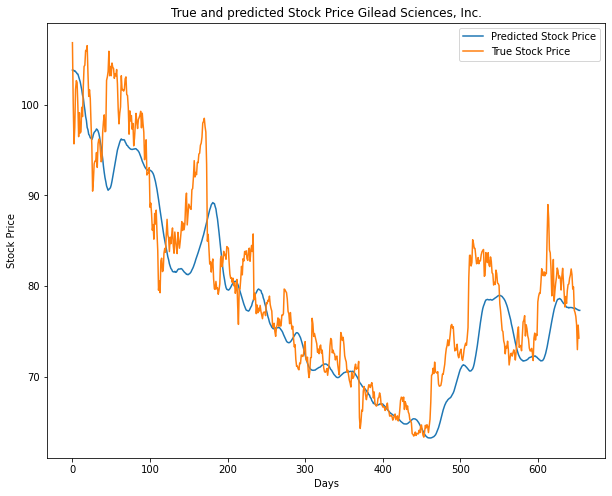

36/36 [==============================] - 0s 4ms/step


,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day),MinMaxScaler Prediction (200 previous days),MinMaxScaler Prediction (100 previous days),MinMaxScaler Prediction (50 previous days)
Apple Inc.,270.109784,3.120314,35.515093,18.426735,77.594101
Microsoft Corporation,54.455868,0.738092,7.651248,4.052051,16.542605
Alphabet Inc.,19924.141530,156.821904,2536.948921,1310.657837,4864.986719
Amazon.com Inc.,13391.496637,222.393537,2553.502891,1342.470078,6213.079913
Intel Corporation,16.855977,0.275912,3.049557,1.691925,5.795468
"Cisco Systems, Inc.",2.933339,0.163733,1.368182,0.971677,2.558565
NVIDIA Corporation,715.541567,15.329314,159.636914,85.804693,246.640694
Adobe Inc.,169.026435,4.022611,39.795231,18.968773,75.142064
IBM,505.118767,3.288771,69.711409,25.970425,101.033593
Oracle Corporation,36.149624,0.318036,4.291844,2.156697,7.909838


In [50]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_fit(best_model, name, 1)

def plot_stock_predict(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.title('True and predicted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_predict(best_model, name, 1)

pred_mse_list = get_pred_mse()
mse_df["MinMaxScaler Prediction (50 previous days)"] = pred_mse_list
mse_df

#### Try previous 20 days

train_data_X shape:  (180252, 20, 5) 
 train_data_y shape:  (180252, 1)
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 13, 4, 32)         544       
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 6, 2, 32)          0         
 ng2D)                                                           
                                                                 
 conv2d_36 (Conv2D)          (None, 1, 1, 64)          24640     
                                                                 
 flatten_8 (Flatten)         (None, 64)                0         
                                                                 
 dense_16 (Dense)            (None, 128)               8320      
                                                                 
 dense_17 (Dense)            (None, 1)         

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


246/260 [===========================>..] - ETA: 0s - loss: 2.1696e-04
Epoch 2: val_loss improved from 0.00061 to 0.00060, saving model to best_model.h5
260/260 [==============================] - 1s 5ms/step - loss: 2.1621e-04 - val_loss: 5.9504e-04
Epoch 3/35
255/260 [============================>.] - ETA: 0s - loss: 2.2202e-04
Epoch 3: val_loss improved from 0.00060 to 0.00014, saving model to best_model.h5
260/260 [==============================] - 1s 4ms/step - loss: 2.2074e-04 - val_loss: 1.4330e-04
Epoch 4/35
251/260 [===========================>..] - ETA: 0s - loss: 1.7729e-04
Epoch 4: val_loss did not improve from 0.00014
260/260 [==============================] - 1s 5ms/step - loss: 1.7827e-04 - val_loss: 6.2919e-04
Epoch 5/35
260/260 [==============================] - ETA: 0s - loss: 1.6860e-04
Epoch 5: val_loss did not improve from 0.00014
260/260 [==============================] - 1s 5ms/step - loss: 1.6860e-04 - val_loss: 2.1080e-04
Epoch 6/35
259/260 [=====================

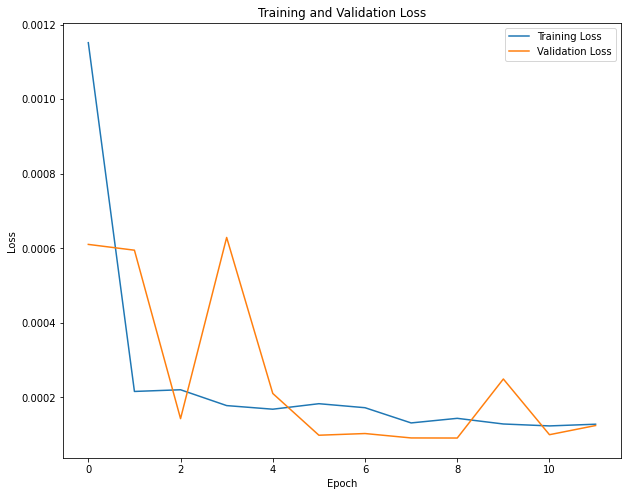

264/264 [==============================] - 1s 3ms/step


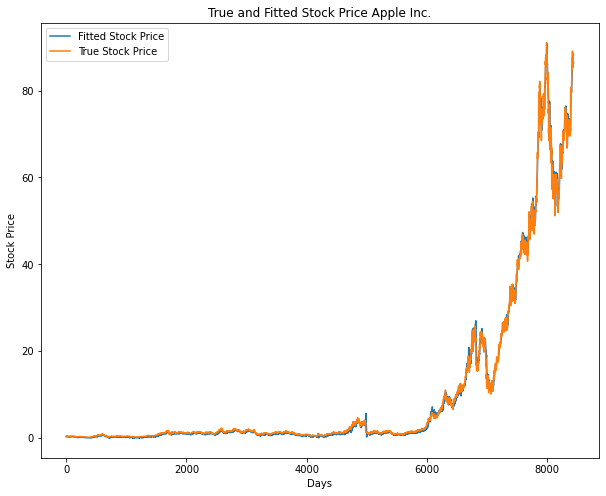

148/148 [==============================] - 0s 2ms/step


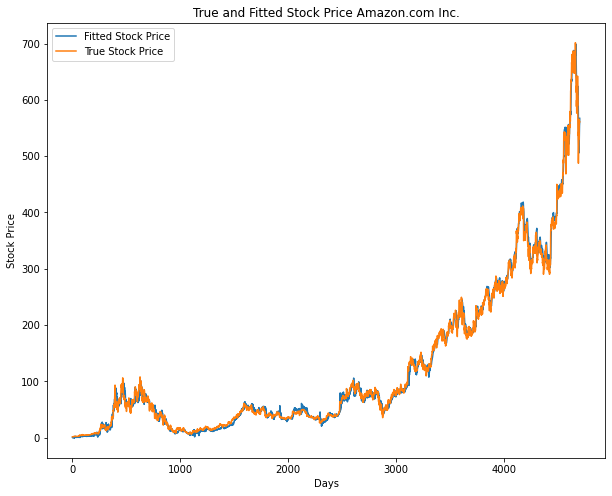

136/136 [==============================] - 0s 2ms/step


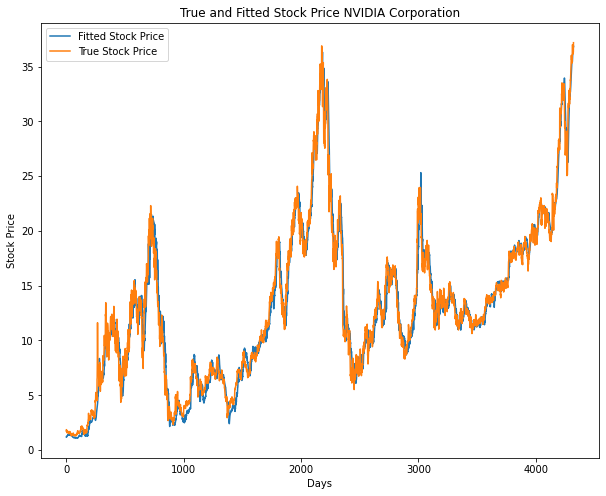

227/227 [==============================] - 0s 2ms/step


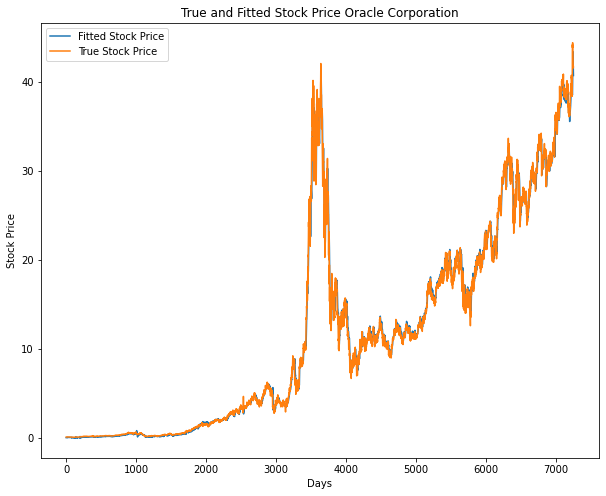

248/248 [==============================] - 1s 2ms/step


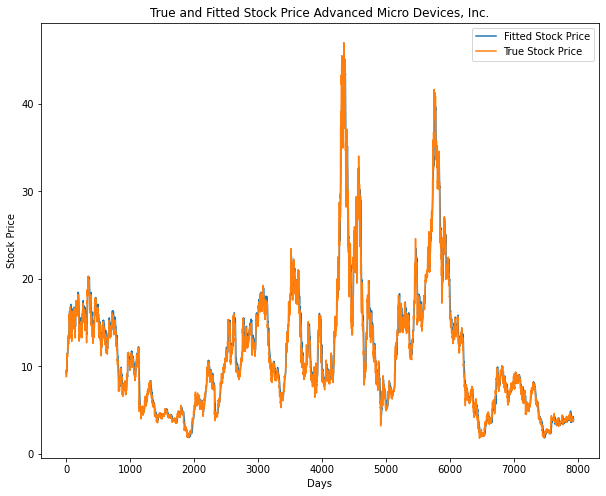

342/342 [==============================] - 1s 2ms/step


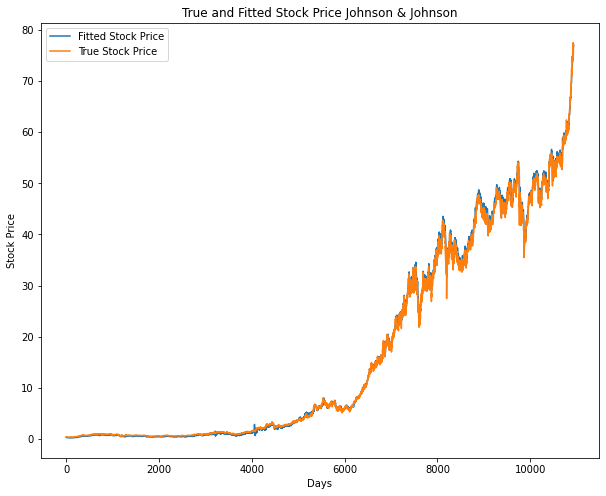

270/270 [==============================] - 1s 2ms/step


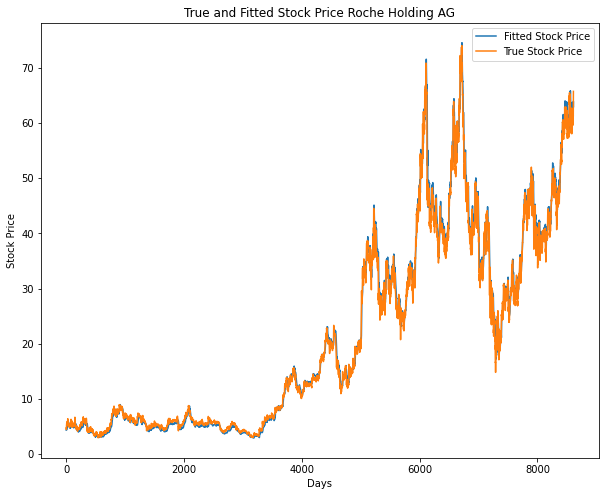

185/185 [==============================] - 0s 2ms/step


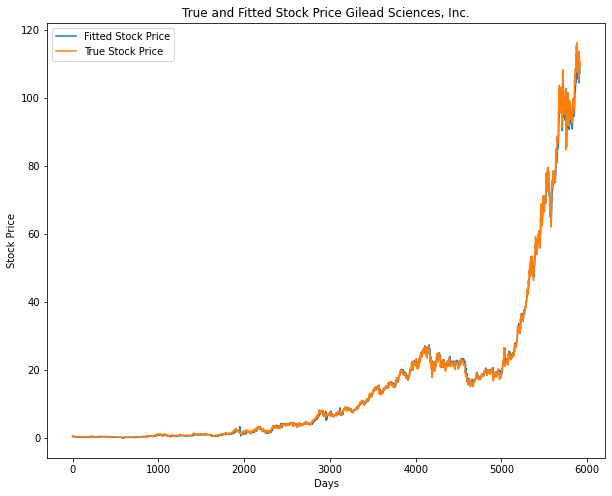

30/30 [==============================] - 0s 2ms/step


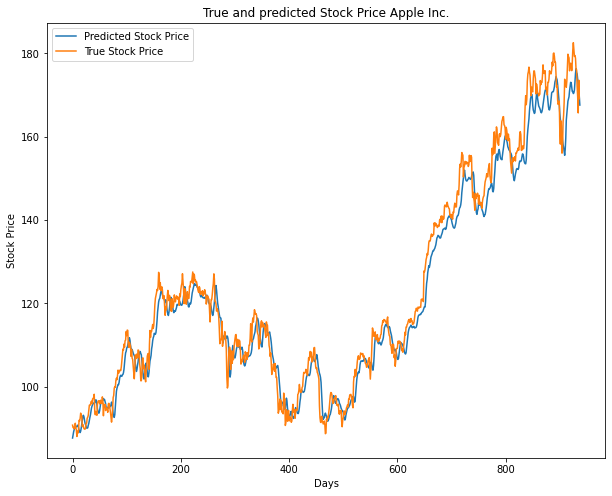

17/17 [==============================] - 0s 2ms/step


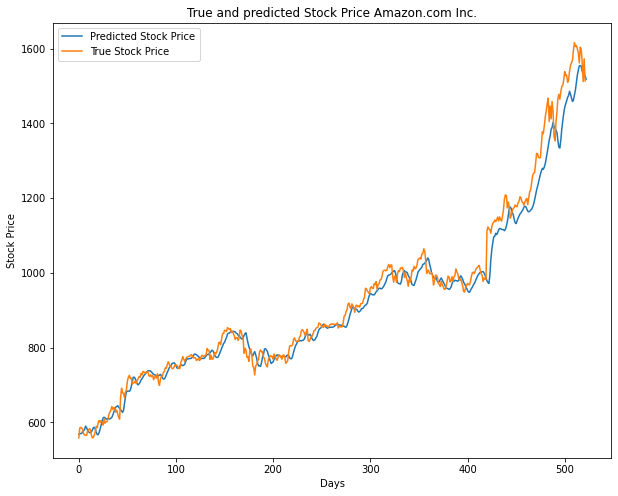

16/16 [==============================] - 0s 2ms/step


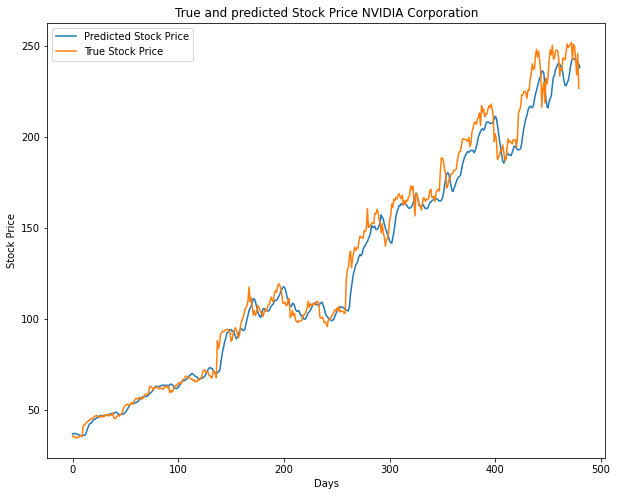

26/26 [==============================] - 0s 3ms/step


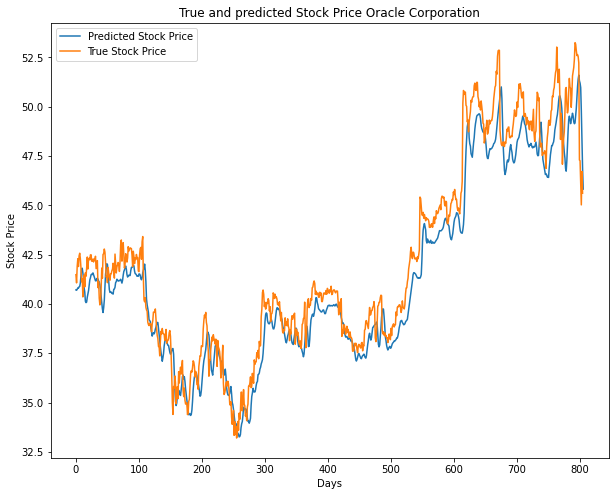

28/28 [==============================] - 0s 3ms/step


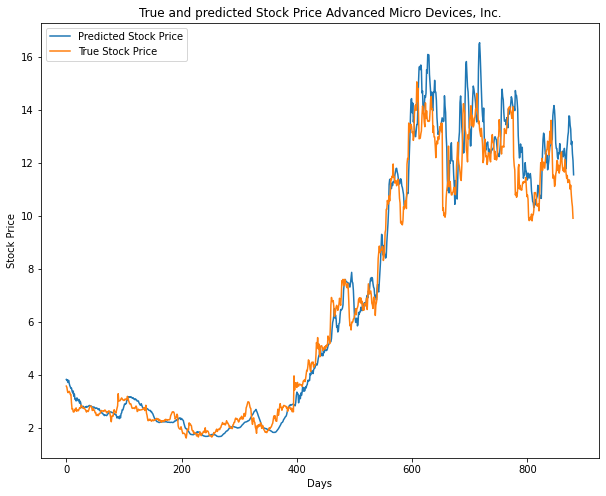

38/38 [==============================] - 0s 3ms/step


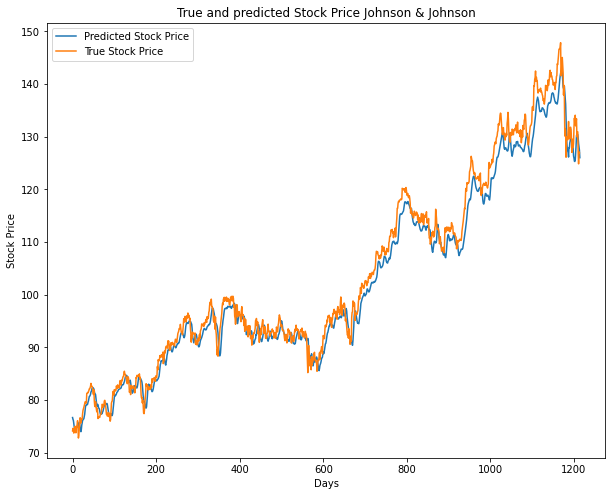

30/30 [==============================] - 0s 3ms/step


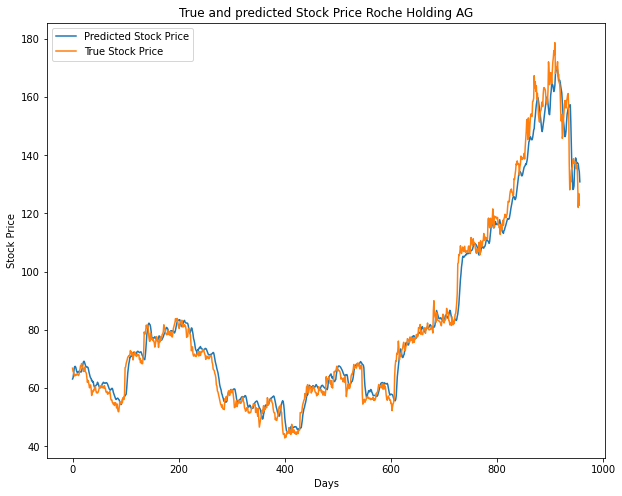

21/21 [==============================] - 0s 3ms/step


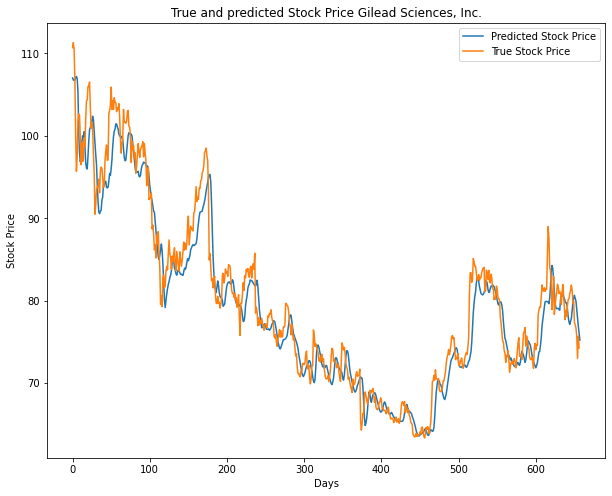

37/37 [==============================] - 0s 2ms/step


,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day),MinMaxScaler Prediction (200 previous days),MinMaxScaler Prediction (100 previous days),MinMaxScaler Prediction (50 previous days),MinMaxScaler Prediction (20 previous days)
Apple Inc.,270.109784,3.120314,35.515093,18.426735,77.594101,15.189550
Microsoft Corporation,54.455868,0.738092,7.651248,4.052051,16.542605,3.135019
Alphabet Inc.,19924.141530,156.821904,2536.948921,1310.657837,4864.986719,1024.629327
Amazon.com Inc.,13391.496637,222.393537,2553.502891,1342.470078,6213.079913,1154.141854
Intel Corporation,16.855977,0.275912,3.049557,1.691925,5.795468,1.179489
"Cisco Systems, Inc.",2.933339,0.163733,1.368182,0.971677,2.558565,0.586067
NVIDIA Corporation,715.541567,15.329314,159.636914,85.804693,246.640694,55.181193
Adobe Inc.,169.026435,4.022611,39.795231,18.968773,75.142064,15.438570
IBM,505.118767,3.288771,69.711409,25.970425,101.033593,19.960386
Oracle Corporation,36.149624,0.318036,4.291844,2.156697,7.909838,1.743176


In [51]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,3]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    scaler = MinMaxScaler()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, 20, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(32, (8, 2), input_shape=(20, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))   (The data is too short here, we can not do more maxpooling)
# model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
# model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_fit(best_model, name, 1)

def plot_stock_predict(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((test_y_dict[name], np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((model.predict(test_X), np.random.rand(test_y_dict[name].shape[0], 4)), axis=1))[:,0]
    plt.figure(figsize=(10, 8))
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.title('True and predicted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_predict(best_model, name, 1)

pred_mse_list = get_pred_mse()
mse_df["MinMaxScaler Prediction (20 previous days)"] = pred_mse_list
mse_df

train_data_X shape:  (180459, 10, 5) 
 train_data_y shape:  (180459, 1)
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_45 (Conv2D)          (None, 8, 4, 32)          224       
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 4, 2, 32)          0         
 ng2D)                                                           
                                                                 
 flatten_11 (Flatten)        (None, 256)               0         
                                                                 
 dense_22 (Dense)            (None, 128)               32896     
                                                                 
 dense_23 (Dense)            (None, 1)                 129       
                                                                 
Total params: 33249 (129.88 KB)
Trainable param

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


250/260 [===========================>..] - ETA: 0s - loss: 1.1259e-04
Epoch 2: val_loss did not improve from 0.00011
260/260 [==============================] - 1s 3ms/step - loss: 1.1458e-04 - val_loss: 1.2687e-04
Epoch 3/35
247/260 [===========================>..] - ETA: 0s - loss: 1.0011e-04
Epoch 3: val_loss improved from 0.00011 to 0.00009, saving model to best_model.h5
260/260 [==============================] - 1s 4ms/step - loss: 9.9401e-05 - val_loss: 9.2595e-05
Epoch 4/35
247/260 [===========================>..] - ETA: 0s - loss: 8.5902e-05
Epoch 4: val_loss improved from 0.00009 to 0.00007, saving model to best_model.h5
260/260 [==============================] - 1s 4ms/step - loss: 8.4106e-05 - val_loss: 7.2724e-05
Epoch 5/35
260/260 [==============================] - ETA: 0s - loss: 8.0005e-05
Epoch 5: val_loss did not improve from 0.00007
260/260 [==============================] - 1s 4ms/step - loss: 8.0005e-05 - val_loss: 1.3971e-04
Epoch 6/35
246/260 [=====================

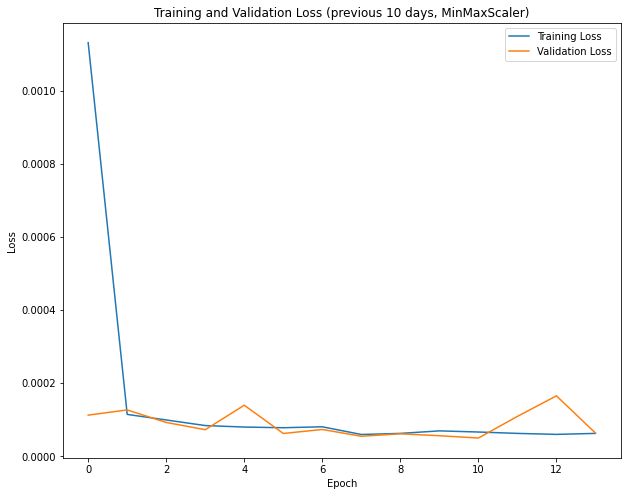

265/265 [==============================] - 1s 2ms/step


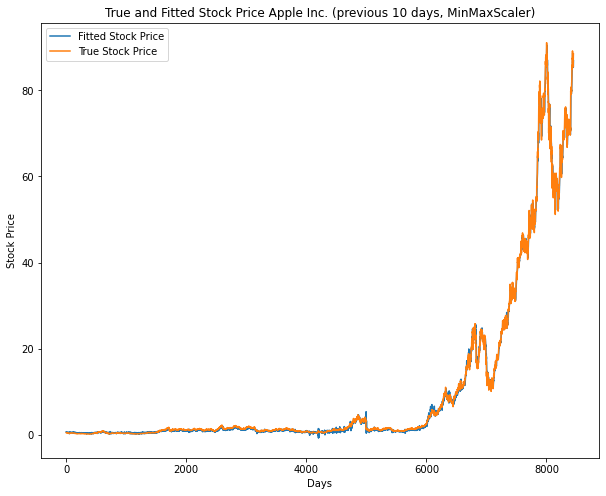

148/148 [==============================] - 0s 2ms/step


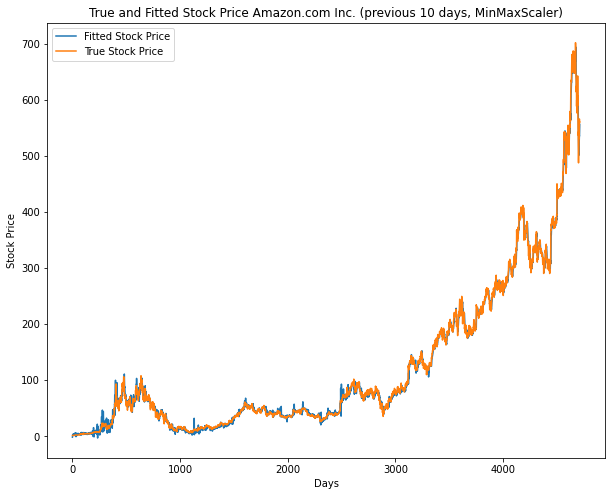

136/136 [==============================] - 0s 2ms/step


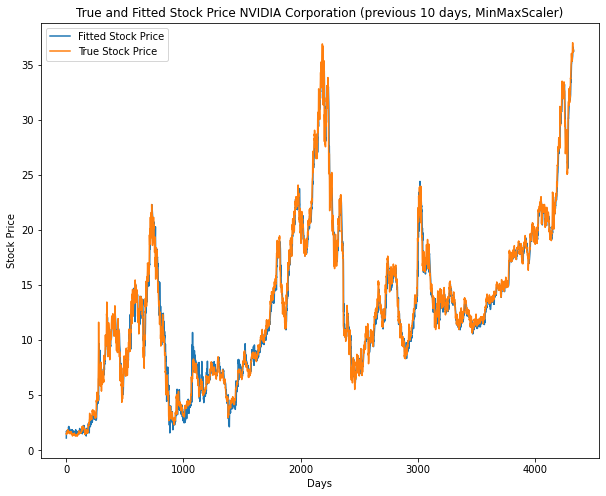

227/227 [==============================] - 0s 2ms/step


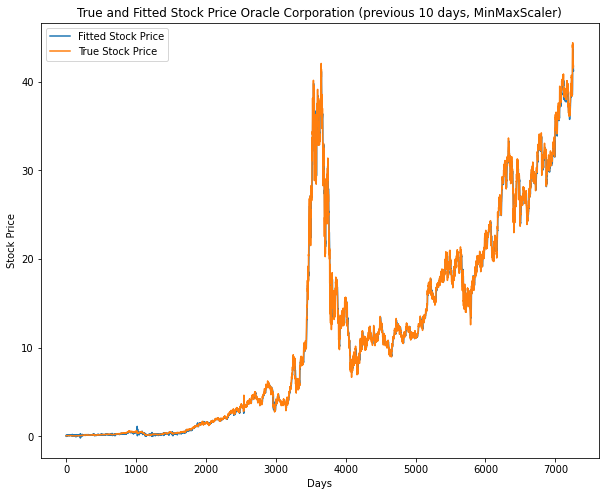

249/249 [==============================] - 1s 2ms/step


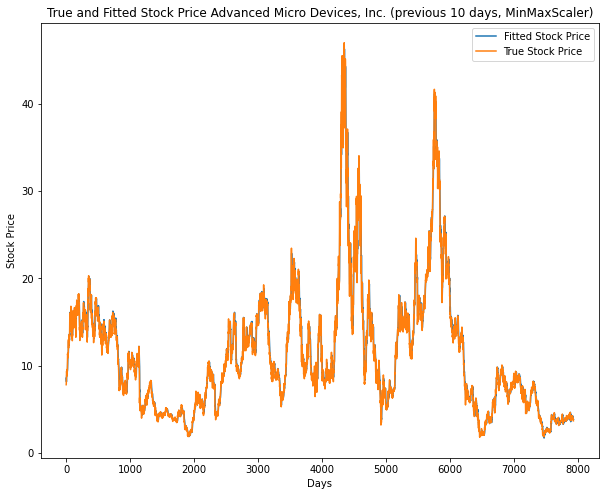

342/342 [==============================] - 1s 2ms/step


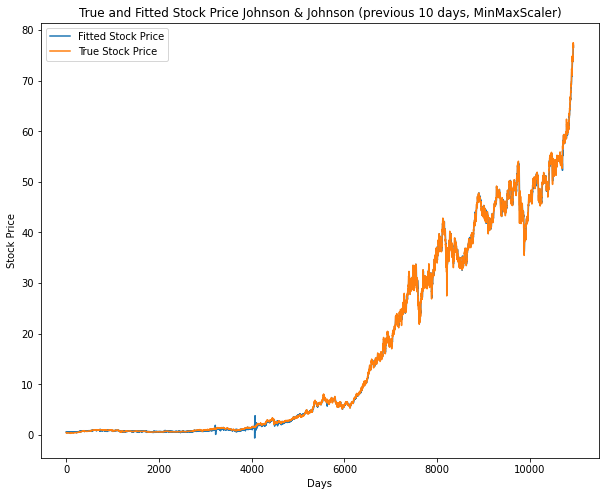

270/270 [==============================] - 1s 2ms/step


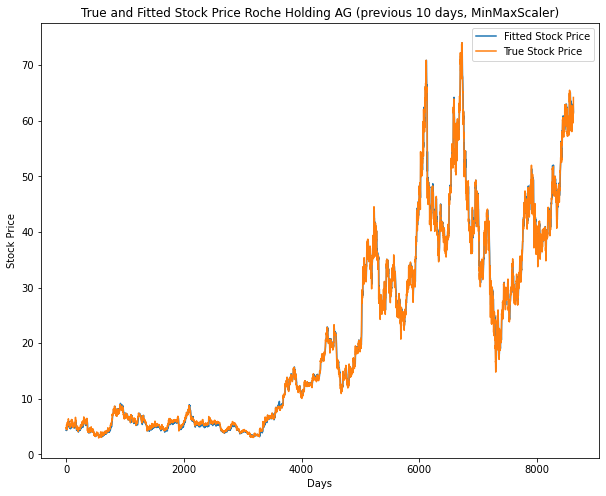

186/186 [==============================] - 0s 2ms/step


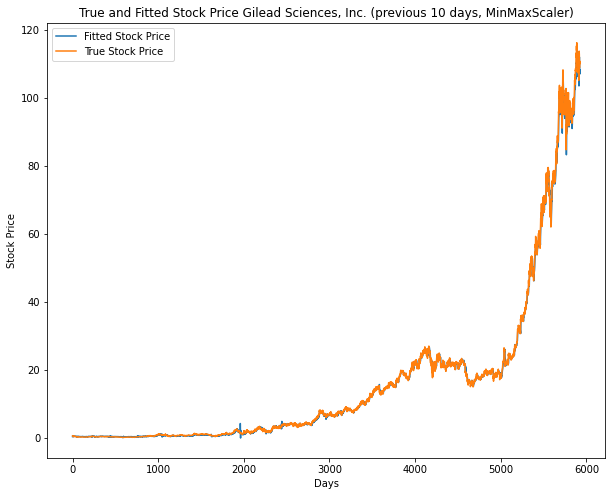

30/30 [==============================] - 0s 2ms/step


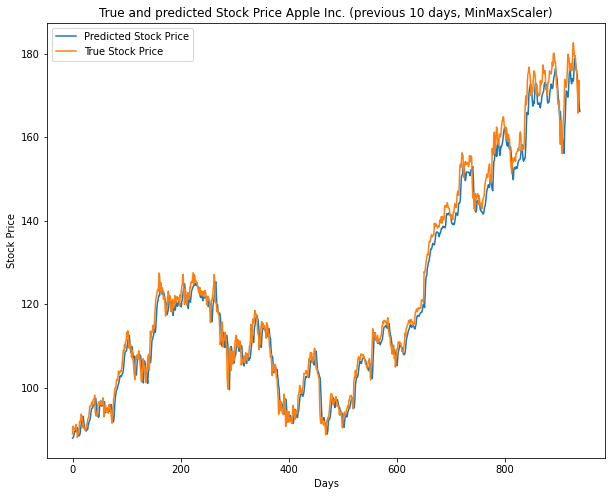

17/17 [==============================] - 0s 3ms/step


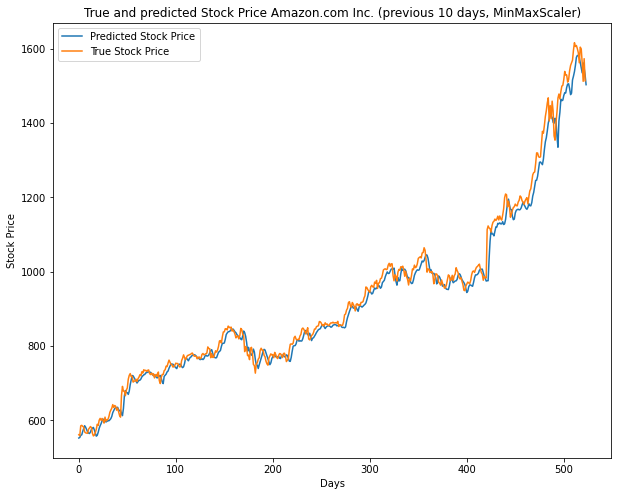

16/16 [==============================] - 0s 2ms/step


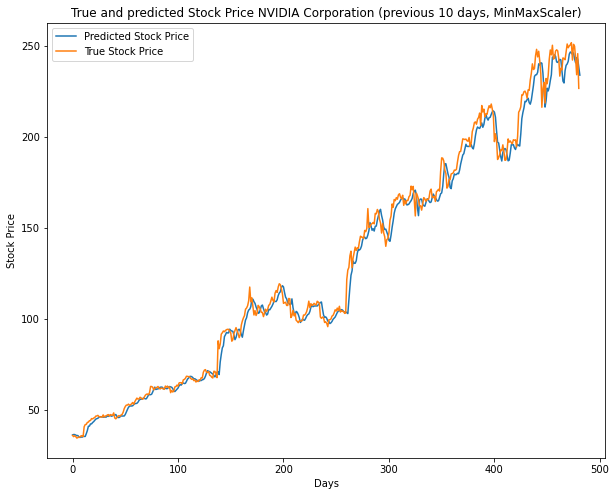

26/26 [==============================] - 0s 2ms/step


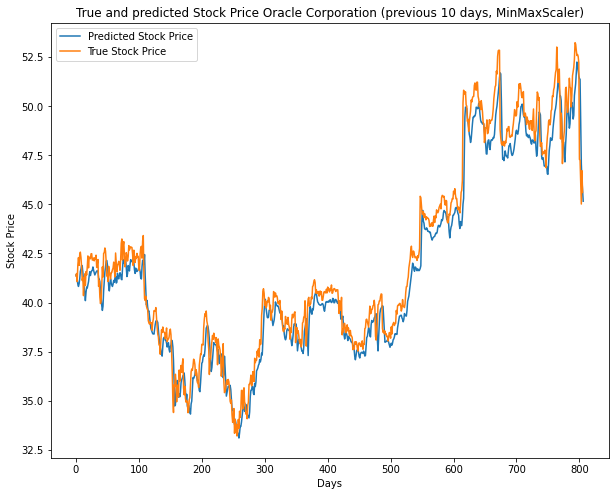

28/28 [==============================] - 0s 3ms/step


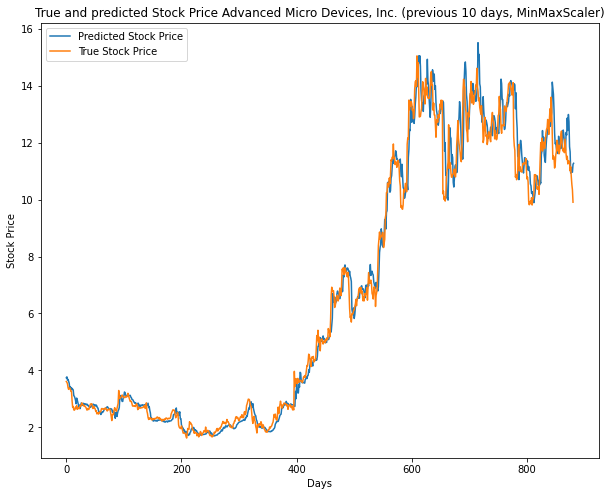

38/38 [==============================] - 0s 3ms/step


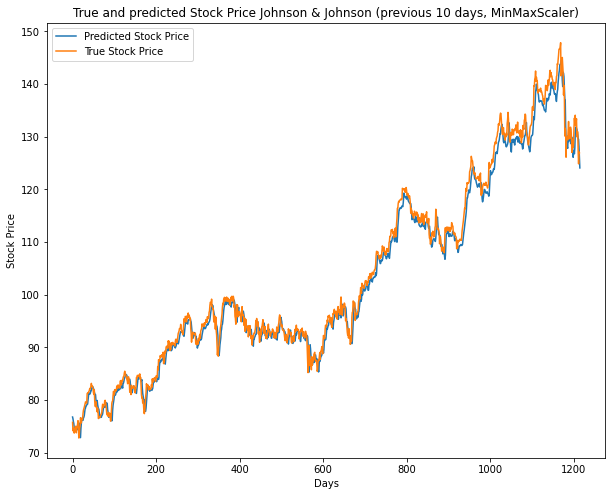

30/30 [==============================] - 0s 2ms/step


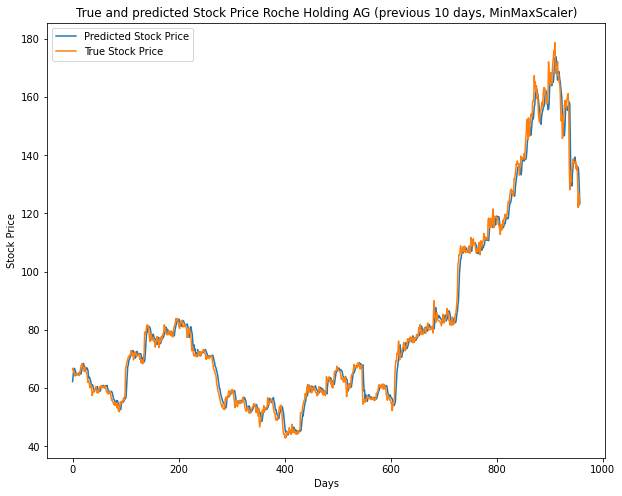

21/21 [==============================] - 0s 3ms/step


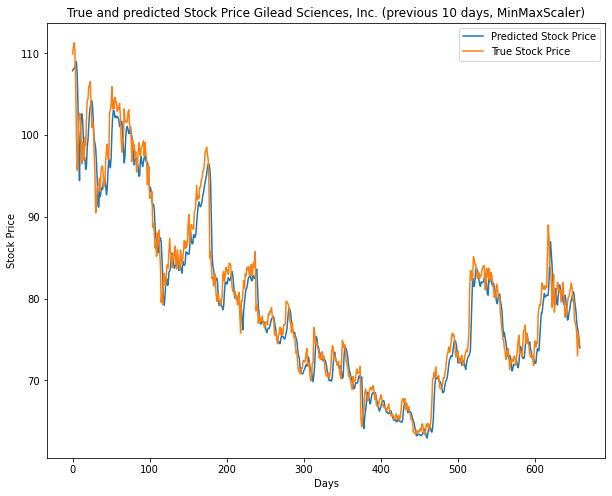

37/37 [==============================] - 0s 2ms/step


,MinMaxScaler Prediction (400 previous days),Baseline (Use Last Day),MinMaxScaler Prediction (200 previous days),MinMaxScaler Prediction (100 previous days),MinMaxScaler Prediction (50 previous days),MinMaxScaler Prediction (20 previous days),MinMaxScaler Prediction (10 previous days)
Apple Inc.,270.109784,3.120314,35.515093,18.426735,77.594101,15.189550,15.189550
Microsoft Corporation,54.455868,0.738092,7.651248,4.052051,16.542605,3.135019,3.135019
Alphabet Inc.,19924.141530,156.821904,2536.948921,1310.657837,4864.986719,1024.629327,1024.629327
Amazon.com Inc.,13391.496637,222.393537,2553.502891,1342.470078,6213.079913,1154.141854,1154.141854
Intel Corporation,16.855977,0.275912,3.049557,1.691925,5.795468,1.179489,1.179489
"Cisco Systems, Inc.",2.933339,0.163733,1.368182,0.971677,2.558565,0.586067,0.586067
NVIDIA Corporation,715.541567,15.329314,159.636914,85.804693,246.640694,55.181193,55.181193
Adobe Inc.,169.026435,4.022611,39.795231,18.968773,75.142064,15.438570,15.438570
IBM,505.118767,3.288771,69.711409,25.970425,101.033593,19.960386,19.960386
Oracle Corporation,36.149624,0.318036,4.291844,2.156697,7.909838,1.743176,1.743176


In [60]:
mse_df = TimeSeriesCNN_stock_price(10, "MinMax")
mse_df

#### We can see that what we have none here is basically meaningless. When the input number of days decreases, the mse generally get smaller. And all of our trials do not exceed the baseline, which is simply taking the previous one day's closing price as today's closing price. This can be thought of as a extreme case where input number of days is 1. As we can only use the information from the previous one day. And when the input number of days decreases, the value of the MSE reaches that baseline minimum. We can see that all the information before is generally useless, as the CNN does not utilize these infromation from further past. The ultimate prediction we have shows a clear lagging. It is simply the shift of the closing prices by a few days. This is not practical and helpful when really inplementing this algorithm to do trading. 

#### The takeaway here is we should use other variables for prediction when we really want to predict the ups and downs of stock price. Simply using the prcie itself is meaningless, as the model will simply takes the previous 1 day's value as the predction for today's. We should consider using change rate, change, or binary classfication  （increase or decrease）to do trading.

#### Here we could do other things to see what changes, for example using StandardScaler, or change the sector of stocks.

#### Also, we can see that MSE is heavily influenced by the shear value of the stock price. For example, Amazon and Alphabet have a very big MSE.

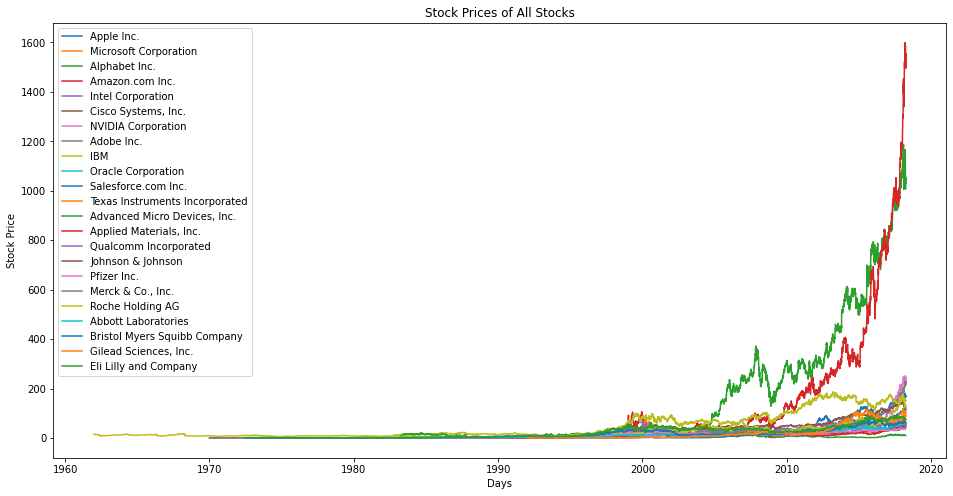

In [62]:
plt.figure(figsize=(16, 8))

for name in data_dfs:
    plt.plot(data_dfs[name].iloc[:,3],label=name)

plt.title('Stock Prices of All Stocks')
plt.xlabel('Days')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

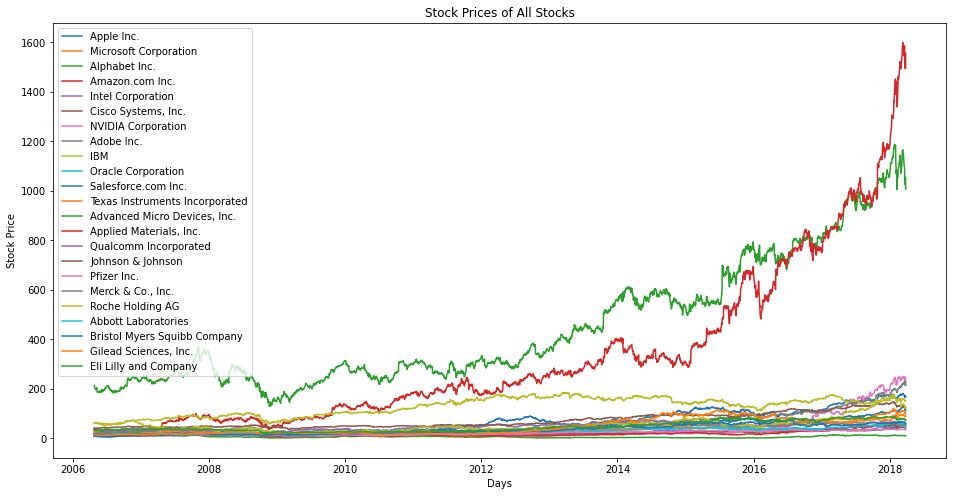

In [63]:
plt.figure(figsize=(16, 8))

for name in data_dfs:
    plt.plot(data_dfs[name].iloc[-3000:,3],label=name)

plt.title('Stock Prices of All Stocks')
plt.xlabel('Days')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

#### Here we can see that Amazon and Alphabet indeed have the highest prices

## Second Task: Predicting change using CNN

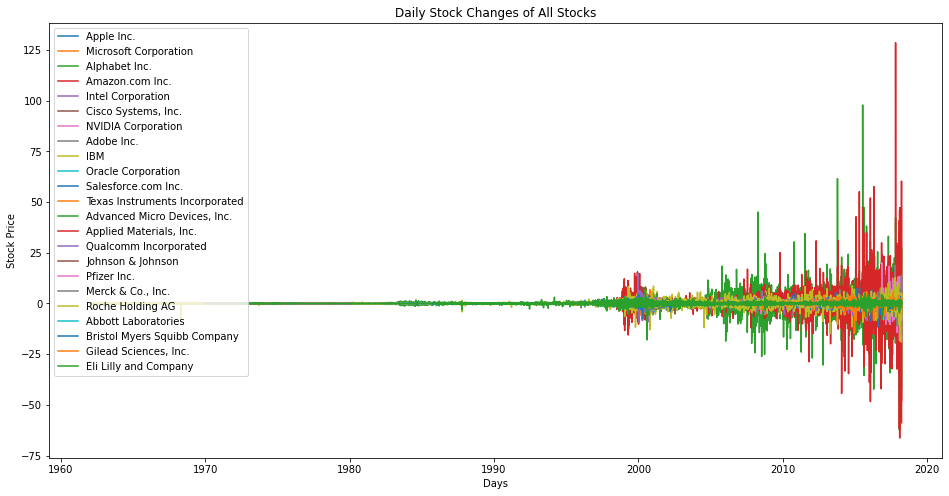

In [64]:
plt.figure(figsize=(16, 8))

for name in data_dfs:
    plt.plot(data_dfs[name].iloc[:,3].diff(),label=name)

plt.title('Daily Stock Changes of All Stocks')
plt.xlabel('Days')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

## Third Task: Predicting change rate using CNN

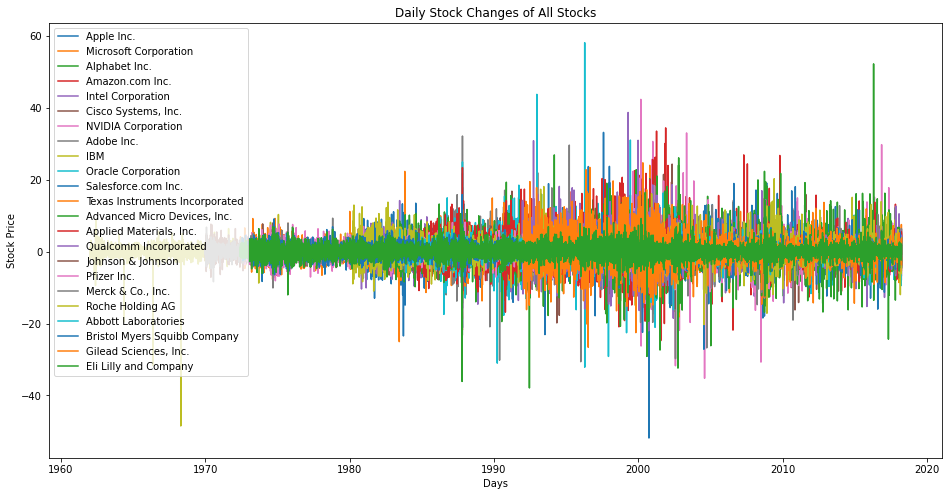

In [65]:
plt.figure(figsize=(16, 8))

for name in data_dfs:
    plt.plot(data_dfs[name].iloc[:,3].pct_change() * 100 ,label=name)

plt.title('Daily Stock Changes of All Stocks')
plt.xlabel('Days')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [8]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

input_day_num = 400
Scaler = "MinMax"

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:-1]
        target = data[i+input_days:i+input_days+output_days,-1]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    if Scaler == "MinMax":
        scaler = MinMaxScaler()
    if Scaler == "Standard":
        scaler = StandardScaler()
    val["Close Price Change Rate"] = val.iloc[:,3].pct_change()
    df_standardized_array = scaler.fit_transform(val)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, input_day_num, 1)
    train_size = int(0.97 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)



train_data_X shape:  (8100, 400, 5) 
 train_data_y shape:  (8100, 1)


In [9]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler

initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)

def lr_schedule(epoch):
    """
    Returns a learning rate based on the epoch number.
    You can customize this function based on your needs.
    """
    learning_rate = initial_learning_rate
    if epoch > 7:
        learning_rate = 0.0001  # Adjust the learning rate after a certain number of epochs
    return learning_rate

lr_scheduler = LearningRateScheduler(lr_schedule)

model = Sequential()
model.add(Conv2D(128, (10, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (8, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(32, (6, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
model.add(Conv2D(8, (2, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
# model.add(Dropout(0.5))
model.add(Dense(1, activation='linear'))
model.compile(optimizer=optimizer, loss='mean_absolute_error')
model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 391, 4, 128)       2688      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 195, 2, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 188, 1, 64)        131136    
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 94, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 89, 1, 32)         12320     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 44, 1, 32)        

In [10]:

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint,lr_scheduler])

Epoch 1/35
203/203 [==============================] - ETA: 0s - loss: 0.0503
Epoch 1: val_loss improved from inf to 0.08586, saving model to best_model.h5
203/203 [==============================] - 23s 104ms/step - loss: 0.0503 - val_loss: 0.0859 - lr: 0.0010
Epoch 2/35
  1/203 [..............................] - ETA: 19s - loss: 0.0240

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


202/203 [============================>.] - ETA: 0s - loss: 0.0296
Epoch 2: val_loss improved from 0.08586 to 0.03560, saving model to best_model.h5
203/203 [==============================] - 20s 98ms/step - loss: 0.0296 - val_loss: 0.0356 - lr: 0.0010
Epoch 3/35
202/203 [============================>.] - ETA: 0s - loss: 0.0292
Epoch 3: val_loss improved from 0.03560 to 0.01941, saving model to best_model.h5
203/203 [==============================] - 20s 99ms/step - loss: 0.0292 - val_loss: 0.0194 - lr: 0.0010
Epoch 4/35
203/203 [==============================] - ETA: 0s - loss: 0.0287
Epoch 4: val_loss improved from 0.01941 to 0.01886, saving model to best_model.h5
203/203 [==============================] - 21s 104ms/step - loss: 0.0287 - val_loss: 0.0189 - lr: 0.0010
Epoch 5/35
203/203 [==============================] - ETA: 0s - loss: 0.0279
Epoch 5: val_loss did not improve from 0.01886
203/203 [==============================] - 21s 101ms/step - loss: 0.0279 - val_loss: 0.0247 - lr:

KeyboardInterrupt: 

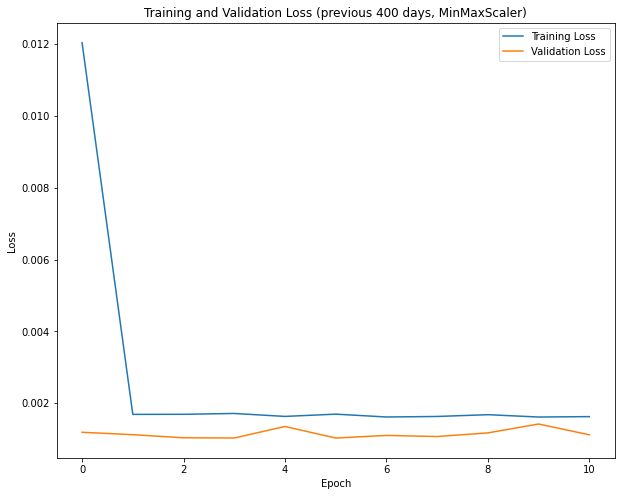

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss' + f" (previous {input_day_num} days, {Scaler}Scaler)")
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

In [86]:
data_dfs['Apple Inc.']

,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume,Close Price Change Rate
Date,,,,,,
1980-12-12,0.422706,0.424470,0.422706,0.422706,117258400.0,NaN
1980-12-15,0.402563,0.402563,0.400652,0.400652,43971200.0,-0.052174
1980-12-16,0.373010,0.373010,0.371246,0.371246,26432000.0,-0.073394
1980-12-17,0.380362,0.382273,0.380362,0.380362,21610400.0,0.024554
1980-12-18,0.391536,0.393300,0.391536,0.391536,18362400.0,0.029378
...,...,...,...,...,...,...
2018-03-21,175.040000,175.090000,171.260000,171.270000,35247358.0,-0.022655
2018-03-22,170.000000,172.680000,168.600000,168.845000,41051076.0,-0.014159
2018-03-23,168.390000,169.920000,164.940000,164.940000,40248954.0,-0.023128


254/254 [==============================] - 10s 39ms/step


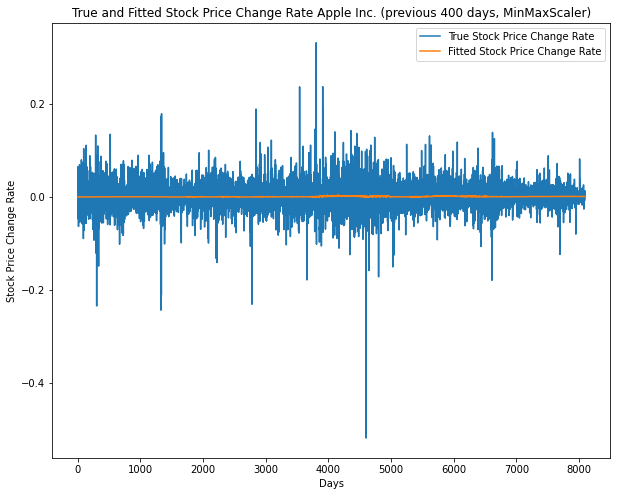

In [12]:

import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 5), train_y_dict[name]), axis=1))[:,-1]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 5), model.predict(train_X)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.plot(train_y[window_size:], label='True Stock Price Change Rate')
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price Change Rate')
    plt.title('True and Fitted Stock Price Change Rate'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::1]:
    plot_stock_fit(best_model, name, 1)

29/29 [==============================] - 1s 31ms/step


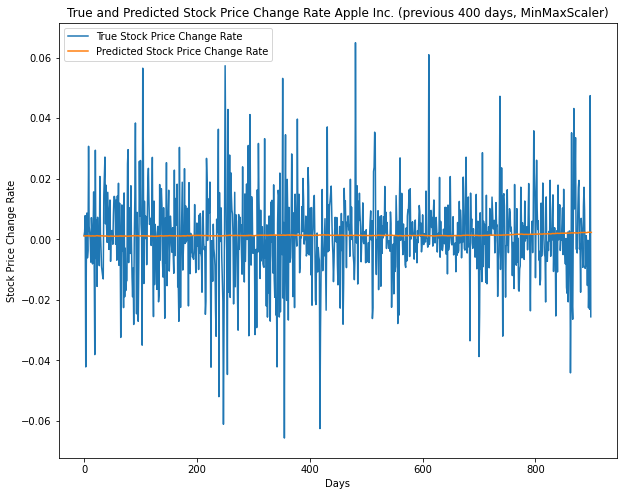

In [17]:

import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_pred(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), model.predict(test_X)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.plot(test_y[window_size:], label='True Stock Price Change Rate')
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price Change Rate')
    plt.title('True and Predicted Stock Price Change Rate'+" "+name + f" (previous {input_day_num} days, {Scaler}Scaler)")
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::1]:
    plot_stock_pred(best_model, name, 1)

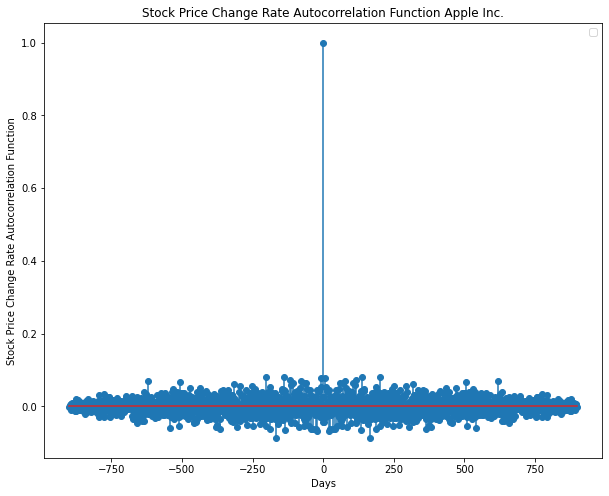

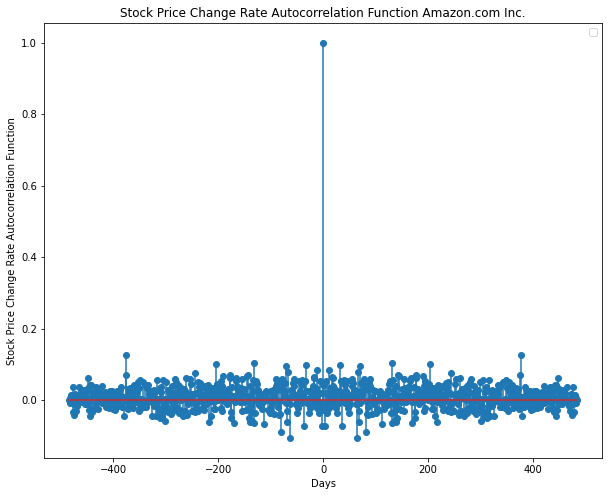

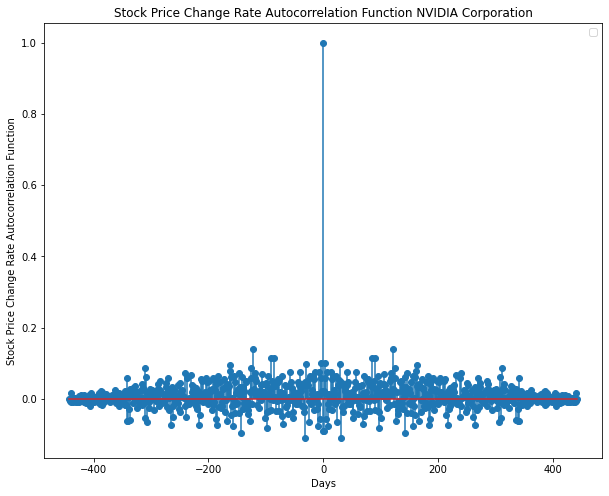

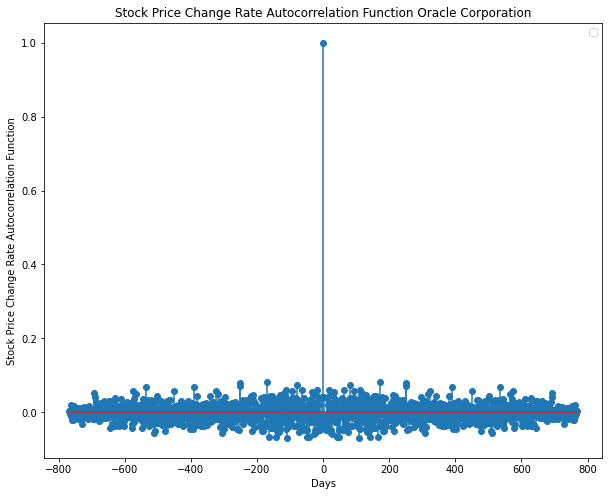

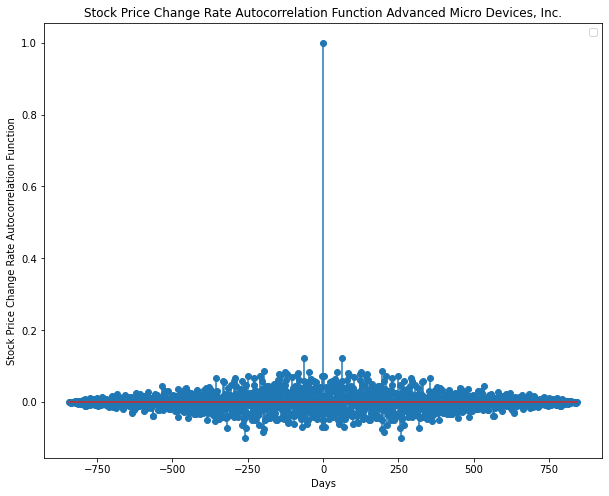

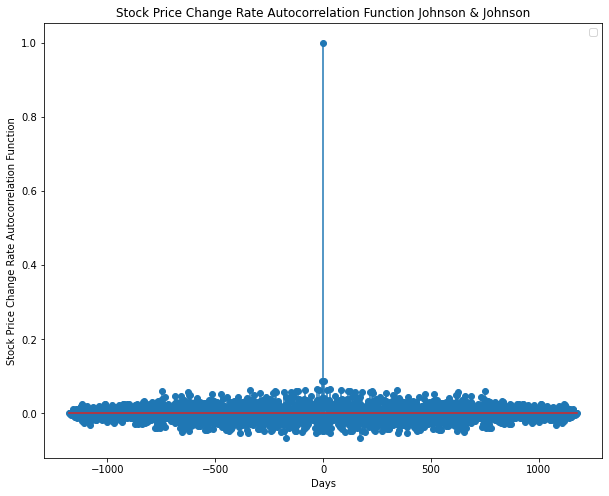

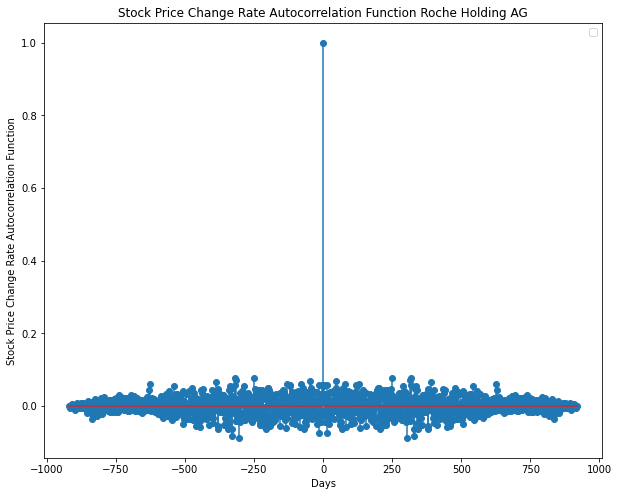

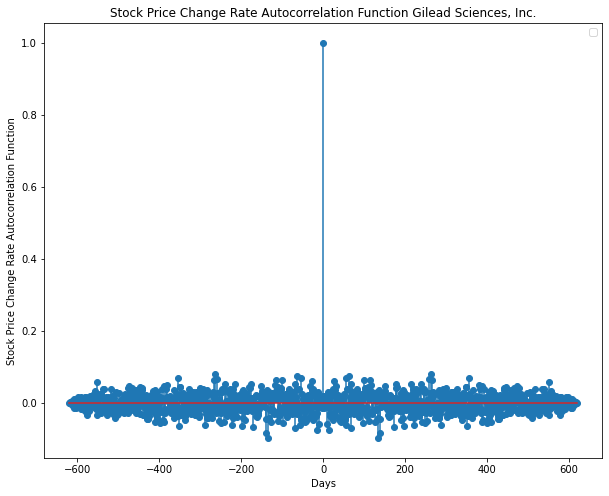

In [66]:
def plot_stock_ACF(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    autocorrelation = np.correlate(test_y, test_y, mode='full')
    autocorrelation /= np.max(autocorrelation)
    lags = np.arange(-len(test_y) + 1, len(test_y))
    plt.stem(lags, autocorrelation, use_line_collection=True)
    plt.title('Stock Price Change Rate Autocorrelation Function'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate Autocorrelation Function')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_ACF(best_model, name, 1)


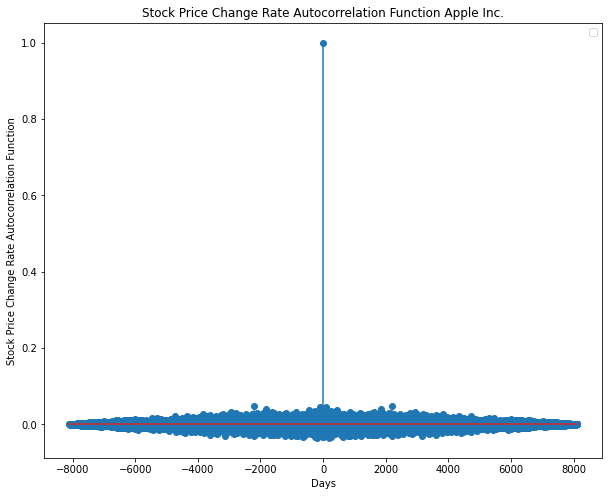

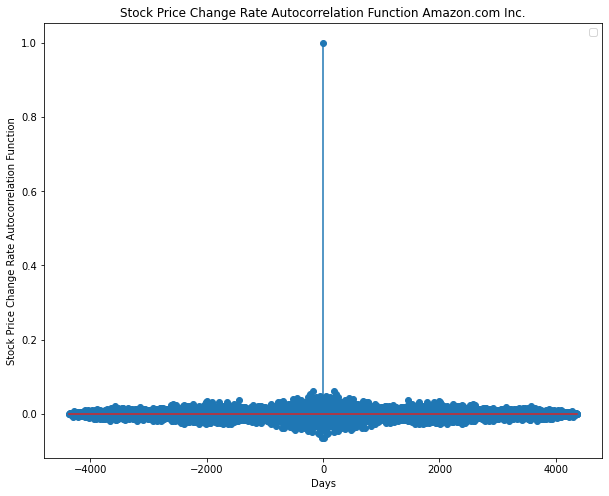

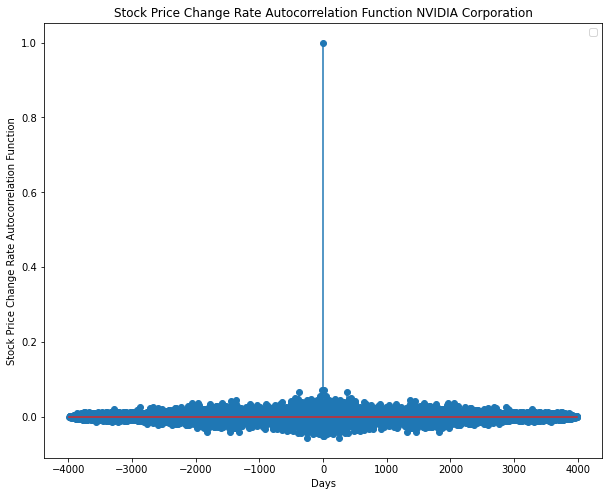

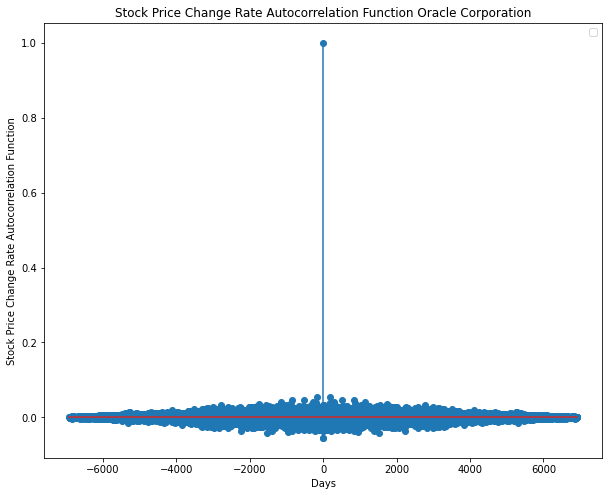

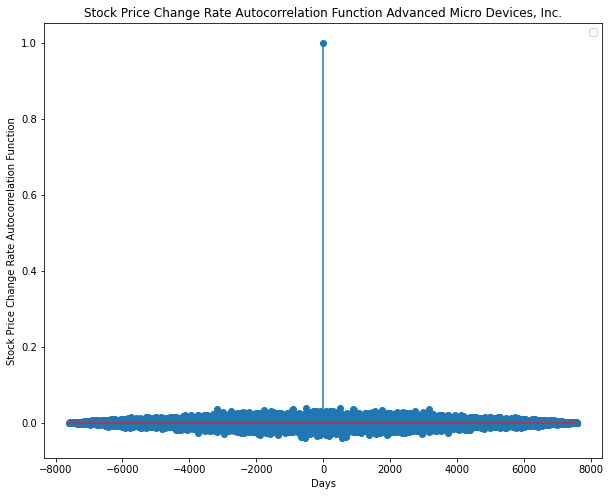

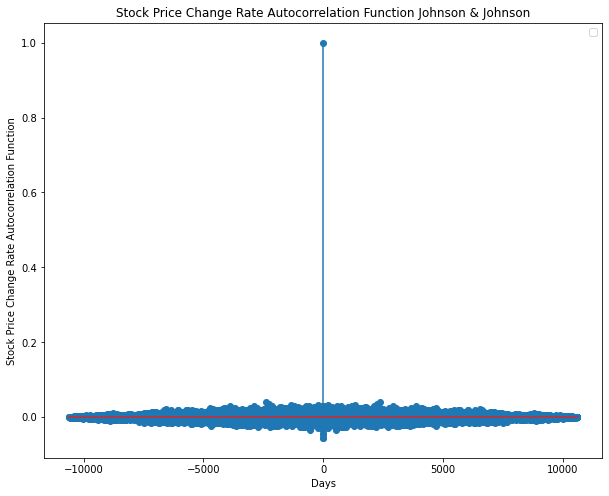

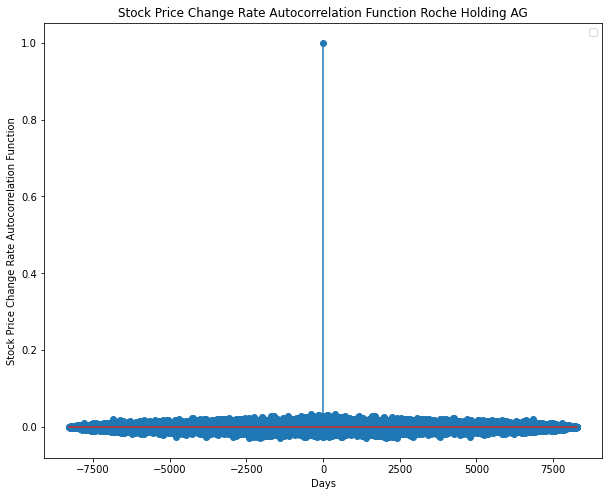

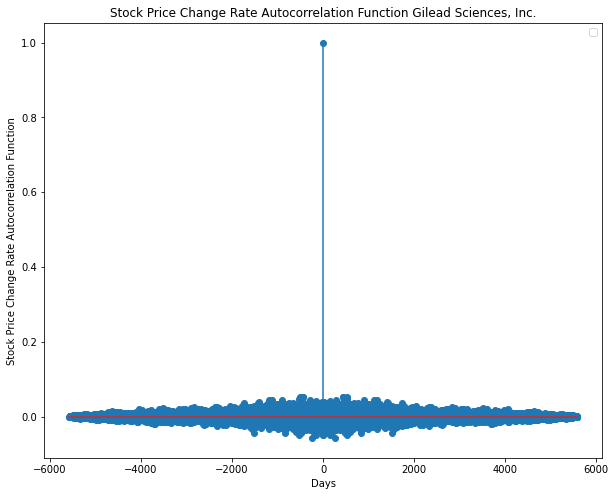

In [67]:
def plot_stock_ACF(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    autocorrelation = np.correlate(train_y, train_y, mode='full')
    autocorrelation /= np.max(autocorrelation)
    lags = np.arange(-len(train_y) + 1, len(train_y))
    plt.stem(lags, autocorrelation, use_line_collection=True)
    plt.title('Stock Price Change Rate Autocorrelation Function'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate Autocorrelation Function')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_ACF(best_model, name, 1)

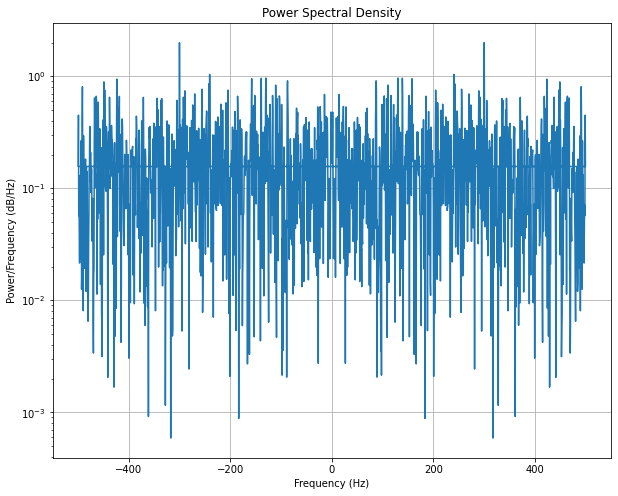

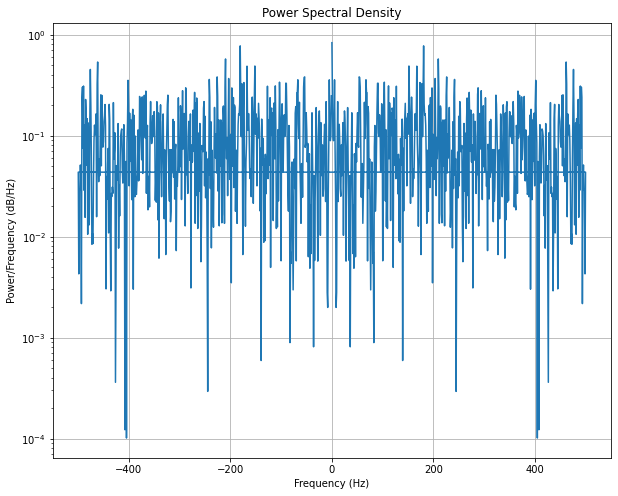

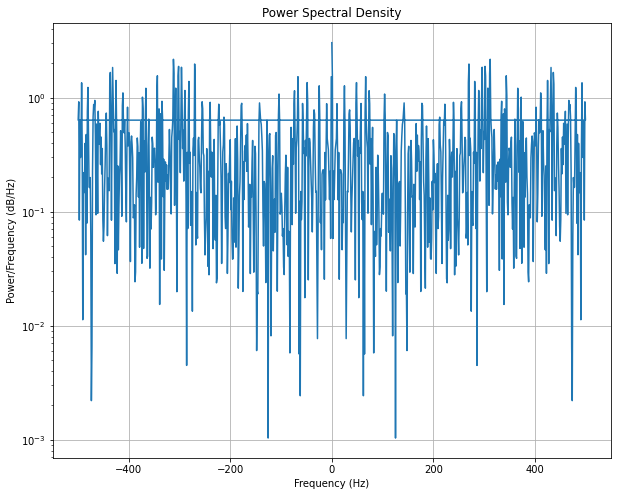

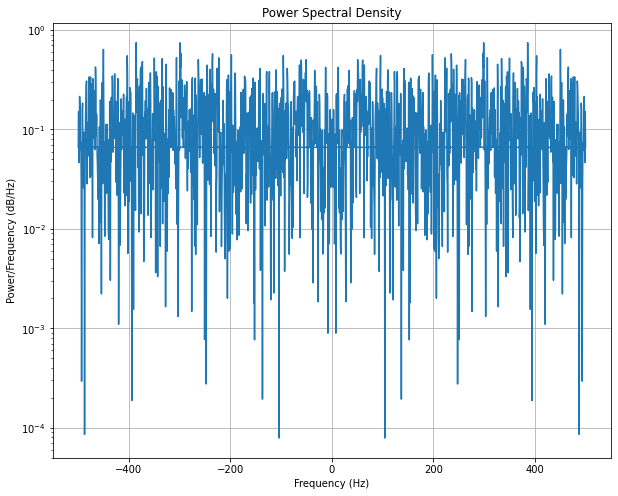

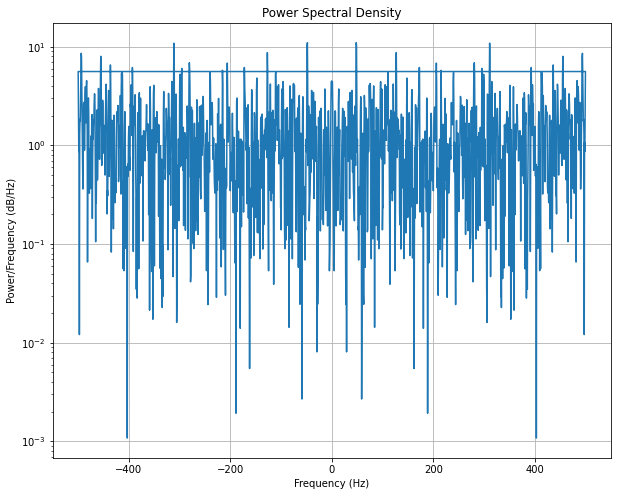

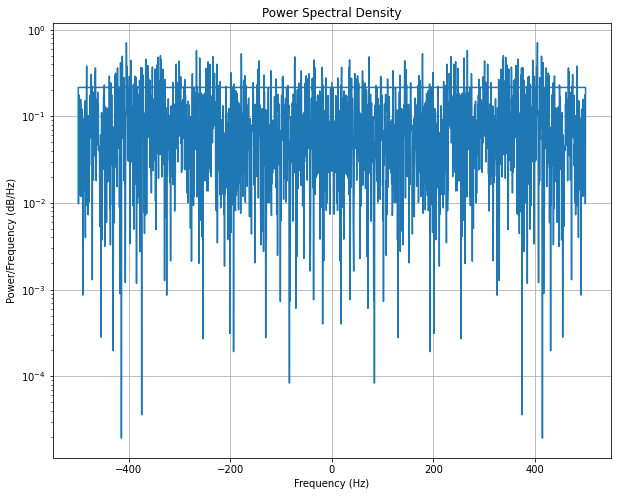

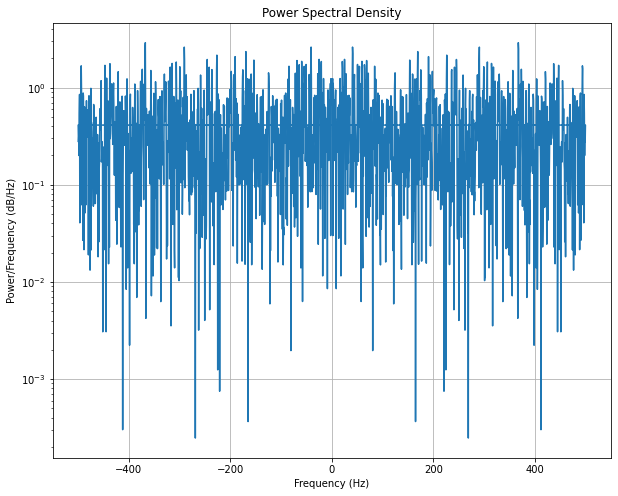

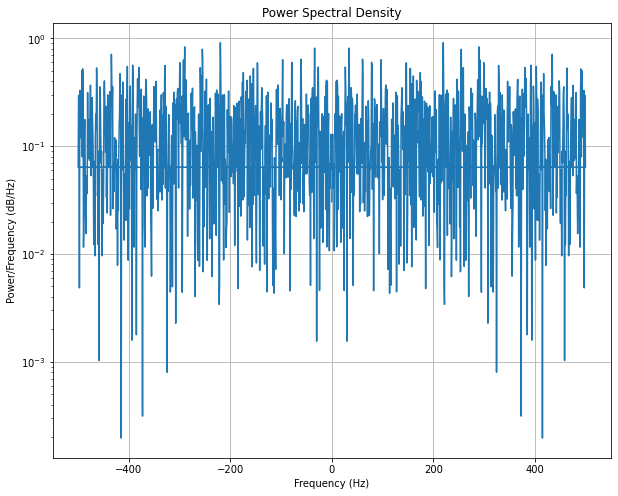

In [43]:
from scipy.signal import welch
from scipy.fft import fft, ifft

def plot_stock_PSD(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    acf = np.correlate(test_y, test_y, mode='full')

    # Calculate the Power Spectral Density using the Fourier Transform of the autocorrelation function
    psd = np.abs(fft(acf))

    # Define the frequency axis
    fs = 1000  # Sampling frequency
    freq = np.fft.fftfreq(len(psd), 1/fs)

    # Plot the Power Spectral Density
    plt.semilogy(freq, psd)
    plt.title('Power Spectral Density')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.grid(True)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_PSD(best_model, name, 1)

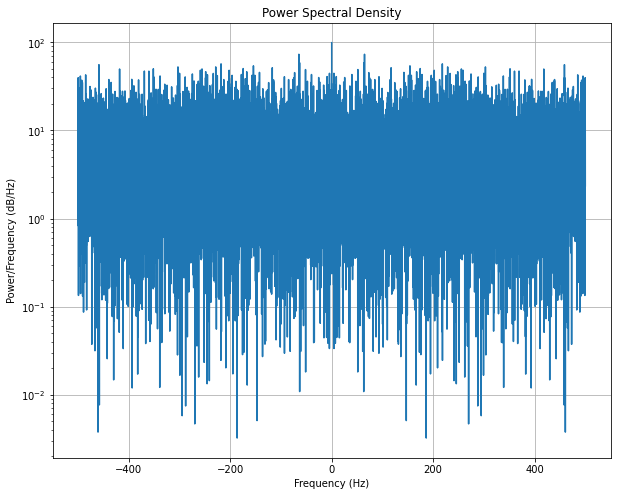

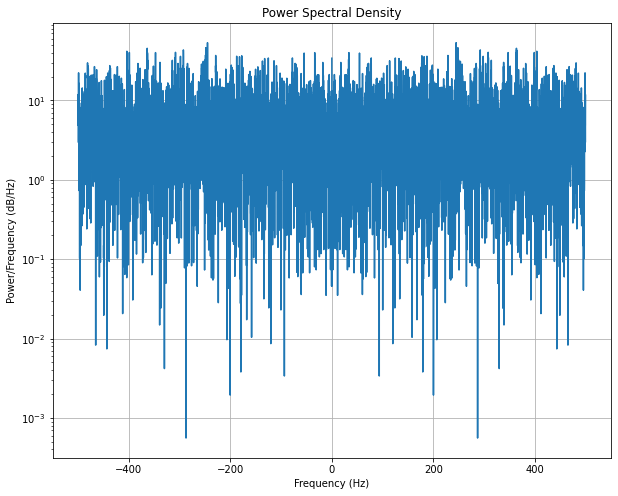

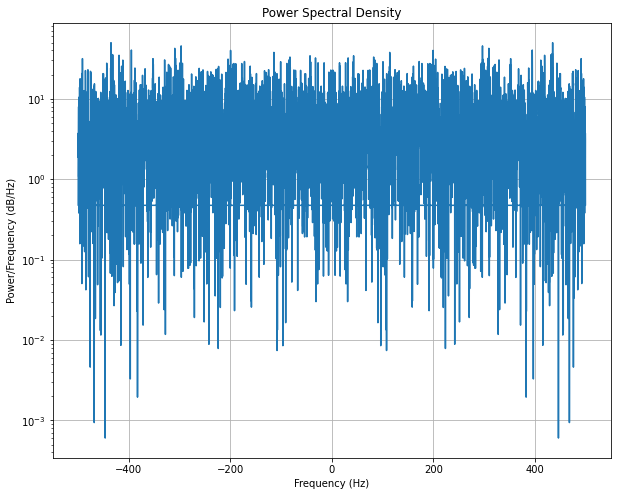

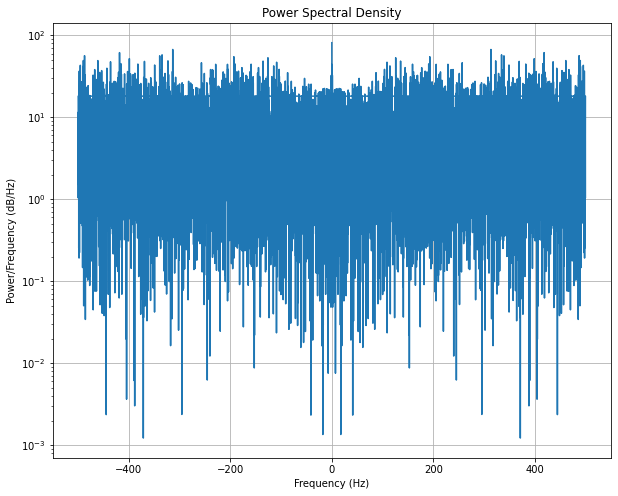

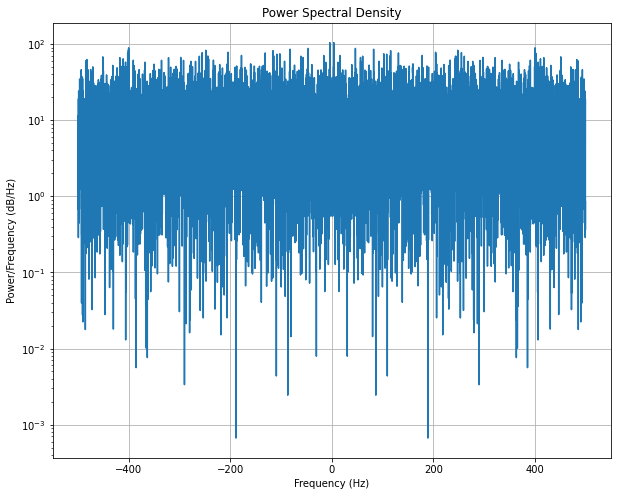

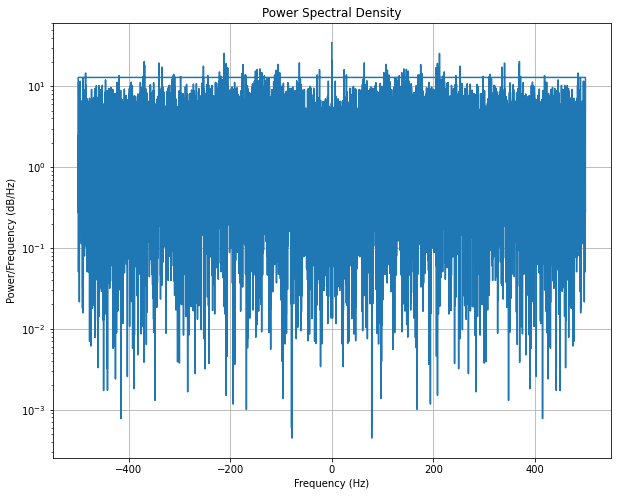

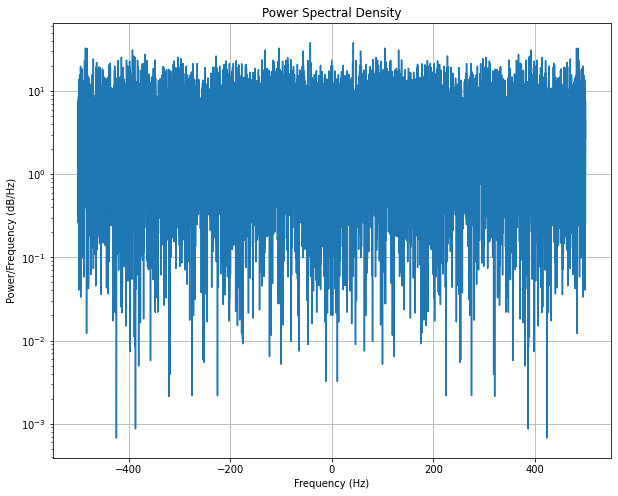

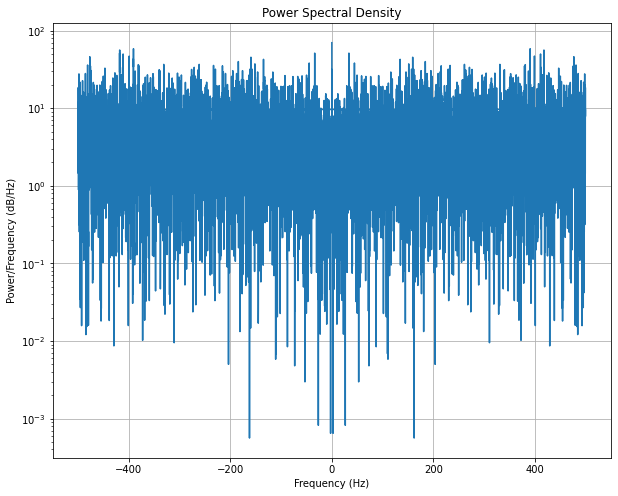

In [68]:
from scipy.signal import welch
from scipy.fft import fft, ifft

def plot_stock_PSD(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    acf = np.correlate(train_y, train_y, mode='full')

    # Calculate the Power Spectral Density using the Fourier Transform of the autocorrelation function
    psd = np.abs(fft(acf))

    # Define the frequency axis
    fs = 1000  # Sampling frequency
    freq = np.fft.fftfreq(len(psd), 1/fs)

    # Plot the Power Spectral Density
    plt.semilogy(freq, psd)
    plt.title('Power Spectral Density')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.grid(True)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_PSD(best_model, name, 1)

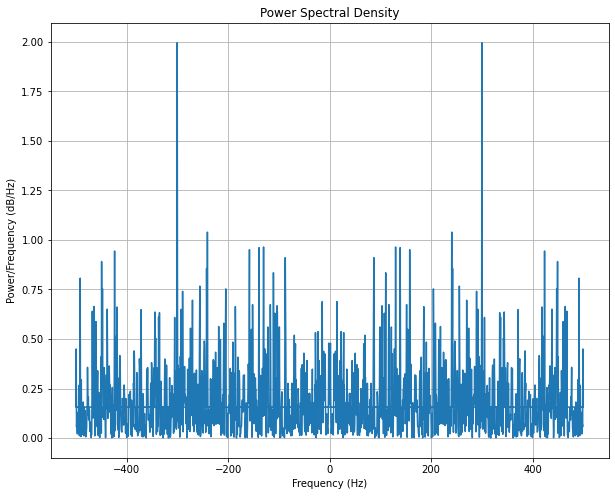

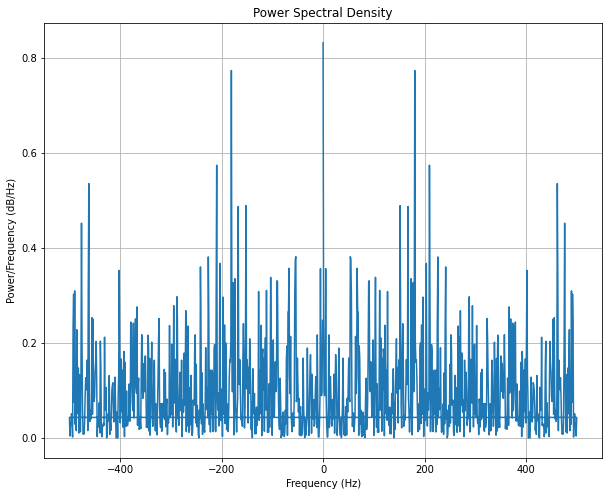

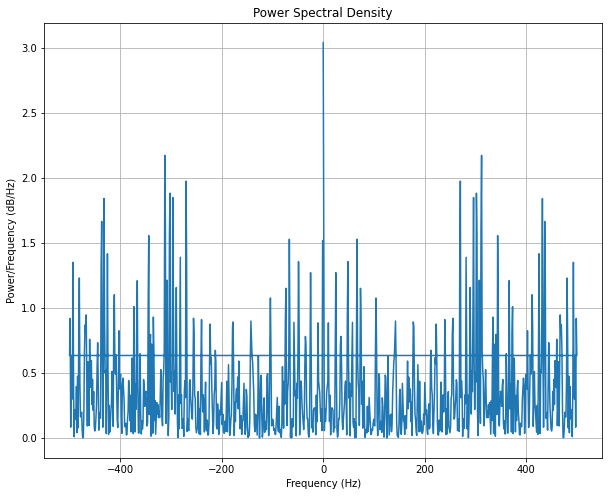

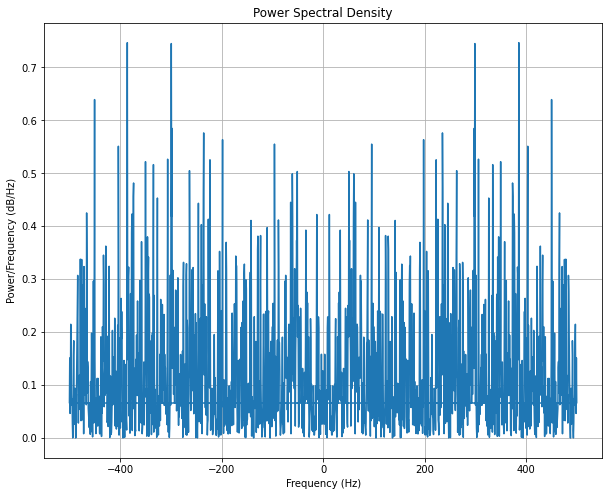

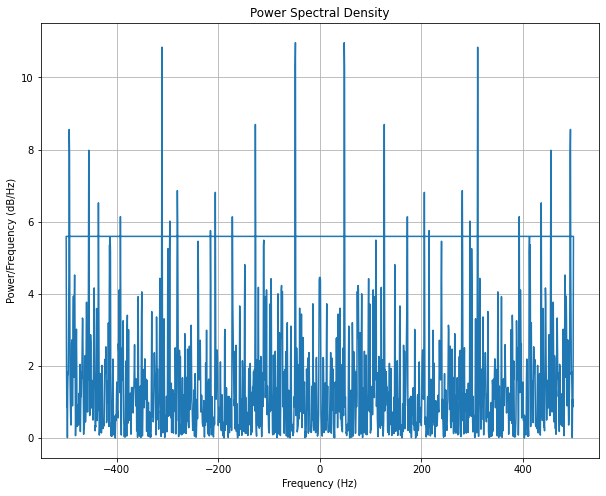

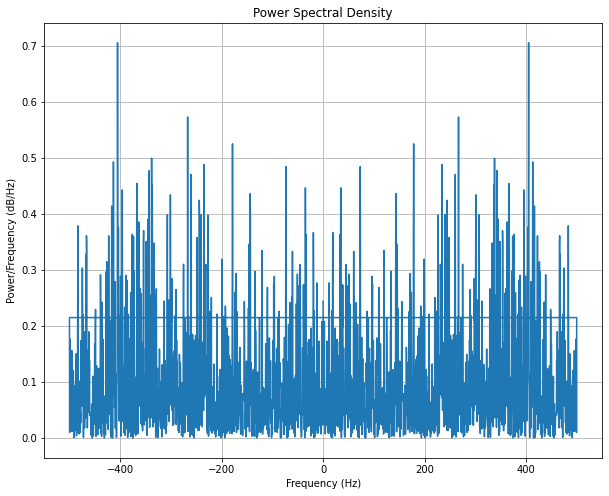

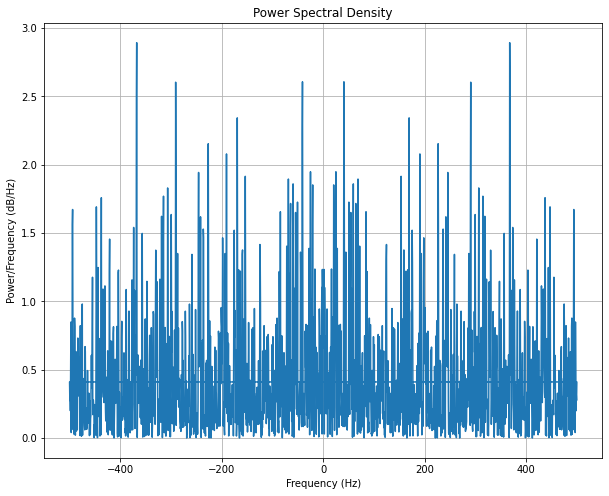

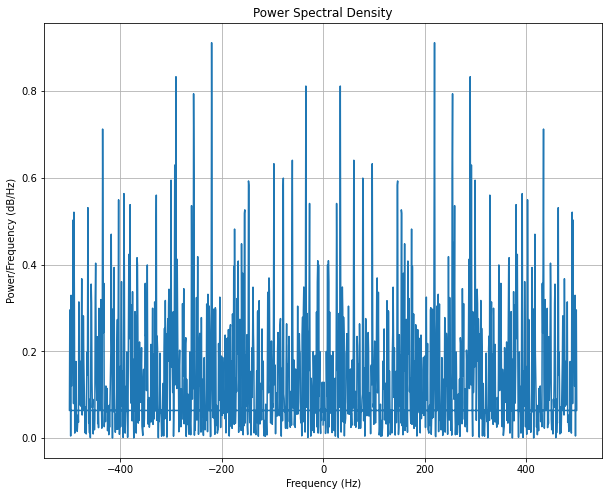

In [44]:

def plot_stock_PSD(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    acf = np.correlate(test_y, test_y, mode='full')

    # Calculate the Power Spectral Density using the Fourier Transform of the autocorrelation function
    psd = np.abs(fft(acf))

    # Define the frequency axis
    fs = 1000  # Sampling frequency
    freq = np.fft.fftfreq(len(psd), 1/fs)

    # Plot the Power Spectral Density
    plt.plot(freq, psd)
    plt.title('Power Spectral Density')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.grid(True)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_PSD(best_model, name, 1)

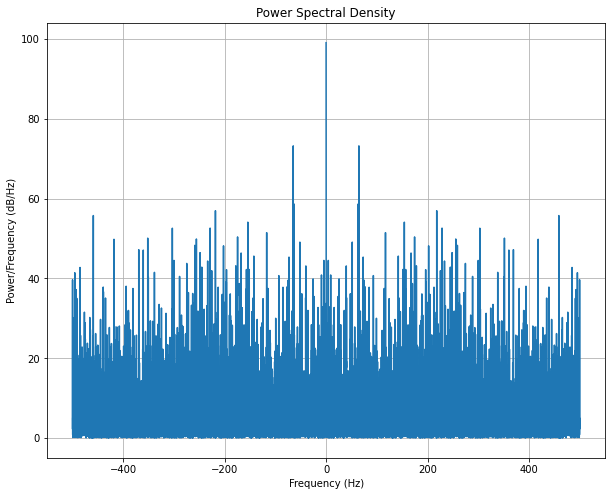

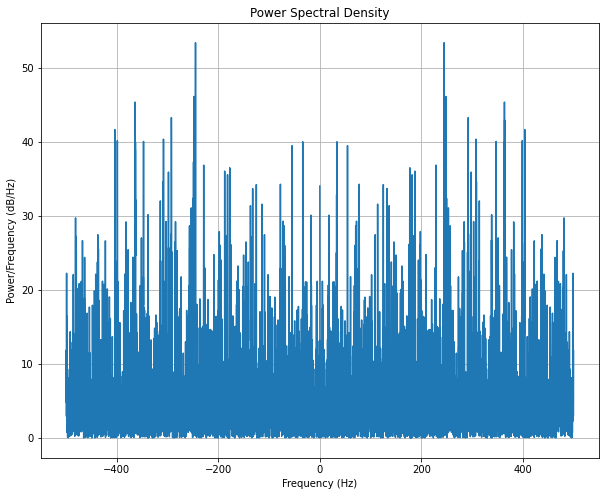

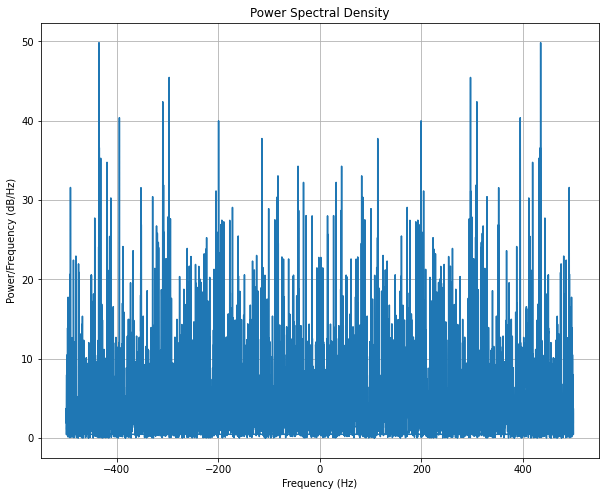

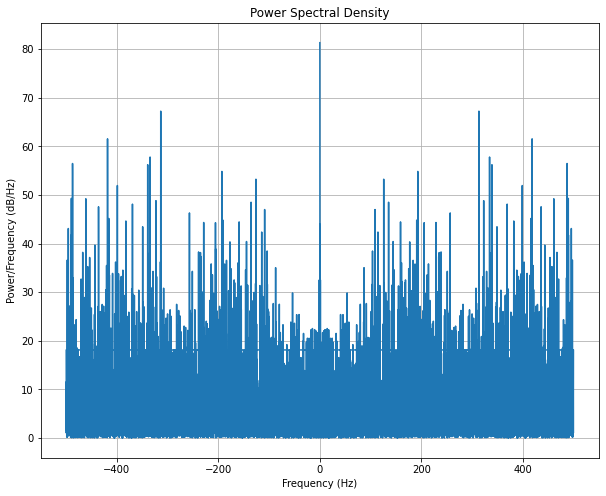

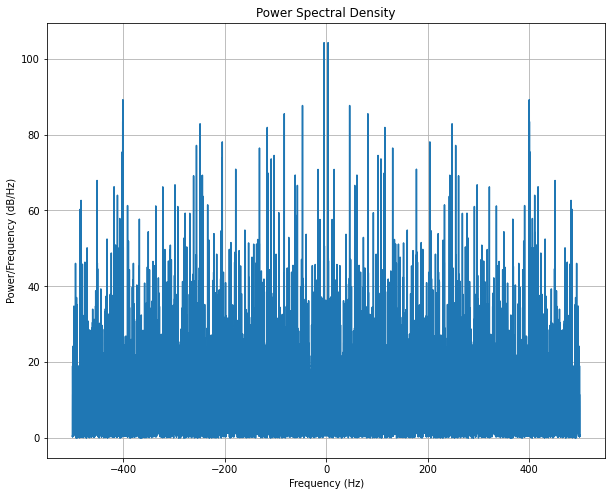

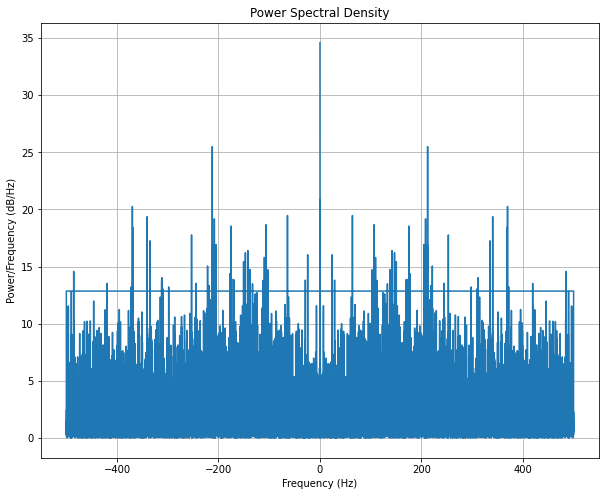

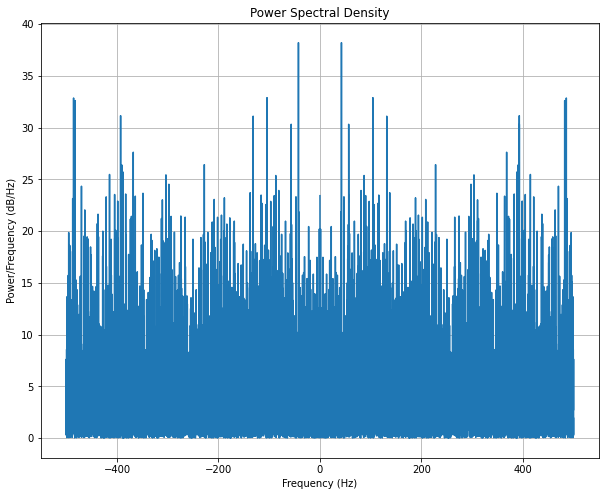

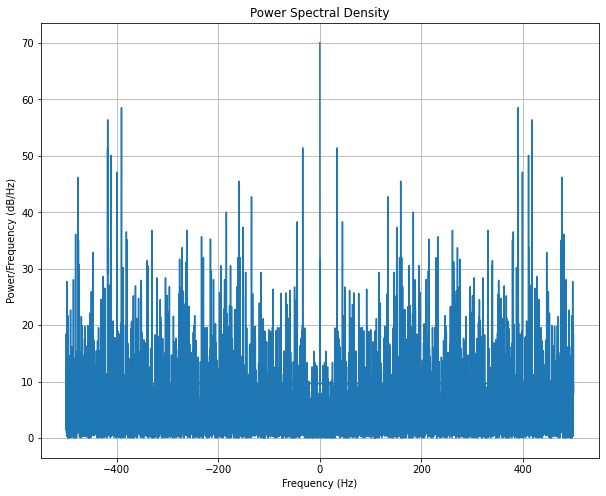

In [69]:

def plot_stock_PSD(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    acf = np.correlate(train_y, train_y, mode='full')

    # Calculate the Power Spectral Density using the Fourier Transform of the autocorrelation function
    psd = np.abs(fft(acf))

    # Define the frequency axis
    fs = 1000  # Sampling frequency
    freq = np.fft.fftfreq(len(psd), 1/fs)

    # Plot the Power Spectral Density
    plt.plot(freq, psd)
    plt.title('Power Spectral Density')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.grid(True)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_PSD(best_model, name, 1)

We can see that the sequence is nearly white noise.

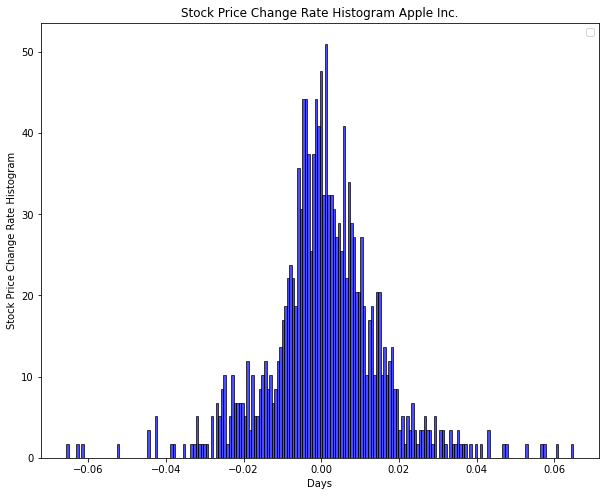

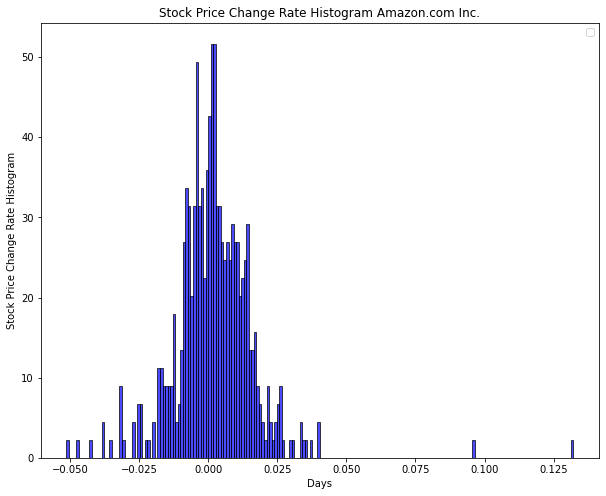

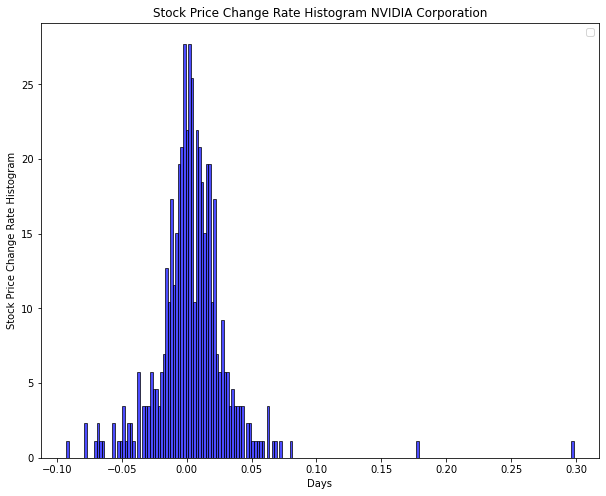

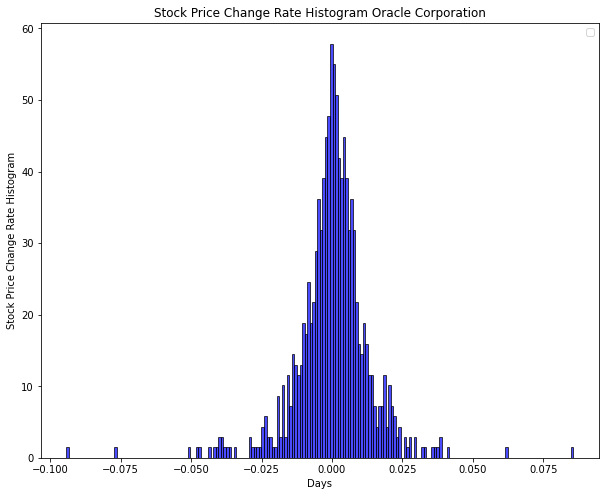

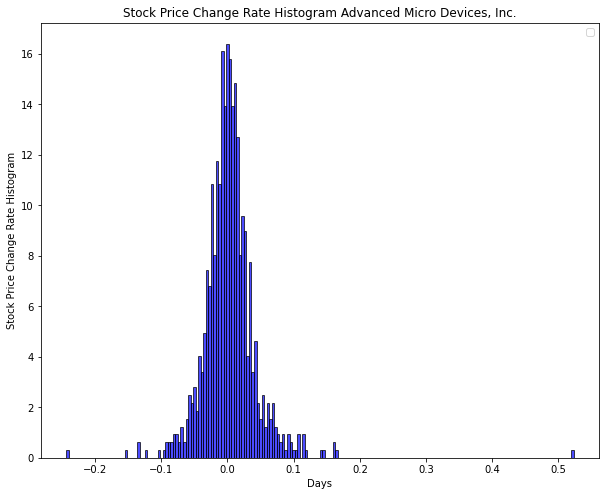

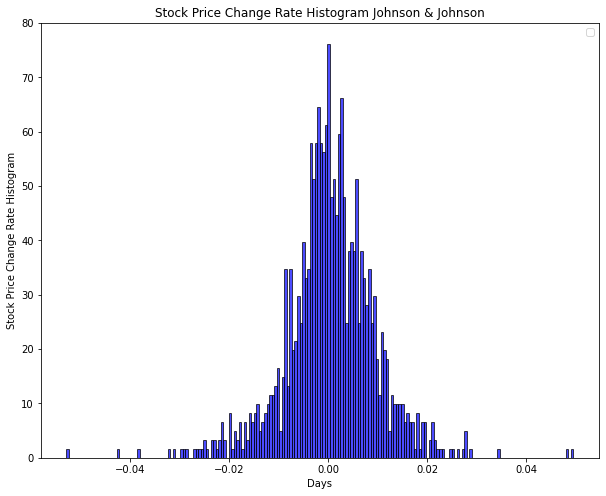

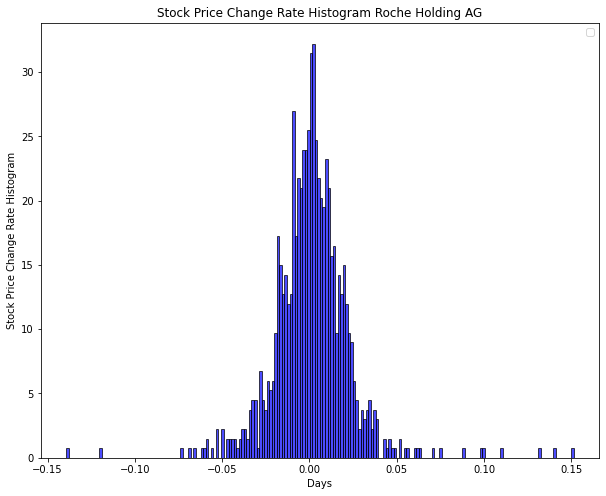

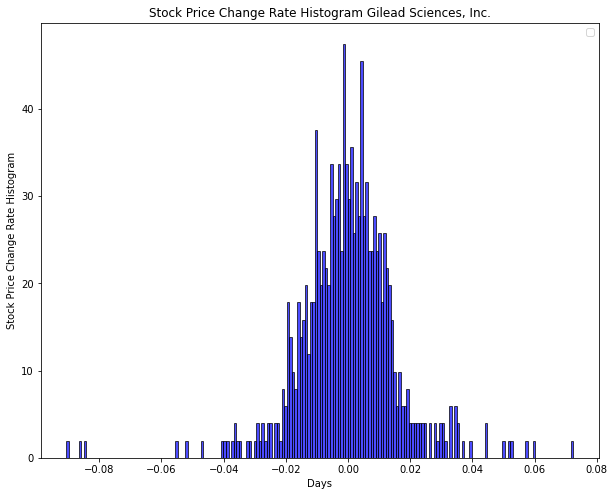

In [37]:
def plot_stock_hist(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.hist(test_y, bins=200, density=True, alpha=0.7, color='blue', edgecolor='black')
    plt.title('Stock Price Change Rate Histogram'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate Histogram')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_hist(best_model, name, 1)

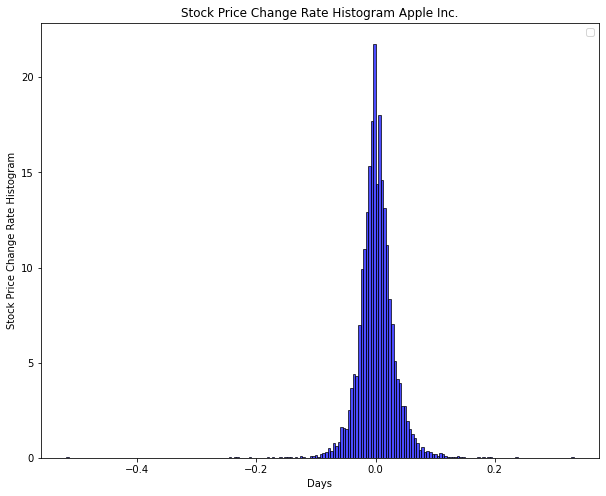

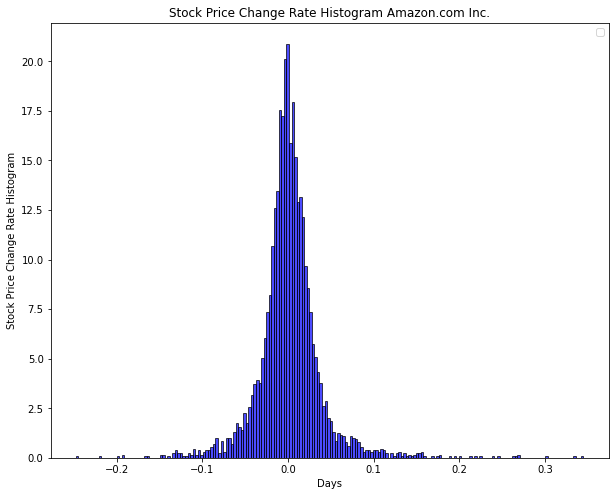

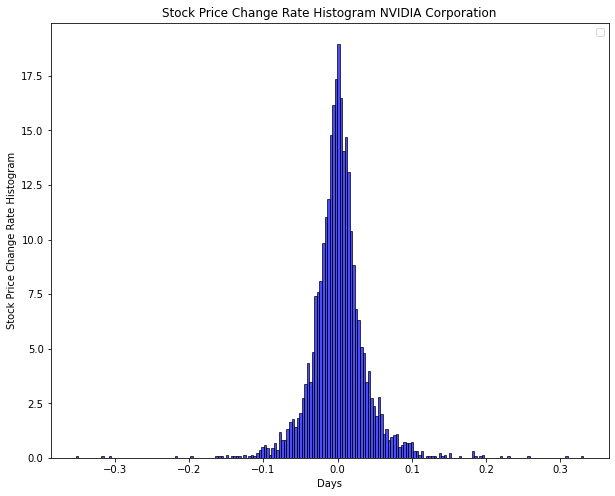

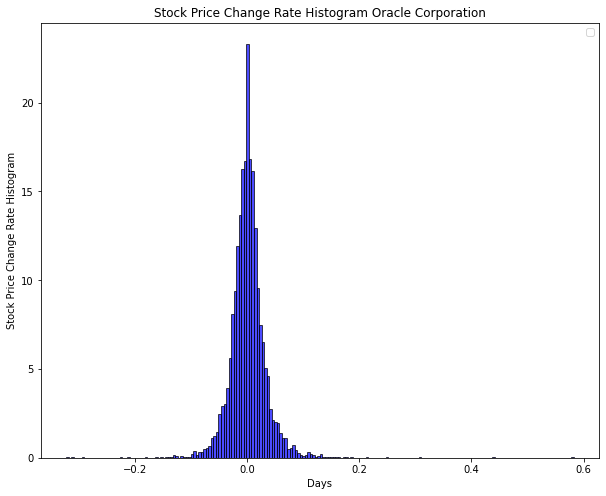

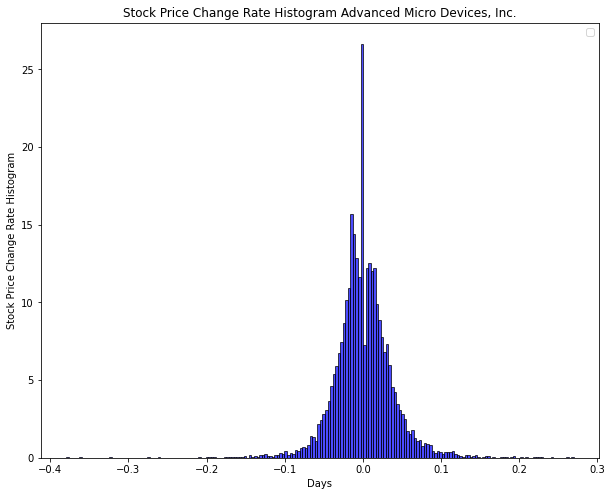

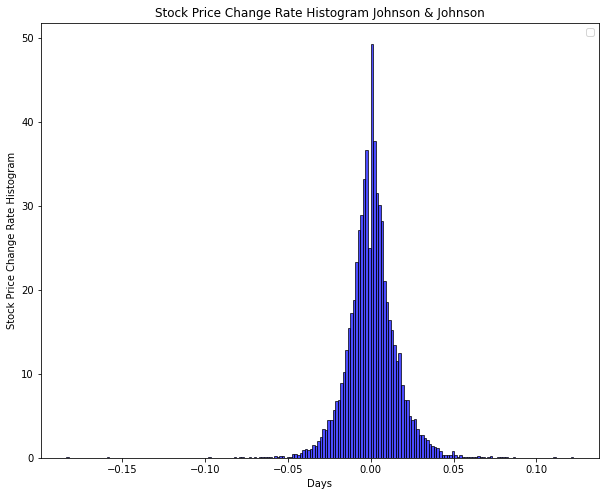

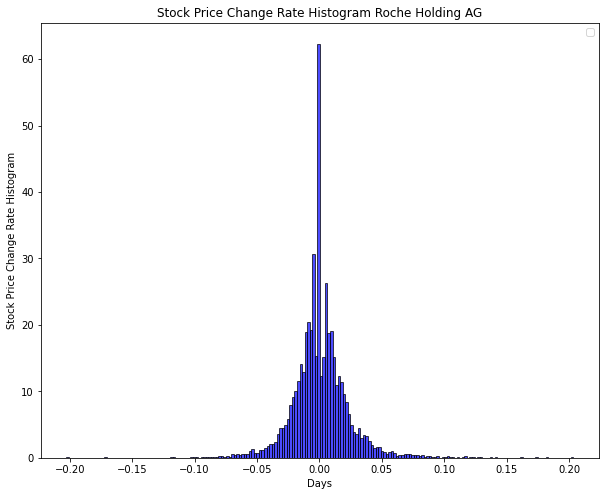

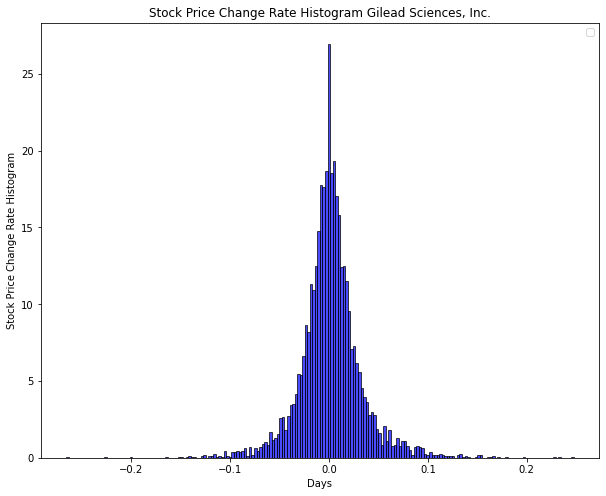

In [70]:
def plot_stock_hist(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.hist(train_y, bins=200, density=True, alpha=0.7, color='blue', edgecolor='black')
    plt.title('Stock Price Change Rate Histogram'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price Change Rate Histogram')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_hist(best_model, name, 1)

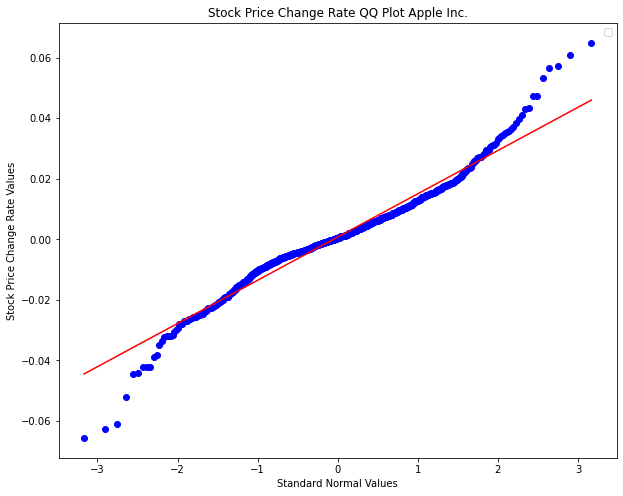

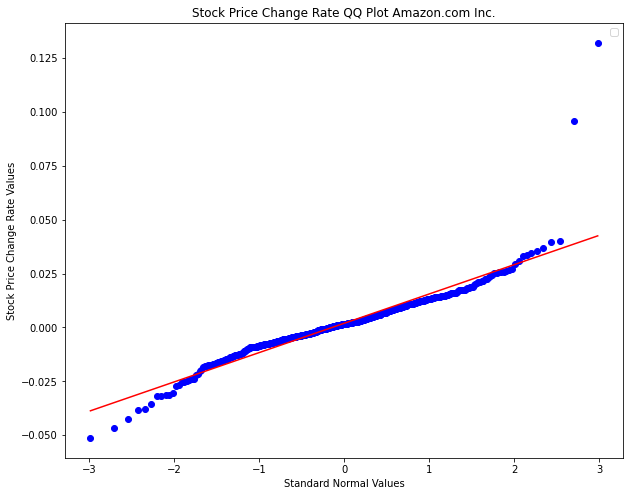

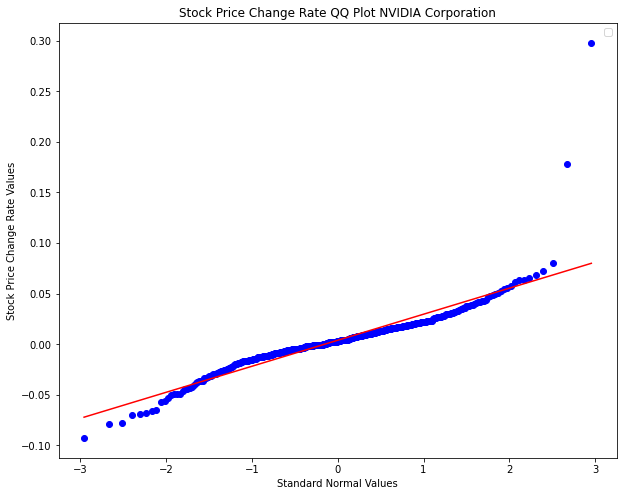

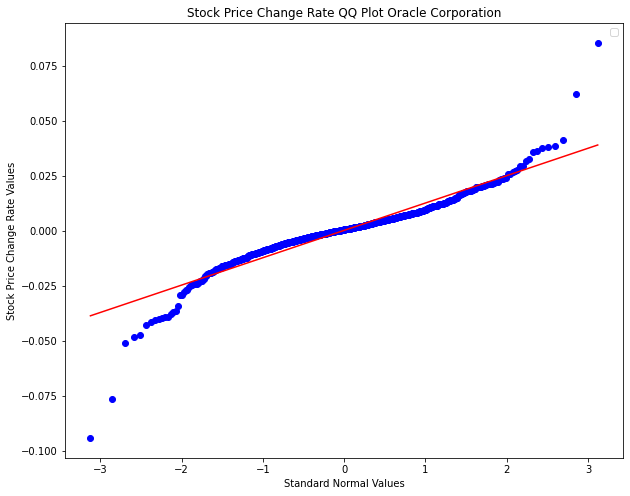

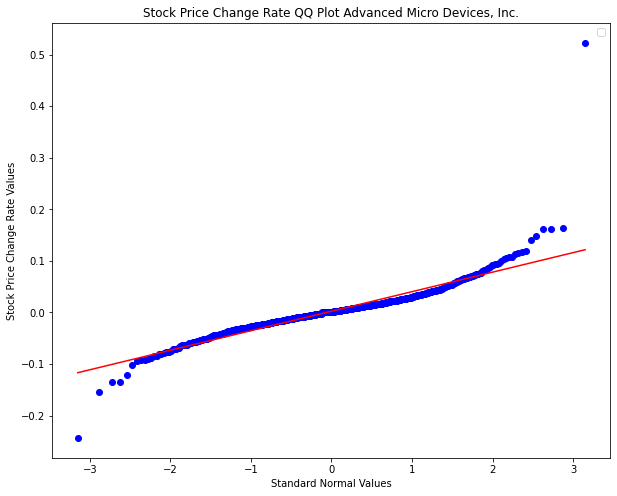

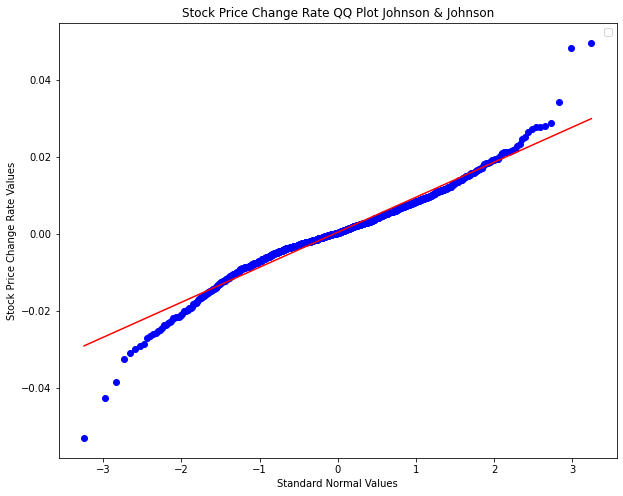

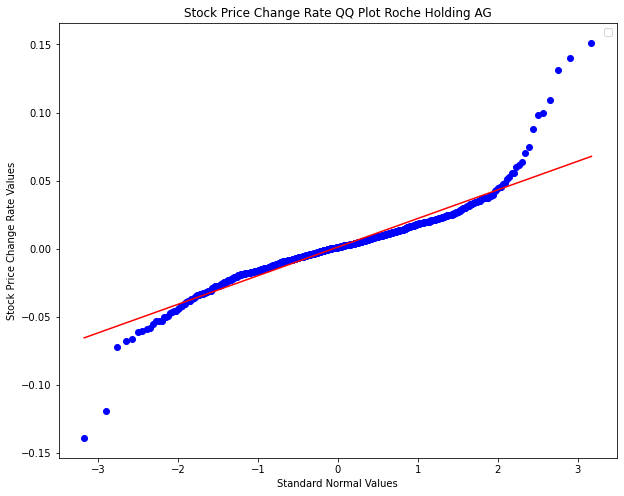

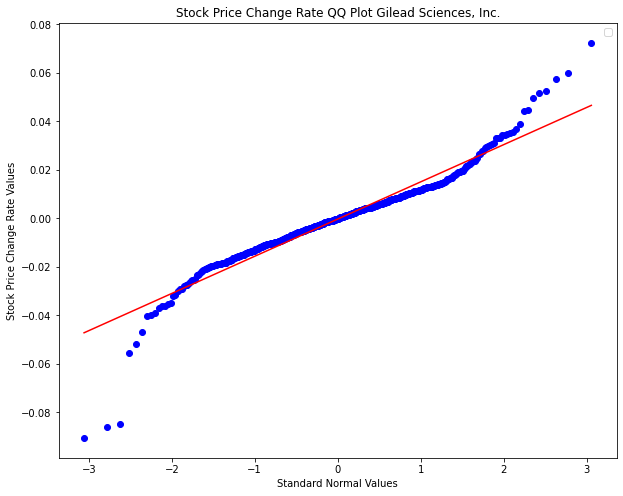

In [49]:
from scipy import stats

def plot_stock_qqplot(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    stats.probplot(test_y, dist='norm', plot=plt)
    plt.title('Stock Price Change Rate QQ Plot'+" "+name)
    plt.xlabel('Standard Normal Values')
    plt.ylabel('Stock Price Change Rate Values')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_qqplot(best_model, name, 1)

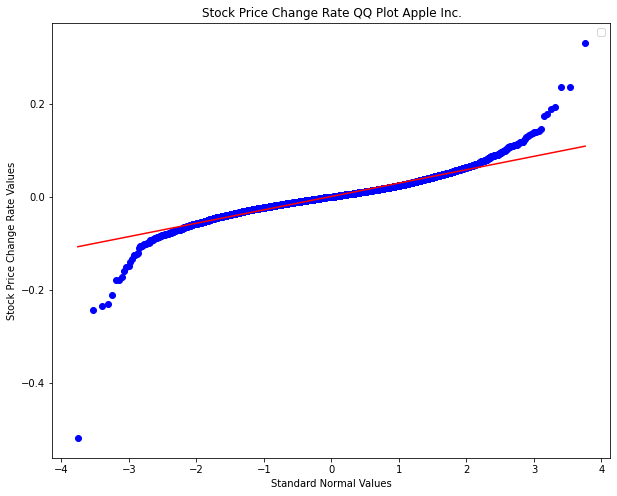

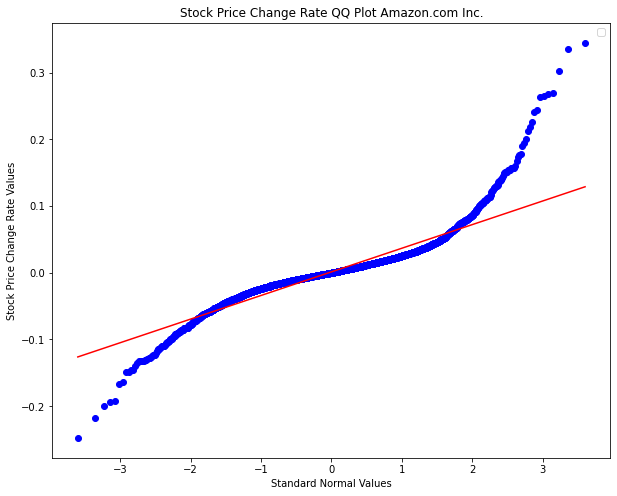

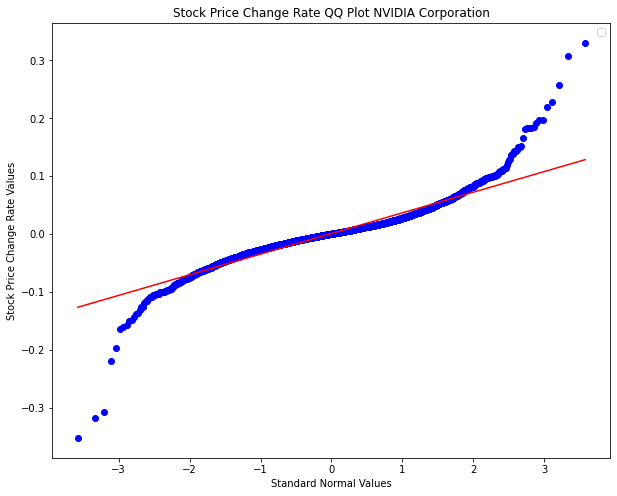

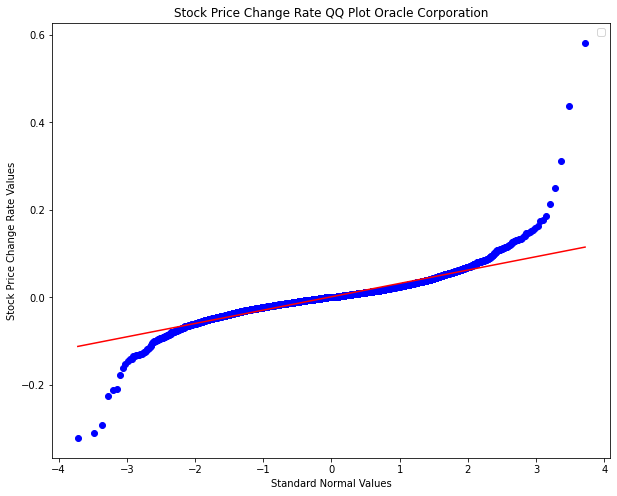

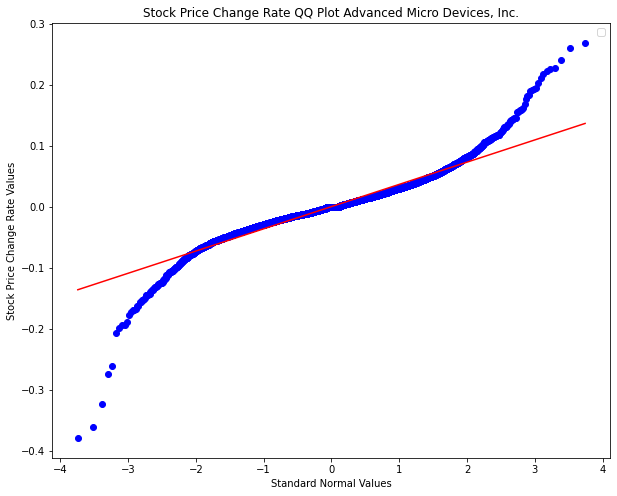

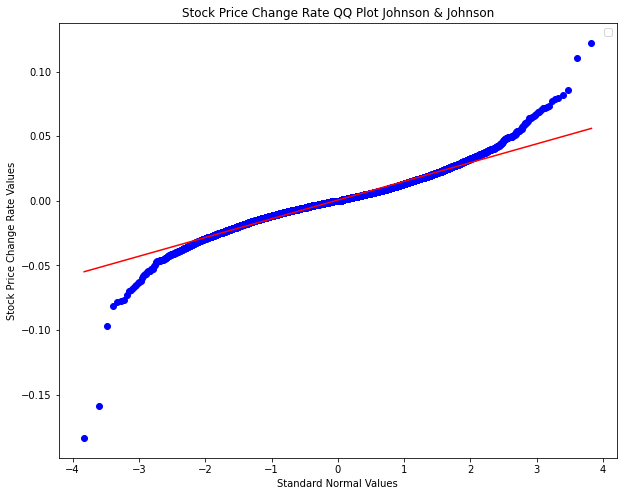

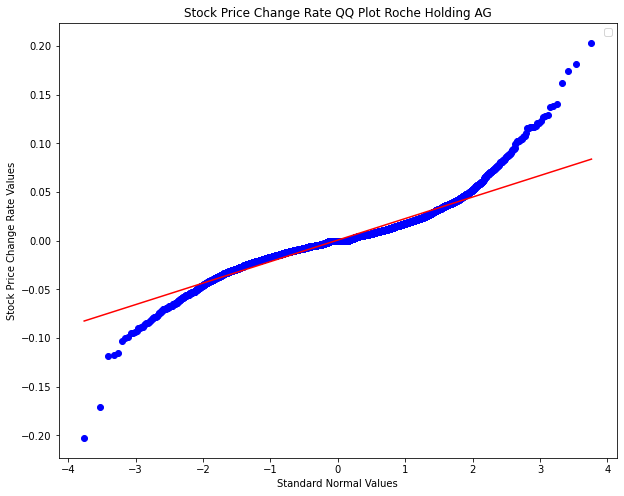

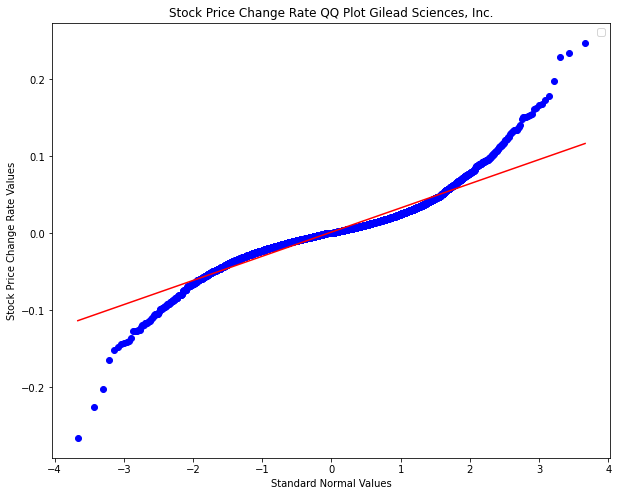

In [71]:
from scipy import stats

def plot_stock_qqplot(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    stats.probplot(train_y, dist='norm', plot=plt)
    plt.title('Stock Price Change Rate QQ Plot'+" "+name)
    plt.xlabel('Standard Normal Values')
    plt.ylabel('Stock Price Change Rate Values')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_qqplot(best_model, name, 1)

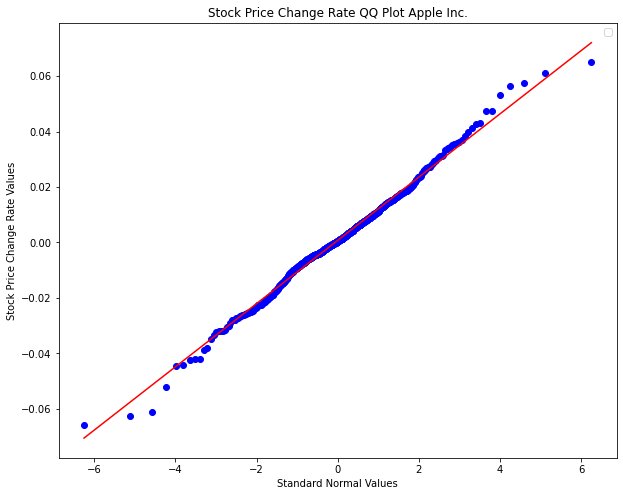

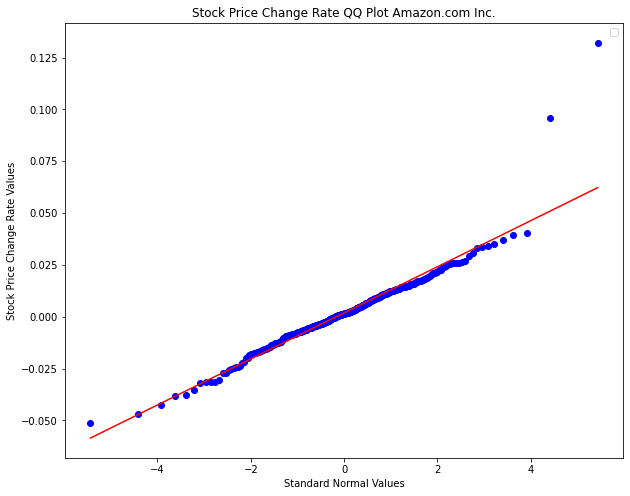

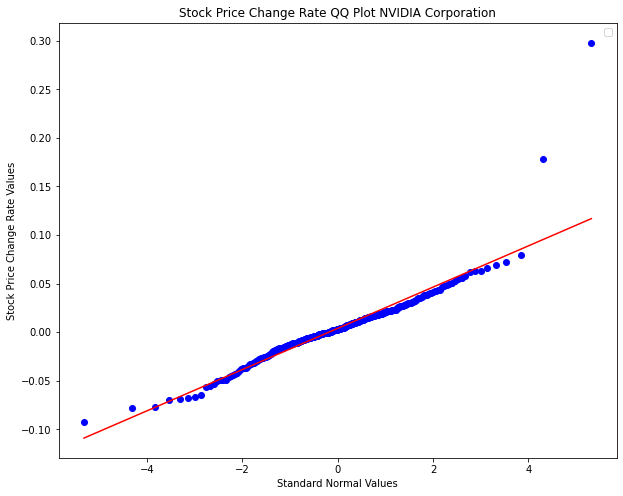

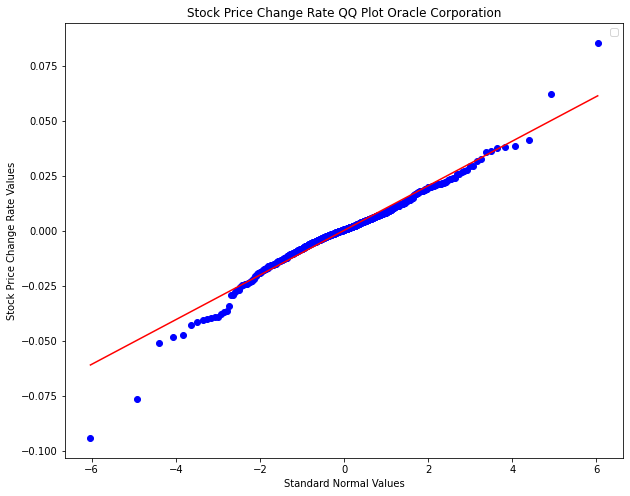

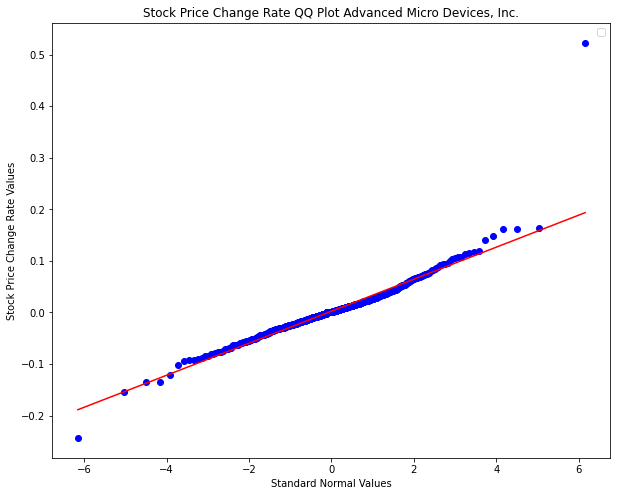

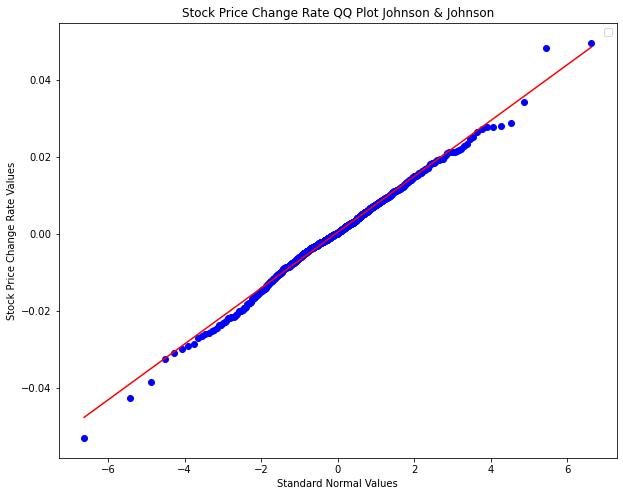

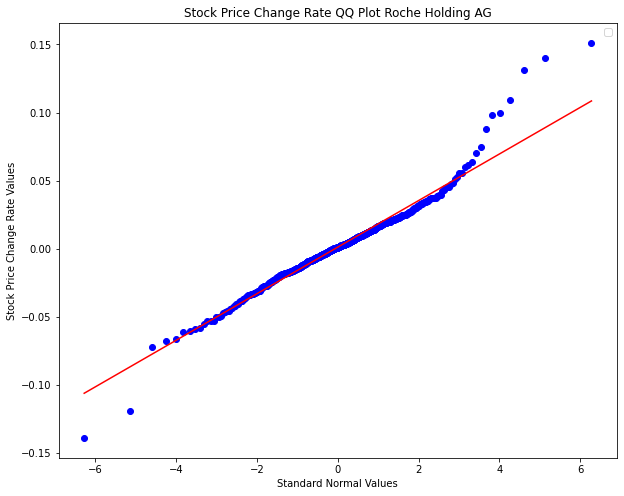

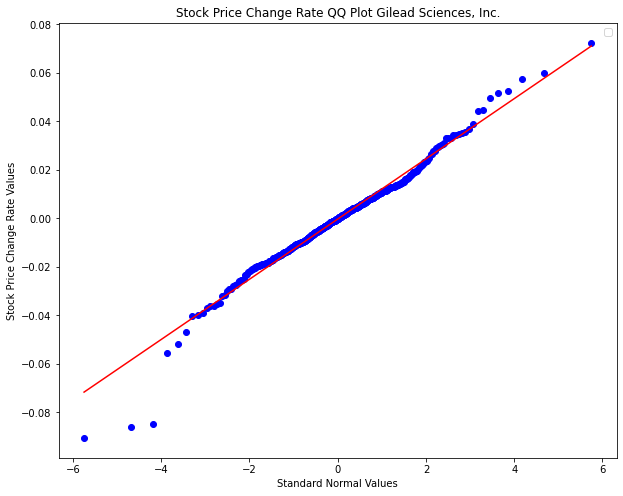

In [61]:
def plot_stock_qqplot(model, name, window_size):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    t_df = 5
    # theoretical_quantiles = t.ppf(np.linspace(0.01, 0.99, len(test_y)), df=t_df)
    stats.probplot(test_y, dist=t, sparams=(t_df,), plot=plt)
    plt.title('Stock Price Change Rate QQ Plot'+" "+name)
    plt.xlabel('Standard Normal Values')
    plt.ylabel('Stock Price Change Rate Values')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_qqplot(best_model, name, 1)

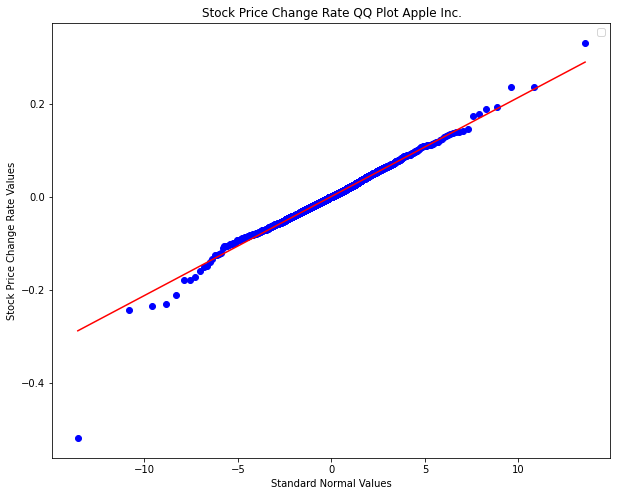

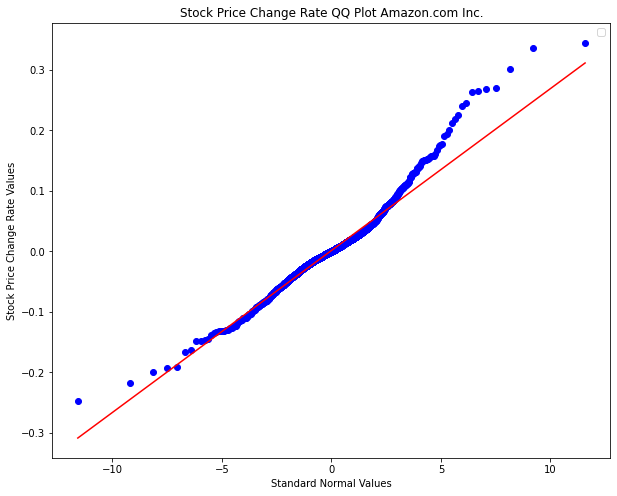

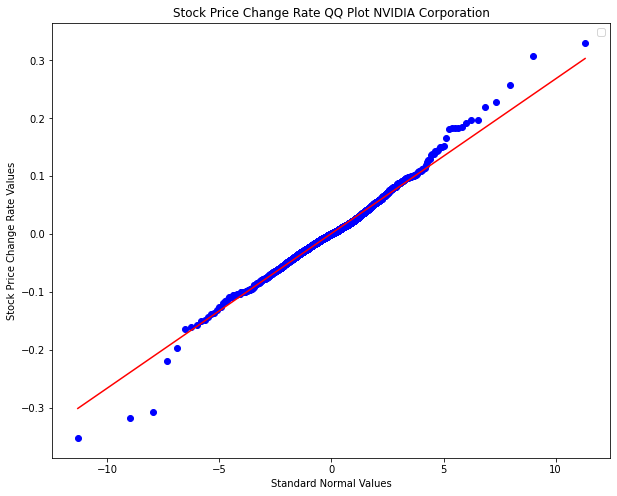

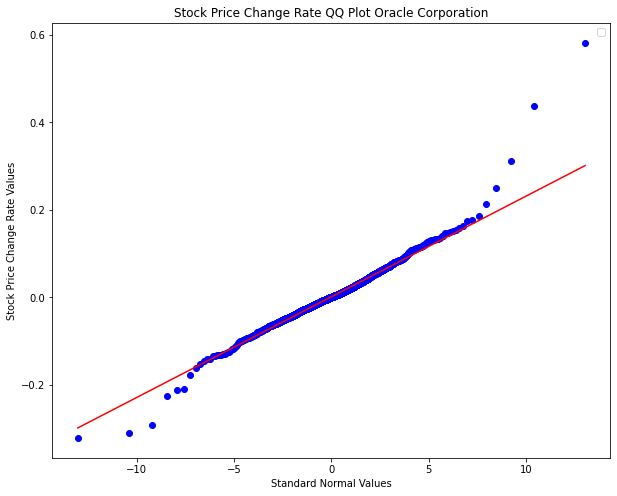

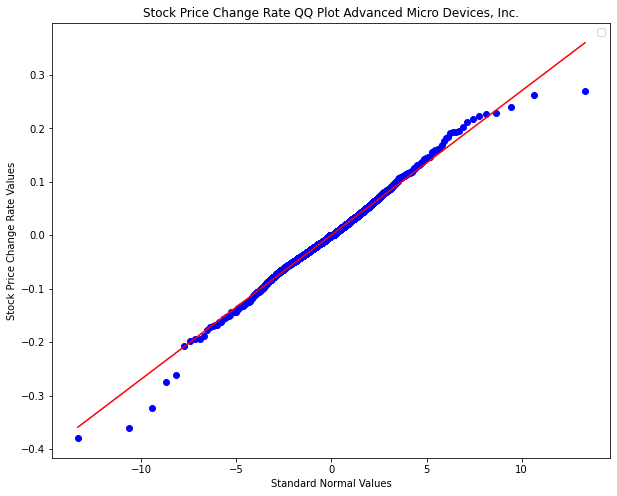

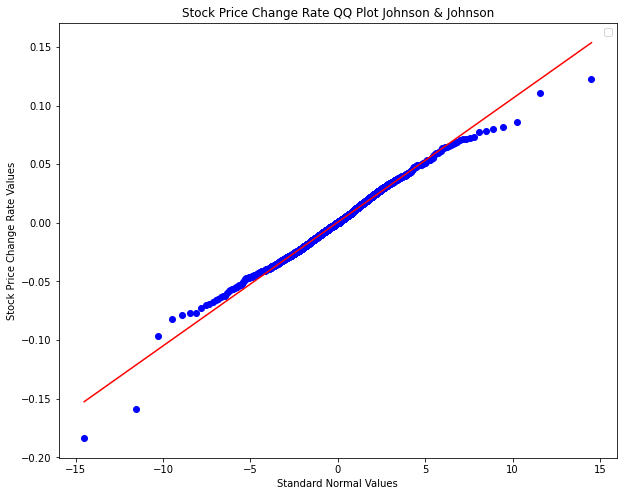

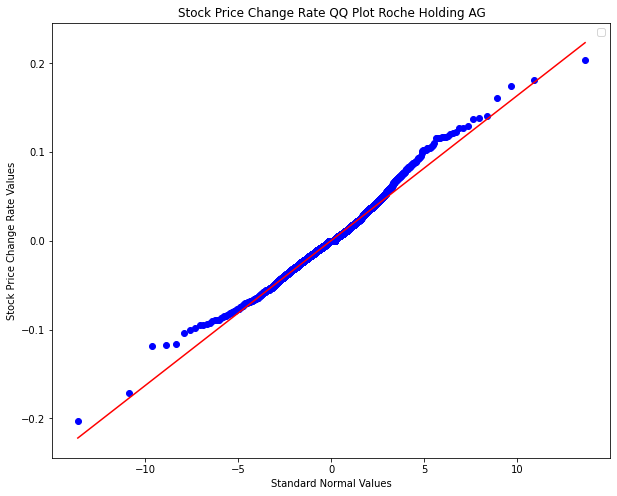

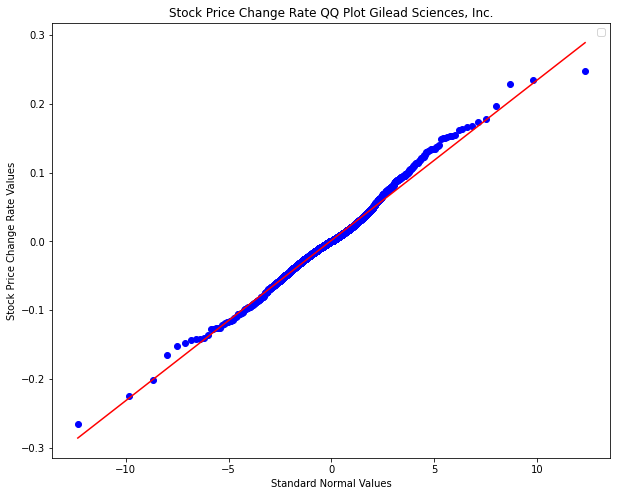

In [75]:
def plot_stock_qqplot(model, name, window_size):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    t_df = 4
    # theoretical_quantiles = t.ppf(np.linspace(0.01, 0.99, len(test_y)), df=t_df)
    stats.probplot(train_y, dist=t, sparams=(t_df,), plot=plt)
    plt.title('Stock Price Change Rate QQ Plot'+" "+name)
    plt.xlabel('Standard Normal Values')
    plt.ylabel('Stock Price Change Rate Values')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[0::3]:
    plot_stock_qqplot(best_model, name, 1)

After some trials, we found that the distribution of change rate is close to a t distribution with the degree of freedom between 3-5. Its tails is heavier than normal distribution, but not as heavy as t distirbution with degree of freedom of 1 or 2.

Looks like the distribution of the stock price change rate has a lower peak and heavy tail than normal distribution. This means the distribution could have a higher kurtosis value than 3.

In [77]:
from scipy.stats import skew, kurtosis
import numpy as np
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt

def get_stock_statistics(name):
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 5), test_y_dict[name]), axis=1))[:,-1]
    mean_value = np.mean(test_y)
    variance_value = np.var(test_y)
    skewness_value = skew(test_y)
    kurtosis_value = kurtosis(test_y)

    return [mean_value, variance_value, skewness_value, kurtosis_value]

columns = ["Mean", "Variance", "Skewness", "Kurtosis"]
df = pd.DataFrame([get_stock_statistics(name) for name in list(dict_stock.keys())[0::1]], columns=columns)
df.index = dict_stock.keys()
df


,Mean,Variance,Skewness,Kurtosis
Apple Inc.,0.000736,0.000211,-0.006166,2.760613
Microsoft Corporation,0.001151,0.000206,0.930114,9.308568
Alphabet Inc.,0.000728,0.000147,-0.889537,3.587724
Amazon.com Inc.,0.001881,0.000212,1.726632,16.457004
Intel Corporation,0.000661,0.000217,0.244814,6.038590
"Cisco Systems, Inc.",0.000818,0.000174,0.027081,7.242541
NVIDIA Corporation,0.003937,0.000813,2.703834,27.960642
Adobe Inc.,0.001477,0.000232,0.177842,8.639795
IBM,-0.000053,0.000142,-0.608616,7.569054
Oracle Corporation,0.000221,0.000172,-0.582776,8.692239


In [78]:
from scipy.stats import skew, kurtosis
import numpy as np
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt

def get_stock_statistics(name):
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].reshape(-1,1).shape[0], 5), train_y_dict[name].reshape(-1,1)), axis=1))[:,-1]
    mean_value = np.mean(train_y)
    variance_value = np.var(train_y)
    skewness_value = skew(train_y)
    kurtosis_value = kurtosis(train_y)

    return [mean_value, variance_value, skewness_value, kurtosis_value]

columns = ["Mean", "Variance", "Skewness", "Kurtosis"]
df = pd.DataFrame([get_stock_statistics(name) for name in list(dict_stock.keys())[0::1]], columns=columns)
df.index = dict_stock.keys()
df

,Mean,Variance,Skewness,Kurtosis
Apple Inc.,0.001229,0.000901,-0.388150,17.922407
Microsoft Corporation,0.000932,0.000474,-0.228116,11.847445
Alphabet Inc.,0.000753,0.000350,0.976460,13.398450
Amazon.com Inc.,0.001338,0.001442,1.052474,10.840259
Intel Corporation,0.000971,0.000683,-0.038874,4.701838
"Cisco Systems, Inc.",0.001137,0.000733,0.242656,6.768479
NVIDIA Corporation,0.001047,0.001406,0.194327,10.628636
Adobe Inc.,0.001163,0.001025,0.063389,8.522820
IBM,0.000374,0.000290,-2.456844,72.139893
Oracle Corporation,0.001305,0.001065,1.119994,27.342606


In [ ]:

pred_mse_list = get_pred_mse()
mse_df[f"{Scaler}Scaler Prediction ({str(input_day_num)} previous days)"] = pred_mse_list


## An alternative approach to this problem changing all features into change rate.

In [10]:
data_dfs["Apple Inc."]

,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,
1980-12-12,0.422706,0.424470,0.422706,0.422706,117258400.0
1980-12-15,0.402563,0.402563,0.400652,0.400652,43971200.0
1980-12-16,0.373010,0.373010,0.371246,0.371246,26432000.0
1980-12-17,0.380362,0.382273,0.380362,0.380362,21610400.0
1980-12-18,0.391536,0.393300,0.391536,0.391536,18362400.0
...,...,...,...,...,...
2018-03-21,175.040000,175.090000,171.260000,171.270000,35247358.0
2018-03-22,170.000000,172.680000,168.600000,168.845000,41051076.0
2018-03-23,168.390000,169.920000,164.940000,164.940000,40248954.0


In [11]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

input_day_num = 200
Scaler = "MinMax"

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,3]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    if Scaler == "MinMax":
        scaler = MinMaxScaler()
    if Scaler == "Standard":
        scaler = StandardScaler()
    val_2 = val.pct_change().dropna().replace([np.inf, -np.inf], np.nan).fillna(0)
    # print(val_2.max())
    df_standardized_array = scaler.fit_transform(val_2)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, input_day_num, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)



train_data_X shape:  (176486, 200, 5) 
 train_data_y shape:  (176486, 1)


In [12]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler

initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)

def lr_schedule(epoch):
    """
    Returns a learning rate based on the epoch number.
    You can customize this function based on your needs.
    """
    learning_rate = initial_learning_rate
    if epoch > 7:
        learning_rate = 0.0001  # Adjust the learning rate after a certain number of epochs
    return learning_rate

lr_scheduler = LearningRateScheduler(lr_schedule)

model = Sequential()
model.add(Conv2D(128, (10, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (8, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(32, (6, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
model.add(Conv2D(8, (2, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
# model.add(Dropout(0.5))
model.add(Dense(1, activation='linear'))
model.compile(optimizer=optimizer, loss='mean_absolute_error')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 191, 4, 128)       2688      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 95, 2, 128)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 88, 1, 64)         131136    
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 44, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 39, 1, 32)         12320     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 19, 1, 32)        

In [14]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint,lr_scheduler])

Epoch 1/35
255/256 [============================>.] - ETA: 0s - loss: 0.0335
Epoch 1: val_loss improved from inf to 0.02275, saving model to best_model.h5
256/256 [==============================] - 13s 49ms/step - loss: 0.0335 - val_loss: 0.0228 - lr: 0.0010
Epoch 2/35
255/256 [============================>.] - ETA: 0s - loss: 0.0324
Epoch 2: val_loss improved from 0.02275 to 0.02156, saving model to best_model.h5
256/256 [==============================] - 12s 45ms/step - loss: 0.0324 - val_loss: 0.0216 - lr: 0.0010
Epoch 3/35
255/256 [============================>.] - ETA: 0s - loss: 0.0308
Epoch 3: val_loss did not improve from 0.02156
256/256 [==============================] - 12s 47ms/step - loss: 0.0308 - val_loss: 0.0243 - lr: 0.0010
Epoch 4/35
256/256 [==============================] - ETA: 0s - loss: 0.0295
Epoch 4: val_loss did not improve from 0.02156
256/256 [==============================] - 12s 46ms/step - loss: 0.0295 - val_loss: 0.0234 - lr: 0.0010
Epoch 5/35
255/256 [==

KeyboardInterrupt: 

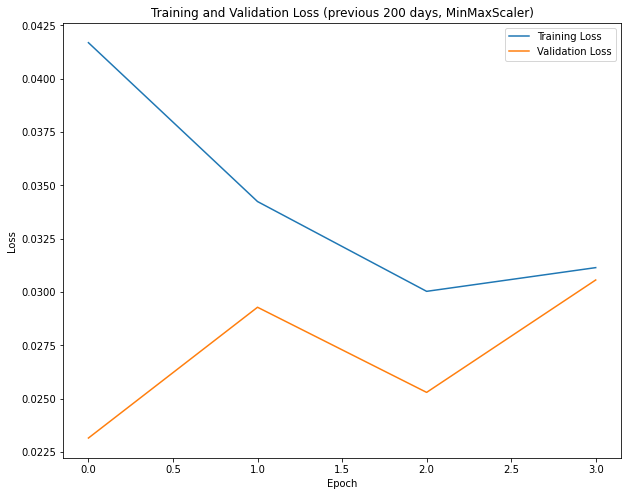

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss' + f" (previous {input_day_num} days, {Scaler}Scaler)")
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.legend()
plt.show()

91/91 [==============================] - 2s 17ms/step


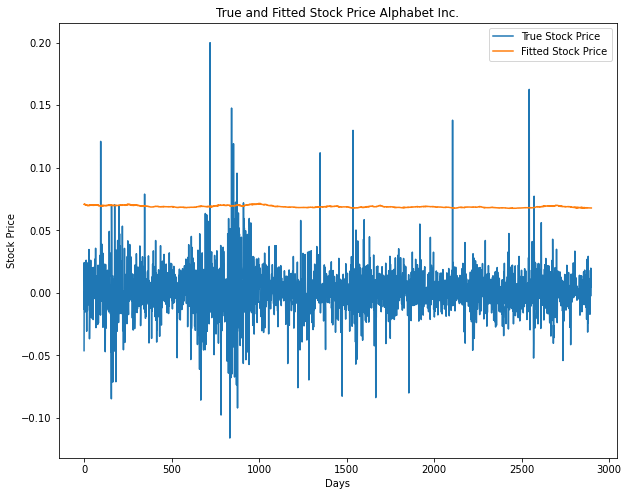

219/219 [==============================] - 3s 15ms/step


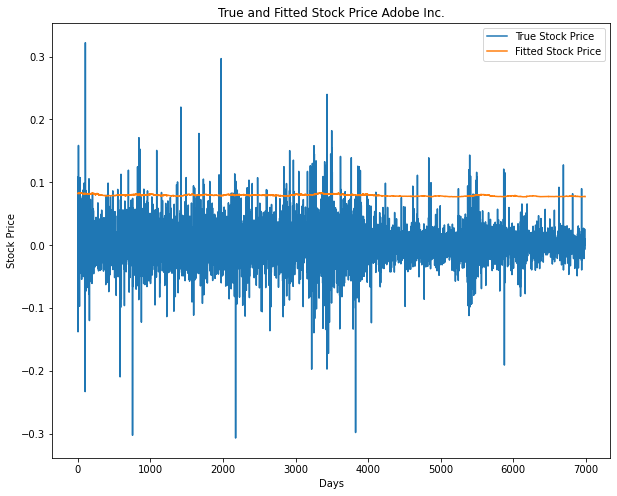

243/243 [==============================] - 4s 15ms/step


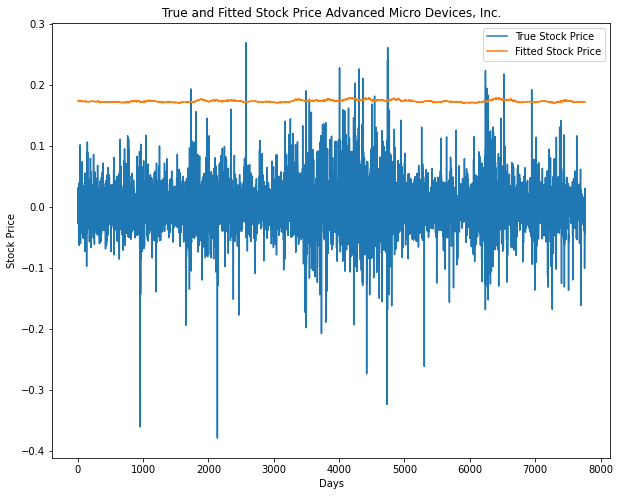

337/337 [==============================] - 5s 16ms/step


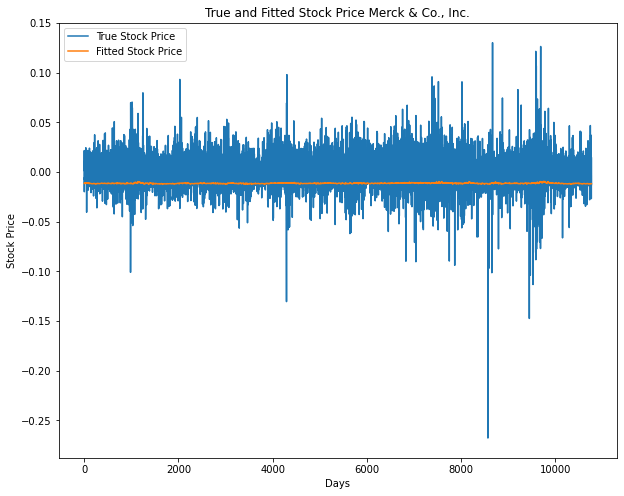

320/320 [==============================] - 5s 15ms/step


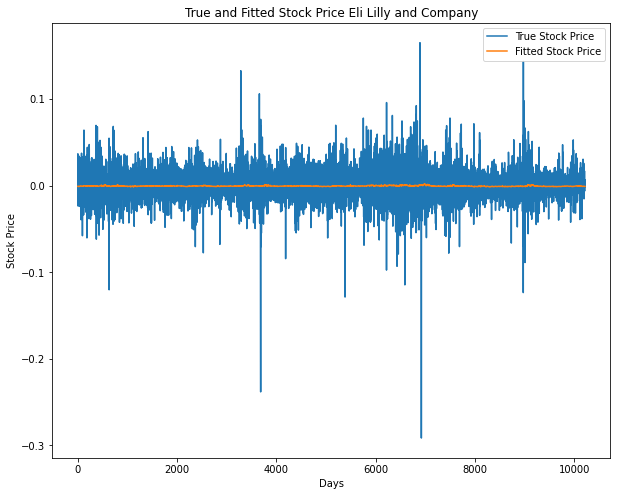

In [17]:

import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), train_y_dict[name], np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 3), model.predict(train_X), np.random.rand(train_y_dict[name].shape[0], 1)), axis=1))[:,3]
    plt.figure(figsize=(10, 8))
    plt.plot(train_y[window_size:], label='True Stock Price')
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Price')
    plt.title('True and Fitted Stock Price'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::5]:
    plot_stock_fit(best_model, name, 1)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint,lr_scheduler])

## Still using change rate as features, but using trading volumes change rate as target

In [18]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

input_day_num = 200
Scaler = "MinMax"

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:]
        target = data[i+input_days:i+input_days+output_days,4]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    if Scaler == "MinMax":
        scaler = MinMaxScaler()
    if Scaler == "Standard":
        scaler = StandardScaler()
    val_2 = val.pct_change().dropna().replace([np.inf, -np.inf], np.nan).fillna(0)
    # print(val_2.max())
    df_standardized_array = scaler.fit_transform(val_2)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, input_day_num, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

train_data_X shape:  (176486, 200, 5) 
 train_data_y shape:  (176486, 1)


In [19]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler

initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)

def lr_schedule(epoch):
    """
    Returns a learning rate based on the epoch number.
    You can customize this function based on your needs.
    """
    learning_rate = initial_learning_rate
    if epoch > 7:
        learning_rate = 0.0001  # Adjust the learning rate after a certain number of epochs
    return learning_rate

lr_scheduler = LearningRateScheduler(lr_schedule)

model = Sequential()
model.add(Conv2D(128, (10, 2), input_shape=(input_day_num, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (8, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(32, (6, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
model.add(Conv2D(8, (2, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
# model.add(Dropout(0.5))
model.add(Dense(1, activation='linear'))
model.compile(optimizer=optimizer, loss='mean_absolute_error')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 191, 4, 128)       2688      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 95, 2, 128)        0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 88, 1, 64)         131136    
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 44, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 39, 1, 32)         12320     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 19, 1, 32)        

In [20]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint,lr_scheduler])

Epoch 1/35
255/256 [============================>.] - ETA: 0s - loss: 0.0250
Epoch 1: val_loss improved from inf to 0.01651, saving model to best_model.h5


c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


256/256 [==============================] - 38s 62ms/step - loss: 0.0250 - val_loss: 0.0165 - lr: 0.0010
Epoch 2/35
256/256 [==============================] - ETA: 0s - loss: 0.0243
Epoch 2: val_loss improved from 0.01651 to 0.01633, saving model to best_model.h5
256/256 [==============================] - 14s 54ms/step - loss: 0.0243 - val_loss: 0.0163 - lr: 0.0010
Epoch 3/35
255/256 [============================>.] - ETA: 0s - loss: 0.0245
Epoch 3: val_loss did not improve from 0.01633
256/256 [==============================] - 13s 52ms/step - loss: 0.0245 - val_loss: 0.0167 - lr: 0.0010
Epoch 4/35
255/256 [============================>.] - ETA: 0s - loss: 0.0244
Epoch 4: val_loss did not improve from 0.01633
256/256 [==============================] - 14s 53ms/step - loss: 0.0244 - val_loss: 0.0169 - lr: 0.0010
Epoch 5/35
255/256 [============================>.] - ETA: 0s - loss: 0.0242
Epoch 5: val_loss did not improve from 0.01633
256/256 [==============================] - 13s 50ms/s

91/91 [==============================] - 3s 28ms/step


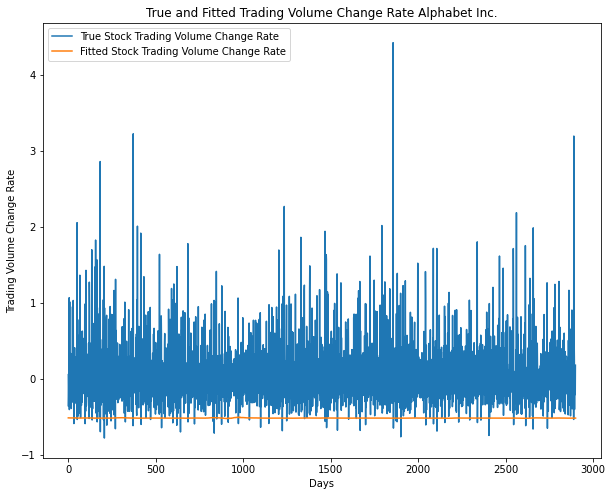

219/219 [==============================] - 4s 17ms/step


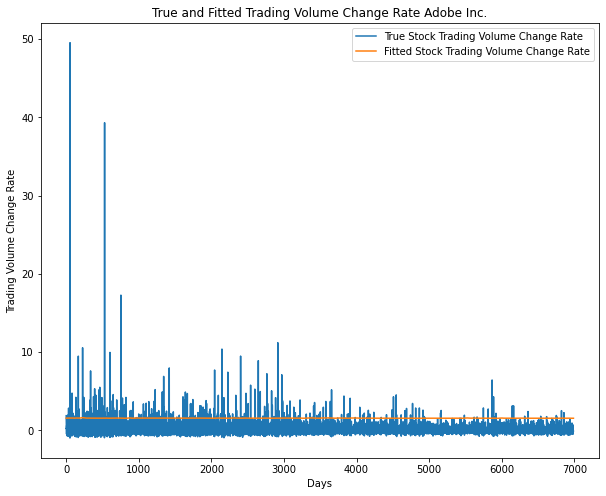

243/243 [==============================] - 4s 15ms/step


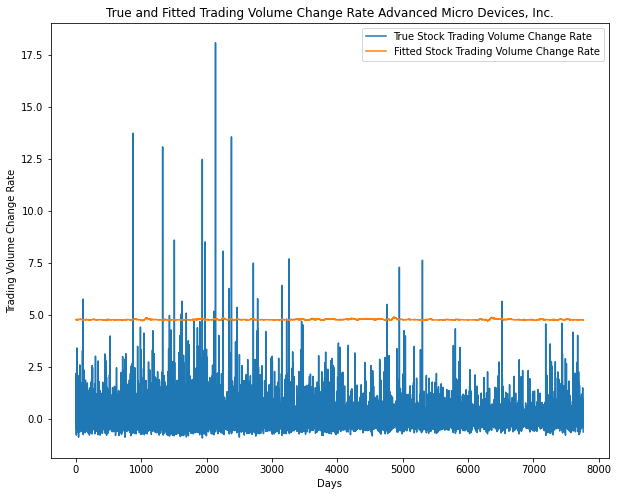

337/337 [==============================] - 5s 15ms/step


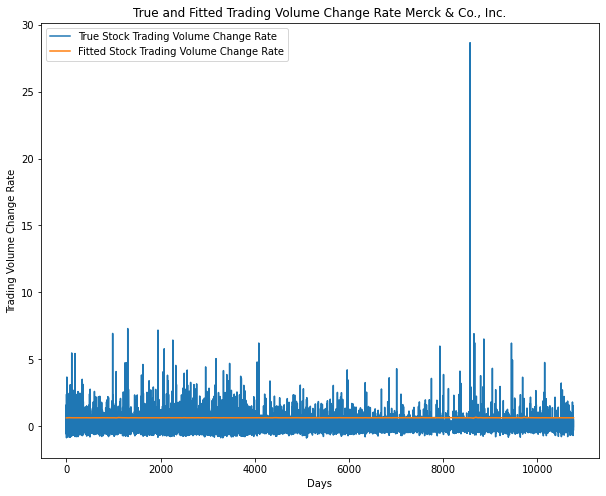

320/320 [==============================] - 5s 17ms/step


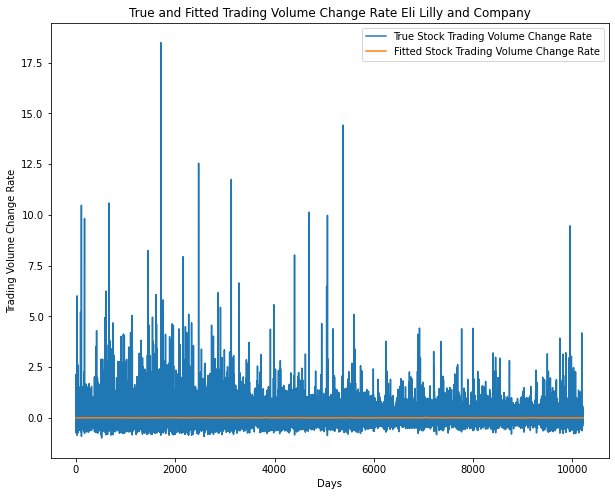

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stock_fit(model, name, window_size):
    train_X = train_X_dict[name]
    train_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 4), train_y_dict[name]), axis=1))[:,-1]
    fit_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(train_y_dict[name].shape[0], 4), model.predict(train_X)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.plot(train_y[window_size:], label='True Stock Trading Volume Change Rate')
    plt.plot(np.array(pd.Series(fit_y.flatten()).rolling(window=window_size).mean()), label='Fitted Stock Trading Volume Change Rate')
    plt.title('True and Fitted Trading Volume Change Rate'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Trading Volume Change Rate')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::5]:
    plot_stock_fit(best_model, name, 1)

In [ ]:
def plot_stock_fit(model, name, window_size):
    test_X = test_X_dict[name]
    test_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 4), test_y_dict[name]), axis=1))[:,-1]
    pred_y = scaler_dict[name].inverse_transform(np.concatenate((np.random.rand(test_y_dict[name].shape[0], 4), model.predict(test_X)), axis=1))[:,-1]
    plt.figure(figsize=(10, 8))
    plt.plot(test_y[window_size:], label='True Stock Price')
    plt.plot(np.array(pd.Series(pred_y.flatten()).rolling(window=window_size).mean()), label='Predicted Stock Price')
    plt.title('True and Predicted Trading Volume Change Rate'+" "+name)
    plt.xlabel('Days')
    plt.ylabel('Trading Volume Change Rate')
    plt.legend()
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::5]:
    plot_stock_fit(best_model, name, 1)

## Fourth Task: Binary Claaification Prediction, Up or Down

In [28]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

input_day_num = 200
Scaler = "MinMax"

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:-1]
        target = data[i+input_days:i+input_days+output_days,-1]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    if Scaler == "MinMax":
        scaler = MinMaxScaler()
    if Scaler == "Standard":
        scaler = StandardScaler()
    label = np.array(val.iloc[:,3].diff().apply(lambda x: np.sign(x)+1)).reshape(-1, 1)
    print(key,"num of 1", np.sum(label == 2), "num of -1", np.sum(label == 0), "num of 0", np.sum(label == 1))
    df_standardized_array = scaler.fit_transform(val)
    df_standardized_array = np.concatenate((df_standardized_array, label), axis=1)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, input_day_num, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

Apple Inc. num of 1 4620 num of -1 4410 num of 0 369
Microsoft Corporation num of 1 4037 num of -1 3834 num of 0 204
Alphabet Inc. num of 1 1785 num of -1 1636 num of 0 2
Amazon.com Inc. num of 1 2642 num of -1 2570 num of 0 35
Intel Corporation num of 1 4707 num of -1 4473 num of 0 408
Cisco Systems, Inc. num of 1 3613 num of -1 3265 num of 0 177
NVIDIA Corporation num of 1 2453 num of -1 2326 num of 0 45
Adobe Inc. num of 1 3924 num of -1 3782 num of 0 261
IBM num of 1 6923 num of -1 6856 num of 0 375
Oracle Corporation num of 1 3953 num of -1 3763 num of 0 360
Salesforce.com Inc. num of 1 1749 num of -1 1697 num of 0 17
Texas Instruments Incorporated num of 1 5569 num of -1 5429 num of 0 557
Advanced Micro Devices, Inc. num of 1 4091 num of -1 4166 num of 0 571
Applied Materials, Inc. num of 1 4085 num of -1 3958 num of 0 414
Qualcomm Incorporated num of 1 3244 num of -1 3237 num of 0 136
Johnson & Johnson num of 1 5925 num of -1 5738 num of 0 504
Pfizer Inc. num of 1 5223 num of -1

In [29]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(64, (8, 2), input_shape=(200, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 193, 4, 64)        1088      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 96, 2, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 91, 1, 64)         49216     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 45, 1, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 42, 1, 16)         4112      
                                                                 
 conv2d_15 (Conv2D)          (None, 40, 1, 8)         

In [30]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

Epoch 1/35
256/256 [==============================] - ETA: 0s - loss: 0.8805 - accuracy: 0.4755
Epoch 1: val_loss improved from inf to 0.73859, saving model to best_model.h5


c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


256/256 [==============================] - 15s 45ms/step - loss: 0.8805 - accuracy: 0.4755 - val_loss: 0.7386 - val_accuracy: 0.5215
Epoch 2/35
256/256 [==============================] - ETA: 0s - loss: 0.8709 - accuracy: 0.4773
Epoch 2: val_loss improved from 0.73859 to 0.73642, saving model to best_model.h5
256/256 [==============================] - 8s 31ms/step - loss: 0.8709 - accuracy: 0.4773 - val_loss: 0.7364 - val_accuracy: 0.5215
Epoch 3/35
255/256 [============================>.] - ETA: 0s - loss: 0.8712 - accuracy: 0.4718
Epoch 3: val_loss did not improve from 0.73642
256/256 [==============================] - 7s 28ms/step - loss: 0.8709 - accuracy: 0.4722 - val_loss: 0.7390 - val_accuracy: 0.5215
Epoch 4/35
256/256 [==============================] - ETA: 0s - loss: 0.8707 - accuracy: 0.4766
Epoch 4: val_loss did not improve from 0.73642
256/256 [==============================] - 7s 27ms/step - loss: 0.8707 - accuracy: 0.4766 - val_loss: 0.7373 - val_accuracy: 0.5215
Epoch 5

91/91 [==============================] - 1s 11ms/step


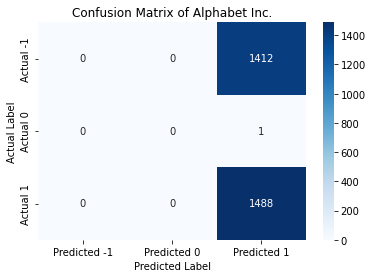

131/131 [==============================] - 1s 11ms/step


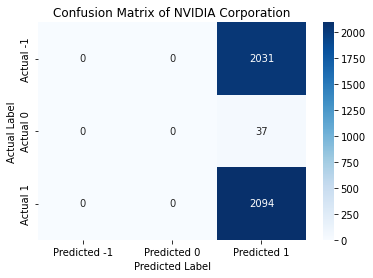

92/92 [==============================] - 1s 12ms/step


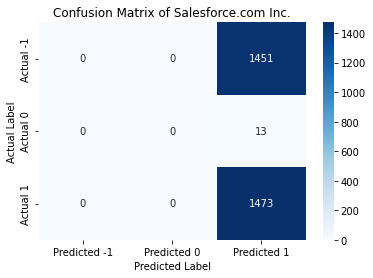

181/181 [==============================] - 2s 11ms/step


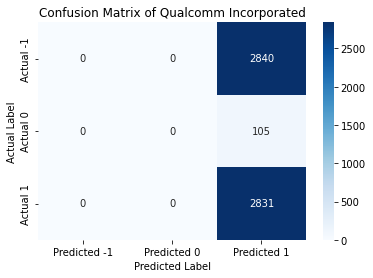

265/265 [==============================] - 3s 10ms/step


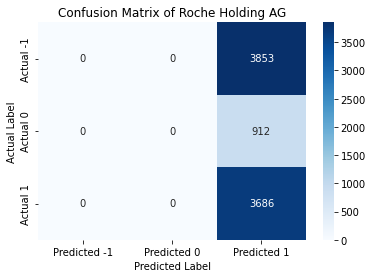

320/320 [==============================] - 3s 8ms/step


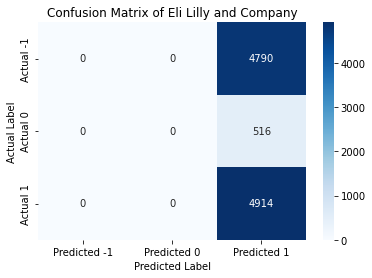

In [38]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def draw_confusion_matrix_fit(model, name):
    train_X = train_X_dict[name]
    train_y = train_y_dict[name]
    fit_y = model.predict(train_X).argmax(axis=1)
    # Create confusion matrix
    cm = confusion_matrix(train_y, fit_y)

    # Plot the confusion matrix using seaborn
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted -1', 'Predicted 0', 'Predicted 1'],
                yticklabels=['Actual -1', 'Actual 0', 'Actual 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.title('Confusion Matrix of '+name)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::4]:
    draw_confusion_matrix_fit(best_model, name)

11/11 [==============================] - 0s 10ms/step


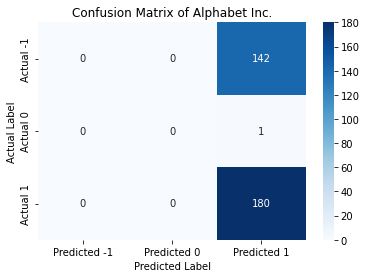

15/15 [==============================] - 0s 14ms/step


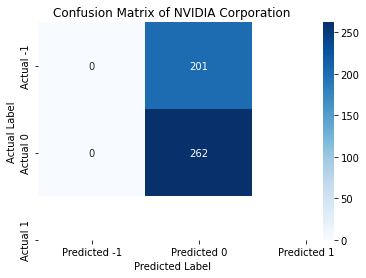

11/11 [==============================] - 0s 9ms/step


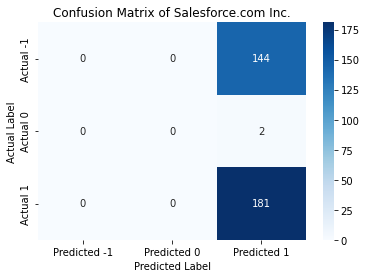

21/21 [==============================] - 0s 8ms/step


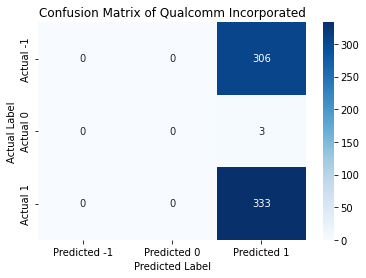

30/30 [==============================] - 0s 8ms/step


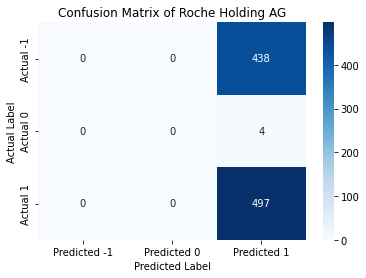

36/36 [==============================] - 0s 8ms/step


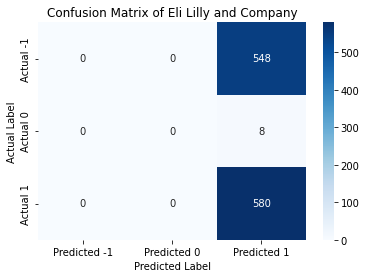

In [43]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def draw_confusion_matrix_pred(model, name):
    test_X = test_X_dict[name]
    test_y = test_y_dict[name]
    pred_y = model.predict(test_X).argmax(axis=1)
    # Create confusion matrix
    cm = confusion_matrix(test_y, pred_y)

    # Plot the confusion matrix using seaborn
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted -1', 'Predicted 0', 'Predicted 1'],
                yticklabels=['Actual -1', 'Actual 0', 'Actual 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.title('Confusion Matrix of '+name)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::4]:
    draw_confusion_matrix_pred(best_model, name)

## Try using change rate for all features and do the binary classification of up and down for adj. closing price

In [25]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

input_day_num = 200
Scaler = "MinMax"

def create_data(data, input_days, output_days):
    sequences = []
    targets = []
    for i in range(len(data) - input_days - output_days + 1):
        seq = data[i:i+input_days,:-1]
        target = data[i+input_days:i+input_days+output_days,-1]
        sequences.append(seq)
        targets.append(target)

    return np.stack(sequences), np.stack(targets)

train_X_all = np.array([])
train_y_all = np.array([])
train_X_dict = {}
train_y_dict = {}
test_X_dict = {}
test_y_dict = {}
scaler_dict = {}

for key,val in data_dfs.items():
    if Scaler == "MinMax":
        scaler = MinMaxScaler()
    if Scaler == "Standard":
        scaler = StandardScaler()
    print(key,"num of 1", np.sum(label == 2), "num of -1", np.sum(label == 0), "num of 0", np.sum(label == 1))
    val_2 = val.pct_change().dropna().replace([np.inf, -np.inf], np.nan).fillna(0)
    label = np.array(val_2.iloc[:,3].apply(lambda x: np.sign(x)+1)).reshape(-1, 1)
    df_standardized_array = scaler.fit_transform(val_2)
    df_standardized_array = np.concatenate((df_standardized_array, label), axis=1)
    scaler_dict[key] = scaler
    X, y = create_data(df_standardized_array, input_day_num, 1)
    train_size = int(0.9 * X.shape[0])
    train_X, test_X = X[:train_size,:], X[train_size:,:]
    train_y, test_y = y[:train_size,:], y[train_size:,:]
    train_X_dict[key] = train_X
    train_y_dict[key] = train_y
    test_X_dict[key] = test_X
    test_y_dict[key] = test_y
    if train_X_all.shape == (0,):
        train_X_all = train_X
    else:
        train_X_all = np.vstack((train_X_all, train_X))
    if train_y_all.shape == (0,):
        train_y_all = train_y
    else:
        train_y_all = np.vstack((train_y_all, train_y))

print("train_data_X shape: ",train_X_all.shape, "\n" ,"train_data_y shape: ", train_y_all.shape)

Apple Inc. num of 1 4620 num of -1 4410 num of 0 369
Microsoft Corporation num of 1 4620 num of -1 4410 num of 0 369
Alphabet Inc. num of 1 4037 num of -1 3834 num of 0 204
Amazon.com Inc. num of 1 1785 num of -1 1636 num of 0 2
Intel Corporation num of 1 2642 num of -1 2570 num of 0 35
Cisco Systems, Inc. num of 1 4707 num of -1 4473 num of 0 408
NVIDIA Corporation num of 1 3613 num of -1 3265 num of 0 177
Adobe Inc. num of 1 2453 num of -1 2326 num of 0 45
IBM num of 1 3924 num of -1 3782 num of 0 261
Oracle Corporation num of 1 6923 num of -1 6856 num of 0 375
Salesforce.com Inc. num of 1 3953 num of -1 3763 num of 0 360
Texas Instruments Incorporated num of 1 1749 num of -1 1697 num of 0 17
Advanced Micro Devices, Inc. num of 1 5569 num of -1 5429 num of 0 557
Applied Materials, Inc. num of 1 4091 num of -1 4166 num of 0 571
Qualcomm Incorporated num of 1 4085 num of -1 3958 num of 0 414
Johnson & Johnson num of 1 3244 num of -1 3237 num of 0 136
Pfizer Inc. num of 1 5925 num of -1

In [26]:
from keras.models import Sequential,load_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Dropout
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint

model = Sequential()
model.add(Conv2D(64, (8, 2), input_shape=(200, 5, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (6, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(16, (4, 1), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 1)))
model.add(Conv2D(8, (3, 1), activation='relu'))
# model.add(Conv2D(8, (3, 1), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 193, 4, 64)        1088      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 96, 2, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 91, 1, 64)         49216     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 45, 1, 64)         0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 42, 1, 16)         4112      
                                                                 
 conv2d_18 (Conv2D)          (None, 40, 1, 8)        

In [29]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(train_X, train_y, epochs=35, batch_size=32, validation_split=0.2, callbacks=[early_stopping,checkpoint])

Epoch 1/35
255/256 [============================>.] - ETA: 0s - loss: 0.8834 - accuracy: 0.4725
Epoch 1: val_loss improved from inf to 0.76615, saving model to best_model.h5
256/256 [==============================] - 8s 31ms/step - loss: 0.8835 - accuracy: 0.4722 - val_loss: 0.7662 - val_accuracy: 0.5215
Epoch 2/35
  5/256 [..............................] - ETA: 7s - loss: 0.8976 - accuracy: 0.4250

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


255/256 [============================>.] - ETA: 0s - loss: 0.8836 - accuracy: 0.4716
Epoch 2: val_loss did not improve from 0.76615
256/256 [==============================] - 6s 25ms/step - loss: 0.8836 - accuracy: 0.4717 - val_loss: 0.7778 - val_accuracy: 0.5215
Epoch 3/35
255/256 [============================>.] - ETA: 0s - loss: 0.8816 - accuracy: 0.4701
Epoch 3: val_loss improved from 0.76615 to 0.76085, saving model to best_model.h5
256/256 [==============================] - 7s 26ms/step - loss: 0.8821 - accuracy: 0.4701 - val_loss: 0.7608 - val_accuracy: 0.5215
Epoch 4/35
256/256 [==============================] - ETA: 0s - loss: 0.8817 - accuracy: 0.4680
Epoch 4: val_loss did not improve from 0.76085
256/256 [==============================] - 6s 24ms/step - loss: 0.8817 - accuracy: 0.4680 - val_loss: 0.7798 - val_accuracy: 0.5215
Epoch 5/35
253/256 [============================>.] - ETA: 0s - loss: 0.8824 - accuracy: 0.4697
Epoch 5: val_loss did not improve from 0.76085
256/256 

91/91 [==============================] - 1s 7ms/step


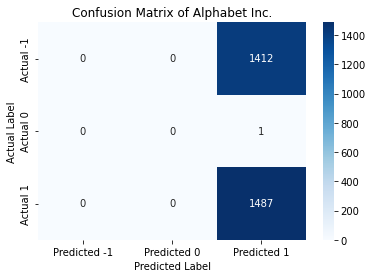

131/131 [==============================] - 1s 8ms/step


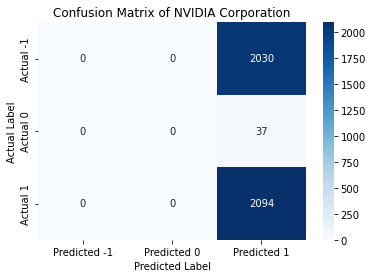

92/92 [==============================] - 1s 7ms/step


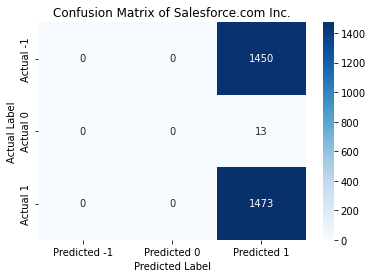

181/181 [==============================] - 1s 7ms/step


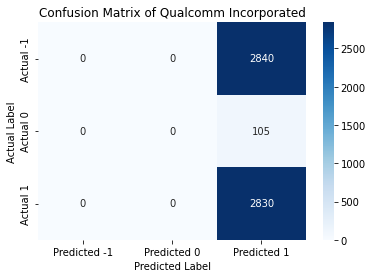

264/264 [==============================] - 2s 8ms/step


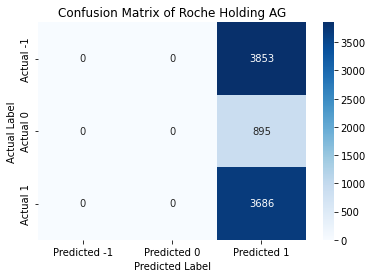

320/320 [==============================] - 2s 7ms/step


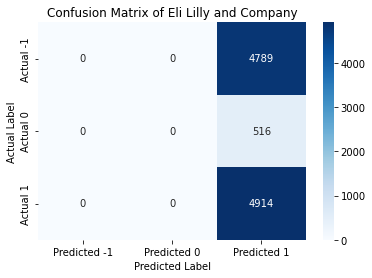

In [30]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def draw_confusion_matrix_fit(model, name):
    train_X = train_X_dict[name]
    train_y = train_y_dict[name]
    fit_y = model.predict(train_X).argmax(axis=1)
    # Create confusion matrix
    cm = confusion_matrix(train_y, fit_y)

    # Plot the confusion matrix using seaborn
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted -1', 'Predicted 0', 'Predicted 1'],
                yticklabels=['Actual -1', 'Actual 0', 'Actual 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.title('Confusion Matrix of '+name)
    plt.show()

best_model = load_model('best_model.h5')

for name in list(dict_stock.keys())[2::4]:
    draw_confusion_matrix_fit(best_model, name)